# Employee Attrition

In [1]:
# =======================================================
# Importing Libraries
# =======================================================

# Suppress warnings for cleaner output
import warnings
warnings.filterwarnings('ignore')

# Core Libraries
import time
import math
from datetime import datetime

# Data Manipulation
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import shap

# Pre-processing & Feature Selection
from sklearn.preprocessing import (
    StandardScaler, OneHotEncoder, MinMaxScaler, LabelEncoder
)
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import SelectKBest, f_classif

# Modeling
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import (
    RandomForestClassifier, AdaBoostClassifier
)
from sklearn.dummy import DummyClassifier
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier

# Pipeline and Imbalanced Data Handling
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.under_sampling import RandomUnderSampler

# Hyperparameter Tuning and Validation
from sklearn.model_selection import (
    GridSearchCV, RandomizedSearchCV, StratifiedKFold, 
    cross_val_score, train_test_split
)

# Evaluation Metrics
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, ConfusionMatrixDisplay, classification_report,
    roc_auc_score, roc_curve, RocCurveDisplay, make_scorer,
    precision_recall_curve, PrecisionRecallDisplay
)

# Set default plotting style
plt.style.use("fivethirtyeight")

print("All modules loaded successfully.")

All modules loaded successfully.


In [204]:
# Define the file path
file_path = "data/Employee_Attrition.csv"

# Try reading the file with low_memory=False to avoid DtypeWarning
df = pd.read_csv(file_path, low_memory=False)

# Display the first few rows to inspect the data
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Employee Source
0,41.0,Voluntary Resignation,Travel_Rarely,1102.0,Sales,1,2.0,Life Sciences,1,1,...,80.0,0.0,8.0,0.0,1.0,6.0,4.0,0.0,5.0,Referral
1,41.0,Voluntary Resignation,Travel_Rarely,1102.0,Sales,1,2.0,Life Sciences,1,1,...,80.0,0.0,8.0,0.0,1.0,6.0,4.0,0.0,5.0,Referral
2,41.0,Voluntary Resignation,Travel_Rarely,1102.0,Sales,1,2.0,Life Sciences,1,7,...,80.0,0.0,8.0,0.0,1.0,6.0,4.0,0.0,5.0,Referral
3,41.0,Voluntary Resignation,Travel_Rarely,1102.0,Sales,1,2.0,Life Sciences,1,8,...,80.0,0.0,8.0,0.0,1.0,6.0,4.0,0.0,5.0,Referral
4,41.0,Voluntary Resignation,Travel_Rarely,1102.0,Sales,1,2.0,Life Sciences,1,9,...,80.0,0.0,8.0,0.0,1.0,6.0,4.0,0.0,5.0,Referral


In [205]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,23433.0,36.936671,9.137432,18.0,30.0,36.0,43.0,60.0
DailyRate,23424.0,801.828765,403.206166,102.0,465.0,802.0,1157.0,1499.0
Education,23424.0,2.910050,1.024931,1.0,2.0,3.0,4.0,6.0
EnvironmentSatisfaction,23427.0,13.681777,1186.544372,1.0,2.0,3.0,4.0,129588.0
JobInvolvement,23427.0,2.733811,0.836860,1.0,2.0,3.0,3.0,54.0
JobLevel,23429.0,2.064023,1.105421,1.0,1.0,2.0,3.0,5.0
MonthlyRate,23425.0,14304.343821,7102.636293,2094.0,8053.0,14222.0,20460.0,26999.0
NumCompaniesWorked,23427.0,3.887779,155.332904,0.0,1.0,2.0,4.0,23258.0
PerformanceRating,23426.0,3.155852,0.371215,3.0,3.0,3.0,3.0,13.0
RelationshipSatisfaction,23428.0,2.713334,1.080030,1.0,2.0,3.0,4.0,4.0


In [206]:
df.shape

(23436, 37)

In [207]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23436 entries, 0 to 23435
Data columns (total 37 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       23433 non-null  float64
 1   Attrition                 23423 non-null  object 
 2   BusinessTravel            23428 non-null  object 
 3   DailyRate                 23424 non-null  float64
 4   Department                23425 non-null  object 
 5   DistanceFromHome          23427 non-null  object 
 6   Education                 23424 non-null  float64
 7   EducationField            23427 non-null  object 
 8   EmployeeCount             23431 non-null  object 
 9   EmployeeNumber            23435 non-null  object 
 10  Application ID            23433 non-null  object 
 11  EnvironmentSatisfaction   23427 non-null  float64
 12  Gender                    23426 non-null  object 
 13  HourlyRate                23427 non-null  object 
 14  JobInv

In [208]:
# Replace '.' with '_' in column names
df.columns = df.columns.str.replace(' ', '')

In [209]:
df.Attrition.value_counts(normalize=True).round(3)

Attrition
Current employee         0.842
Voluntary Resignation    0.158
Name: proportion, dtype: float64

In [210]:
# Check for duplicates
df.duplicated().sum()

14

In [211]:
# Drop duplicate records
df = df.drop_duplicates()

In [212]:
#Check for missing values
df.isna().sum()

Age                          3
Attrition                   13
BusinessTravel               8
DailyRate                   12
Department                  11
DistanceFromHome             9
Education                   12
EducationField               9
EmployeeCount                5
EmployeeNumber               1
ApplicationID                3
EnvironmentSatisfaction      9
Gender                      10
HourlyRate                   9
JobInvolvement               9
JobLevel                     7
JobRole                      9
JobSatisfaction              9
MaritalStatus               11
MonthlyIncome               13
MonthlyRate                 11
NumCompaniesWorked           9
Over18                      10
OverTime                    12
PercentSalaryHike           14
PerformanceRating           10
RelationshipSatisfaction     8
StandardHours               10
StockOptionLevel             9
TotalWorkingYears            8
TrainingTimesLastYear       11
WorkLifeBalance             10
YearsAtC

In [213]:
# Drop rows with missing values
df_cleaned = df.dropna()

In [214]:
# 'unknown' values per categorical column
unknown_summary = {
    col: ((df_cleaned[col] == 'unknown').sum()) for col in df.select_dtypes(include=['object']).columns
}

unknown_summary

{'Attrition': 0,
 'BusinessTravel': 0,
 'Department': 0,
 'DistanceFromHome': 0,
 'EducationField': 0,
 'EmployeeCount': 0,
 'EmployeeNumber': 0,
 'ApplicationID': 0,
 'Gender': 0,
 'HourlyRate': 0,
 'JobRole': 0,
 'JobSatisfaction': 0,
 'MaritalStatus': 0,
 'MonthlyIncome': 0,
 'Over18': 0,
 'OverTime': 0,
 'PercentSalaryHike': 0,
 'EmployeeSource': 0}

In [215]:
# Detect outliers using IQR method
numerical_columns = df_cleaned.select_dtypes(include=['float64', 'int64']).columns
outlier_counts = {}
for col in numerical_columns:
    Q1 = df_cleaned[col].quantile(0.25)
    Q3 = df_cleaned[col].quantile(0.75)
    IQR = Q3 - Q1
    outliers = df_cleaned[(df_cleaned[col] < (Q1 - 1.5 * IQR)) | (df_cleaned[col] > (Q3 + 1.5 * IQR))]
    outlier_counts[col] = len(outliers)

outlier_df = pd.DataFrame.from_dict(outlier_counts, orient='index', columns=['Outlier Count'])
outlier_df

,Outlier Count
Age,0
DailyRate,0
Education,0
EnvironmentSatisfaction,0
JobInvolvement,0
JobLevel,0
MonthlyRate,0
NumCompaniesWorked,810
PerformanceRating,3600
RelationshipSatisfaction,0


In [216]:
df_cleaned.shape

(23190, 37)

In [217]:
df_cleaned.describe()

,Age,DailyRate,Education,EnvironmentSatisfaction,JobInvolvement,JobLevel,MonthlyRate,NumCompaniesWorked,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,23190.000000,23190.000000,23190.000000,23190.000000,23190.000000,23190.000000,23190.000000,23190.000000,23190.000000,23190.000000,23190.0,23190.000000,23190.000000,23190.000000,23190.000000,23190.000000,23190.000000,23190.000000,23190.000000
mean,36.922941,802.246313,2.908754,2.719879,2.730574,2.065373,14302.076757,2.688702,3.155239,2.713497,80.0,0.794437,11.269211,2.798879,2.761665,7.016947,4.230530,2.182191,4.130487
std,9.116307,403.207375,1.024915,1.094924,0.710093,1.105947,7100.061799,2.498330,0.362140,1.080735,0.0,0.850685,7.765751,1.289952,0.705312,6.138112,3.626984,3.215755,3.571966
min,18.000000,102.000000,1.000000,1.000000,1.000000,1.000000,2094.000000,0.000000,3.000000,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,2.000000,1.000000,8053.000000,1.000000,3.000000,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,3.000000,3.000000,3.000000,2.000000,14222.000000,2.000000,3.000000,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,4.000000,4.000000,3.000000,3.000000,20460.000000,4.000000,3.000000,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,10.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,5.000000,4.000000,4.000000,5.000000,26999.000000,9.000000,4.000000,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


In [218]:
df_cleaned.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,23190.0,36.922941,9.116307,18.0,30.0,36.0,43.0,60.0
DailyRate,23190.0,802.246313,403.207375,102.0,465.0,802.0,1157.0,1499.0
Education,23190.0,2.908754,1.024915,1.0,2.0,3.0,4.0,5.0
EnvironmentSatisfaction,23190.0,2.719879,1.094924,1.0,2.0,3.0,4.0,4.0
JobInvolvement,23190.0,2.730574,0.710093,1.0,2.0,3.0,3.0,4.0
JobLevel,23190.0,2.065373,1.105947,1.0,1.0,2.0,3.0,5.0
MonthlyRate,23190.0,14302.076757,7100.061799,2094.0,8053.0,14222.0,20460.0,26999.0
NumCompaniesWorked,23190.0,2.688702,2.498330,0.0,1.0,2.0,4.0,9.0
PerformanceRating,23190.0,3.155239,0.362140,3.0,3.0,3.0,3.0,4.0
RelationshipSatisfaction,23190.0,2.713497,1.080735,1.0,2.0,3.0,4.0,4.0


In [219]:
# Unique values per column
df_cleaned.nunique()

Age                            43
Attrition                       2
BusinessTravel                  3
DailyRate                     883
Department                      3
DistanceFromHome               29
Education                       5
EducationField                  7
EmployeeCount                   1
EmployeeNumber              23141
ApplicationID               23190
EnvironmentSatisfaction         4
Gender                          2
HourlyRate                     71
JobInvolvement                  4
JobLevel                        5
JobRole                         9
JobSatisfaction                 4
MaritalStatus                   3
MonthlyIncome                1349
MonthlyRate                  1427
NumCompaniesWorked             10
Over18                          1
OverTime                        2
PercentSalaryHike              15
PerformanceRating               2
RelationshipSatisfaction        4
StandardHours                   1
StockOptionLevel                4
TotalWorkingYe

In [220]:
# Correlation matrix for numeric columns
correlation_matrix = df_cleaned[numerical_columns].corr()
correlation_matrix

,Age,DailyRate,Education,EnvironmentSatisfaction,JobInvolvement,JobLevel,MonthlyRate,NumCompaniesWorked,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,0.012778,0.209577,-0.005118,-0.005552,0.249829,0.036192,0.035073,-0.007806,0.015963,NaN,0.006576,0.325684,0.000090,-0.003373,0.140571,0.099685,0.099153,0.081925
DailyRate,0.012778,1.000000,-0.019011,0.005777,0.010538,-0.020115,-0.013757,0.017166,0.010069,-0.008017,NaN,0.012023,-0.000218,-0.025568,-0.033629,-0.038988,-0.019449,-0.034171,-0.040121
Education,0.209577,-0.019011,1.000000,-0.028119,0.021088,0.047645,-0.004689,0.029360,-0.006218,-0.022006,NaN,0.018450,0.071316,-0.005303,0.007677,0.027507,0.042978,0.034850,0.038861
EnvironmentSatisfaction,-0.005118,0.005777,-0.028119,1.000000,-0.016484,-0.011586,0.025315,0.000470,-0.007348,-0.029997,NaN,0.027023,-0.011930,-0.006182,0.015176,-0.013647,-0.004403,-0.000128,-0.017701
JobInvolvement,-0.005552,0.010538,0.021088,-0.016484,1.000000,-0.016010,-0.010767,0.001678,-0.016613,0.031520,NaN,0.018607,-0.008086,-0.013211,-0.013012,-0.025973,0.003037,-0.024431,0.018673
JobLevel,0.249829,-0.020115,0.047645,-0.011586,-0.016010,1.000000,0.035734,-0.002810,-0.001544,0.019171,NaN,0.009930,0.766598,-0.018382,0.034847,0.523205,0.380442,0.347055,0.368308
MonthlyRate,0.036192,-0.013757,-0.004689,0.025315,-0.010767,0.035734,1.000000,0.003427,0.005161,-0.007338,NaN,-0.005832,0.026477,0.000741,0.006247,-0.018415,-0.009750,0.006475,-0.030122
NumCompaniesWorked,0.035073,0.017166,0.029360,0.000470,0.001678,-0.002810,0.003427,1.000000,-0.024038,0.010856,NaN,0.004972,0.016138,-0.016524,0.015747,-0.119517,-0.080013,-0.045023,-0.097793
PerformanceRating,-0.007806,0.010069,-0.006218,-0.007348,-0.016613,-0.001544,0.005161,-0.024038,1.000000,-0.017584,NaN,-0.001536,0.014182,-0.012367,-0.007765,0.013580,0.029847,0.015853,0.030312
RelationshipSatisfaction,0.015963,-0.008017,-0.022006,-0.029997,0.031520,0.019171,-0.007338,0.010856,-0.017584,1.000000,NaN,-0.044878,0.023685,0.004911,0.017962,0.015190,-0.018927,0.032206,-0.003966


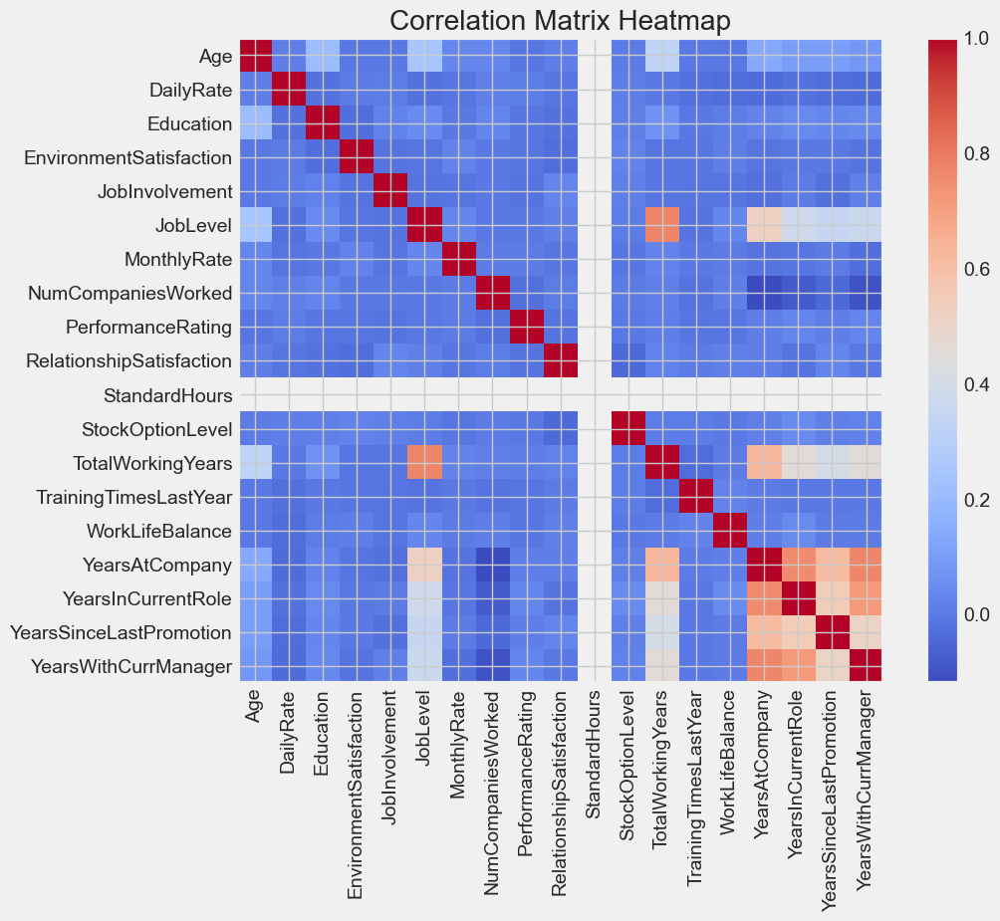

In [221]:
# Visualize correlation matrix
plt.figure(figsize=(10, 8))
plt.imshow(correlation_matrix, cmap='coolwarm', interpolation='nearest')
plt.colorbar()
plt.title("Correlation Matrix Heatmap")
plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.show()

## Engineering Features

In [223]:
# Detect outliers using IQR method
numerical_columns = df_cleaned.select_dtypes(include=['float64', 'int64']).columns
outlier_counts = {}
for col in numerical_columns:
    Q1 = df_cleaned[col].quantile(0.25)
    Q3 = df_cleaned[col].quantile(0.75)
    IQR = Q3 - Q1
    outliers = df_cleaned[(df_cleaned[col] < (Q1 - 1.5 * IQR)) | (df_cleaned[col] > (Q3 + 1.5 * IQR))]
    outlier_counts[col] = len(outliers)

outlier_df = pd.DataFrame.from_dict(outlier_counts, orient='index', columns=['Outlier Count'])
outlier_df

,Outlier Count
Age,0
DailyRate,0
Education,0
EnvironmentSatisfaction,0
JobInvolvement,0
JobLevel,0
MonthlyRate,0
NumCompaniesWorked,810
PerformanceRating,3600
RelationshipSatisfaction,0


In [224]:
df_cleaned['NumCompaniesWorked'].value_counts()

NumCompaniesWorked
1.0    8209
0.0    3144
3.0    2493
2.0    2303
4.0    2181
7.0    1167
6.0    1104
5.0     994
9.0     810
8.0     785
Name: count, dtype: int64

In [225]:
df_cleaned['PerformanceRating'].value_counts()

PerformanceRating
3.0    19590
4.0     3600
Name: count, dtype: int64

In [226]:
df_cleaned['StockOptionLevel'].value_counts()

StockOptionLevel
0.0    9938
1.0    9407
2.0    2519
3.0    1326
Name: count, dtype: int64

In [227]:
df_cleaned['TotalWorkingYears'].value_counts()

TotalWorkingYears
10.0    3214
6.0     1970
8.0     1626
9.0     1525
5.0     1381
7.0     1274
1.0     1264
4.0      978
12.0     751
3.0      665
15.0     617
16.0     610
11.0     567
13.0     566
21.0     536
17.0     511
14.0     486
2.0      482
20.0     476
18.0     423
23.0     352
19.0     349
22.0     327
24.0     286
26.0     221
28.0     220
25.0     219
0.0      202
29.0     159
32.0     148
31.0     146
33.0     110
27.0     104
30.0     103
36.0      90
34.0      81
37.0      55
35.0      45
40.0      35
38.0      16
Name: count, dtype: int64

In [228]:
df_cleaned['TrainingTimesLastYear'].value_counts()

TrainingTimesLastYear
2.0    8641
3.0    7729
4.0    1949
5.0    1861
1.0    1120
6.0    1036
0.0     854
Name: count, dtype: int64

In [229]:
df_cleaned['YearsAtCompany'].value_counts()

YearsAtCompany
5.0     3084
1.0     2687
3.0     2005
2.0     1993
10.0    1913
4.0     1736
7.0     1405
9.0     1286
8.0     1259
6.0     1200
0.0      726
11.0     509
20.0     434
13.0     366
15.0     309
14.0     303
22.0     237
12.0     218
21.0     217
18.0     203
16.0     196
19.0     174
17.0     142
24.0      95
33.0      84
26.0      64
25.0      64
32.0      48
31.0      48
23.0      32
27.0      31
29.0      30
36.0      30
34.0      16
37.0      16
30.0      15
40.0      15
Name: count, dtype: int64

In [230]:
df_cleaned['YearsInCurrentRole'].value_counts()

YearsInCurrentRole
2.0     5878
0.0     3877
7.0     3488
3.0     2121
4.0     1611
8.0     1415
9.0     1063
1.0      875
6.0      589
5.0      585
10.0     452
11.0     358
13.0     218
14.0     174
12.0     148
15.0     133
16.0     110
17.0      63
18.0      32
Name: count, dtype: int64

In [231]:
df_cleaned['YearsSinceLastPromotion'].value_counts()

YearsSinceLastPromotion
0.0     9178
1.0     5624
2.0     2514
7.0     1206
4.0      954
3.0      835
5.0      703
6.0      501
11.0     374
8.0      281
9.0      266
15.0     204
13.0     157
12.0     155
14.0     143
10.0      95
Name: count, dtype: int64

In [232]:
df_cleaned['YearsWithCurrManager'].value_counts()

YearsWithCurrManager
2.0     5410
0.0     4151
7.0     3413
3.0     2230
8.0     1683
4.0     1550
1.0     1199
9.0     1032
5.0      487
6.0      454
10.0     429
11.0     346
12.0     274
13.0     233
17.0     112
14.0      78
15.0      78
16.0      31
Name: count, dtype: int64

In [233]:
# Create a dictionary with unique values and their data types for each column
unique_values_dict = {col: (df_cleaned[col].dtype, df_cleaned[col].unique()) for col in df_cleaned.columns}

# Convert the dictionary into a DataFrame for better readability
unique_values_df = pd.DataFrame([(col, unique_values_dict[col][0], unique_values_dict[col][1]) 
                                 for col in unique_values_dict], columns=['Column', 'Data Type', 'Unique Values'])
unique_values_df

# COnvert Age column to int
# Encode target column to int
# Convert DistanceFromHome, ApplicationID,EmployeeNumber,EmployeeCount ,HourlyRate,JobSatisfaction,MonthlyIncome , PercentSalaryHike to int
# Drop StandardHours, EmployeeCount, EmployeeNumber, ApplicationID,Over18
# OverTime to 1 and 0

,Column,Data Type,Unique Values
0,Age,float64,"[41.0, 37.0, 18.0, 34.0, 24.0, 39.0, 30.0, 31...."
1,Attrition,object,"[Voluntary Resignation, Current employee]"
2,BusinessTravel,object,"[Travel_Rarely, Travel_Frequently, Non-Travel]"
3,DailyRate,float64,"[1102.0, 1360.0, 1356.0, 1085.0, 143.0, 906.0,..."
4,Department,object,"[Sales, Research & Development, Human Resources]"
5,DistanceFromHome,object,"[1, 12, 20, 2, 4, 5, 22, 3, 10, 9, 14, 6, 19, ..."
6,Education,float64,"[2.0, 3.0, 4.0, 1.0, 5.0]"
7,EducationField,object,"[Life Sciences, Technical Degree, Medical, Mar..."
8,EmployeeCount,object,[1]
9,EmployeeNumber,object,"[1, 7, 8, 9, 10, 11, 13, 17, 18, 560, 561, 563..."


In [234]:
# List all categorical columns
categorical_columns = df.select_dtypes(include=['object', 'uint8']).columns.tolist()

# Display the list of categorical columns
categorical_columns

['Attrition',
 'BusinessTravel',
 'Department',
 'DistanceFromHome',
 'EducationField',
 'EmployeeCount',
 'EmployeeNumber',
 'ApplicationID',
 'Gender',
 'HourlyRate',
 'JobRole',
 'JobSatisfaction',
 'MaritalStatus',
 'MonthlyIncome',
 'Over18',
 'OverTime',
 'PercentSalaryHike',
 'EmployeeSource']

In [235]:
df_cleaned['Attrition'].value_counts()

Attrition
Current employee         19527
Voluntary Resignation     3663
Name: count, dtype: int64

In [236]:
df_cleaned['DistanceFromHome'].value_counts() # can be converted to integer

DistanceFromHome
2     3302
1     3277
10    1359
3     1346
7     1330
9     1325
8     1270
5     1023
4     1014
6      938
16     500
11     461
24     430
29     429
23     428
18     418
15     416
26     395
25     390
20     375
28     363
19     351
14     333
12     330
13     304
22     304
17     300
21     285
27     194
Name: count, dtype: int64

In [237]:
df_cleaned['EducationField'].value_counts() # can be converted to integer

EducationField
Life Sciences       9571
Medical             7296
Marketing           2524
Technical Degree    2053
Other               1304
Human Resources      441
Test                   1
Name: count, dtype: int64

In [238]:
df_cleaned['HourlyRate'].value_counts() # can be converted to integer

HourlyRate
66    478
84    441
48    440
42    439
96    434
     ... 
69    235
68    220
53    218
38    206
34    189
Name: count, Length: 71, dtype: int64

In [239]:
df_cleaned['JobSatisfaction'].value_counts() # can be converted to integer

JobSatisfaction
4    7209
3    7019
1    4560
2    4402
Name: count, dtype: int64

In [240]:
df_cleaned['MonthlyIncome'].value_counts() # can be converted to integer

MonthlyIncome
2342     66
2559     54
5562     48
2380     48
6347     48
         ..
7260      8
2373      8
5980      8
10306     8
4559      7
Name: count, Length: 1349, dtype: int64

In [241]:
df_cleaned['PercentSalaryHike'].value_counts() # can be converted to integer

PercentSalaryHike
13    3317
11    3316
14    3180
12    3086
15    1578
18    1400
17    1302
16    1235
19    1203
22     883
20     864
21     765
23     443
24     338
25     280
Name: count, dtype: int64

In [242]:
df_cleaned['ApplicationID'].value_counts() # can be dropped as unique for each row

ApplicationID
123456    1
125592    1
125589    1
125585    1
125584    1
         ..
142884    1
142882    1
142782    1
142781    1
142800    1
Name: count, Length: 23190, dtype: int64

In [243]:
df_cleaned['EmployeeNumber'].value_counts() # can be dropped

EmployeeNumber
23244    6
10442    5
6325     5
10024    4
9568     4
        ..
19438    1
19437    1
19435    1
19431    1
19345    1
Name: count, Length: 23141, dtype: int64

In [244]:
df_cleaned['EmployeeCount'].value_counts() # can be dropped as only 1 unique value

EmployeeCount
1    23190
Name: count, dtype: int64

In [245]:
df_cleaned['StandardHours'].value_counts() # can be dropped as only 1 unique value

StandardHours
80.0    23190
Name: count, dtype: int64

In [246]:
df_cleaned['Over18'].value_counts() # can be dropped as only 1 unique value

Over18
Y    23190
Name: count, dtype: int64

In [247]:
non_numeric_values = df_cleaned[~df_cleaned['ApplicationID'].str.replace('.', '', regex=True).str.isnumeric()]
print(non_numeric_values[['ApplicationID']])

      ApplicationID
0            123456
1            123458
2            123462
3            123463
4            123464
...             ...
23428        142792
23429        142793
23430        142795
23431        142799
23432        142800

[23190 rows x 1 columns]


In [248]:
non_numeric_values = df_cleaned[~df_cleaned['ApplicationID'].astype(str).str.match(r'^\d+$', na=False)]
print(non_numeric_values['ApplicationID'].unique())
non_numeric_values

['?????' 'Test']


,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,EmployeeSource
10041,29.0,Current employee,Travel_Rarely,590.0,Research & Development,4,3.0,Life Sciences,1,23225,...,80.0,2.0,12.0,3.0,3.0,6.0,3.0,0.0,1.0,Adzuna
14052,19.0,Voluntary Resignation,Non-Travel,504.0,Research & Development,10,3.0,Medical,1,23518,...,80.0,0.0,10.0,5.0,4.0,5.0,2.0,0.0,0.0,Company Website


In [249]:
df_cleaned = df_cleaned[df_cleaned['ApplicationID'].astype(str).str.match(r'^\d+$', na=False)]

In [250]:
df_cleaned.shape

(23188, 37)

In [251]:
# COnvert Age column to int
# Encode target column to int
# Convert DistanceFromHome, ApplicationID,EmployeeNumber,EmployeeCount ,HourlyRate,JobSatisfaction,MonthlyIncome , PercentSalaryHike to int
# Drop StandardHours, EmployeeCount, EmployeeNumber, ApplicationID,Over18
# OverTime to 1 and 0 

# Convert numerical features stored as object types to numeric values
numerical_columns_to_convert = ['DistanceFromHome', 'HourlyRate', 'MonthlyIncome', 'PercentSalaryHike', 'JobSatisfaction','ApplicationID']
for col in numerical_columns_to_convert:
    df_cleaned[col] = pd.to_numeric(df_cleaned[col], errors='coerce')



In [252]:
# Drop unnecessary columns that are unique identifiers or non-informative 
# can drop 'ApplicationID' too but keeping for more records
df_cleaned.drop(columns=['StandardHours','EmployeeNumber', 'EmployeeCount', 'Over18'], inplace=True, errors='ignore')

In [253]:
df_cleaned.shape

(23188, 33)

In [254]:
df_cleaned['Attrition'].value_counts()

Attrition
Current employee         19526
Voluntary Resignation     3662
Name: count, dtype: int64

In [255]:
# Encode target variable (y)
df_cleaned['Attrition'] = df_cleaned['Attrition'].map({'Current employee': 0, 'Voluntary Resignation': 1})
df_cleaned['Attrition'].value_counts()


Attrition
0    19526
1     3662
Name: count, dtype: int64

## EDA

In [257]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 23188 entries, 0 to 23432
Data columns (total 33 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       23188 non-null  float64
 1   Attrition                 23188 non-null  int64  
 2   BusinessTravel            23188 non-null  object 
 3   DailyRate                 23188 non-null  float64
 4   Department                23188 non-null  object 
 5   DistanceFromHome          23188 non-null  int64  
 6   Education                 23188 non-null  float64
 7   EducationField            23188 non-null  object 
 8   ApplicationID             23188 non-null  int64  
 9   EnvironmentSatisfaction   23188 non-null  float64
 10  Gender                    23188 non-null  object 
 11  HourlyRate                23188 non-null  int64  
 12  JobInvolvement            23188 non-null  float64
 13  JobLevel                  23188 non-null  float64
 14  JobRole    

In [258]:
# General Dataset Overview
numerical_cols = df_cleaned.select_dtypes(include=['int64', 'float64']).columns
numerical_cols

Index(['Age', 'Attrition', 'DailyRate', 'DistanceFromHome', 'Education',
       'ApplicationID', 'EnvironmentSatisfaction', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome',
       'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike',
       'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [259]:
categorical_cols = df_cleaned.select_dtypes(include=['object', 'category']).columns
categorical_cols

Index(['BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole',
       'MaritalStatus', 'OverTime', 'EmployeeSource'],
      dtype='object')

## Univariate analysis

In [261]:
# Summary statistics for numerical columns
numerical_summary = df_cleaned[numerical_cols].describe()
numerical_summary

,Age,Attrition,DailyRate,DistanceFromHome,Education,ApplicationID,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,23188.000000,23188.000000,23188.000000,23188.000000,23188.000000,23188.000000,23188.000000,23188.000000,23188.000000,23188.000000,...,23188.000000,23188.000000,23188.000000,23188.000000,23188.000000,23188.000000,23188.000000,23188.000000,23188.000000,23188.000000
mean,36.924056,0.157927,802.268328,9.188675,2.908746,135203.662412,2.719855,65.855486,2.730550,2.065336,...,3.155210,2.713472,0.794420,11.269234,2.798775,2.761601,7.017078,4.230680,2.182379,4.130800
std,9.115791,0.364680,403.217597,8.098670,1.024959,6776.650328,1.094929,20.334604,0.710119,1.105977,...,0.362112,1.080738,0.850669,7.766080,1.289926,0.705294,6.138358,3.627102,3.215829,3.571958
min,18.000000,0.000000,102.000000,1.000000,1.000000,123456.000000,1.000000,30.000000,1.000000,1.000000,...,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,0.000000,465.000000,2.000000,2.000000,129337.750000,2.000000,48.000000,2.000000,1.000000,...,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,0.000000,802.000000,7.000000,3.000000,135205.500000,3.000000,66.000000,3.000000,2.000000,...,3.000000,3.000000,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,0.000000,1157.000000,14.000000,4.000000,141063.250000,4.000000,83.000000,3.000000,3.000000,...,3.000000,4.000000,1.000000,15.000000,3.000000,3.000000,10.000000,7.000000,3.000000,7.000000
max,60.000000,1.000000,1499.000000,29.000000,5.000000,146972.000000,4.000000,100.000000,4.000000,5.000000,...,4.000000,4.000000,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


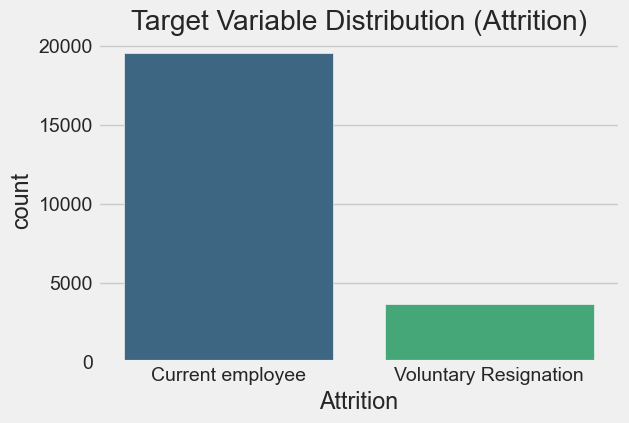

In [262]:
# Target Variable Analysis
plt.figure(figsize=(6, 4))
sns.countplot(x='Attrition', data=df_cleaned, palette='viridis')
plt.title('Target Variable Distribution (Attrition)')
plt.xticks(ticks=[0, 1], labels=['Current employee','Voluntary Resignation'])
plt.show()

###  Numerical Features Analysis

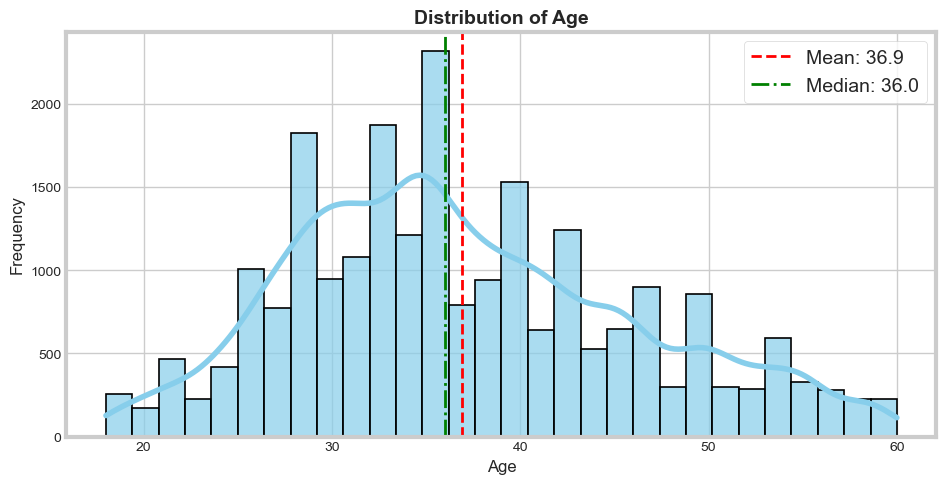

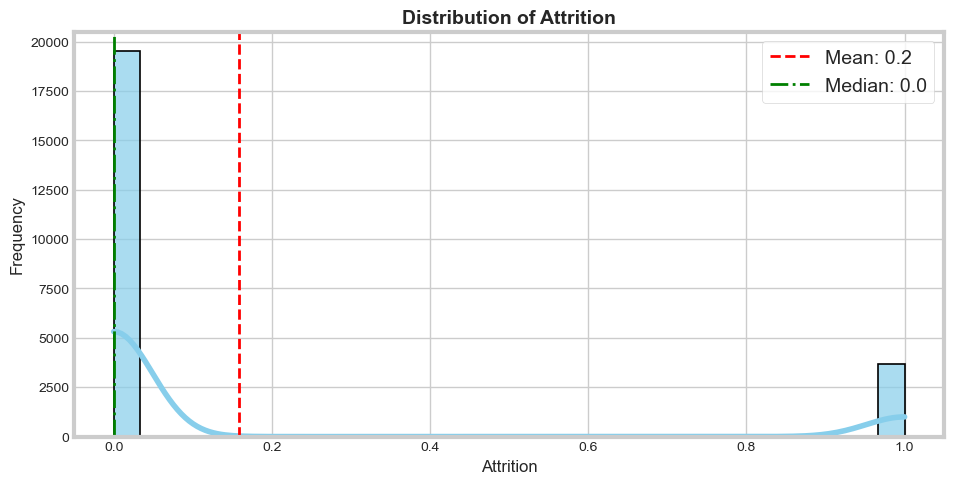

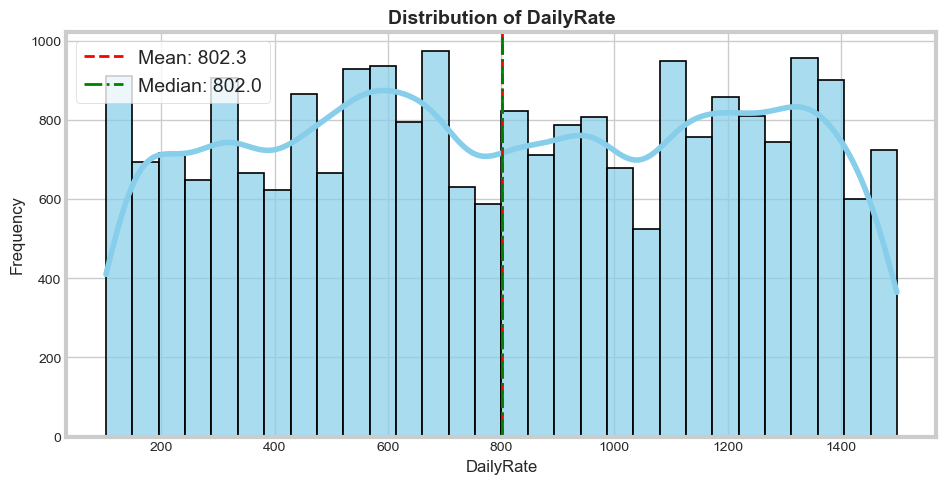

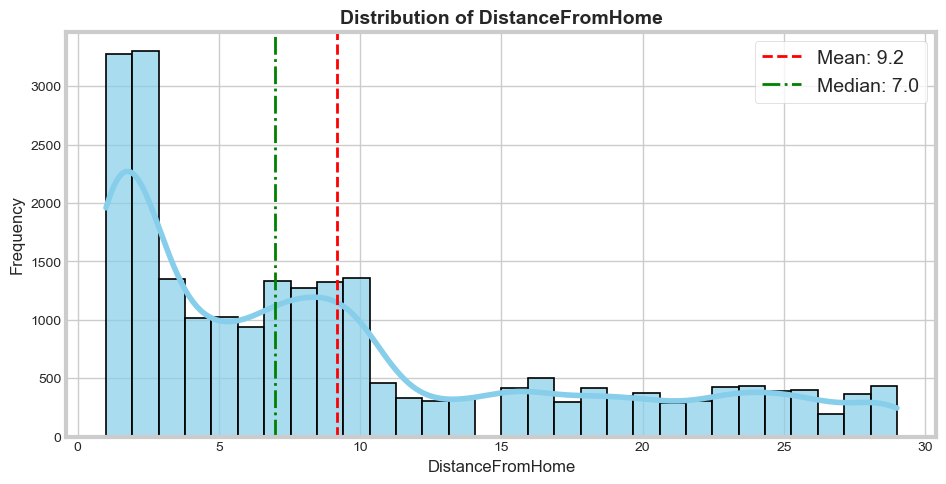

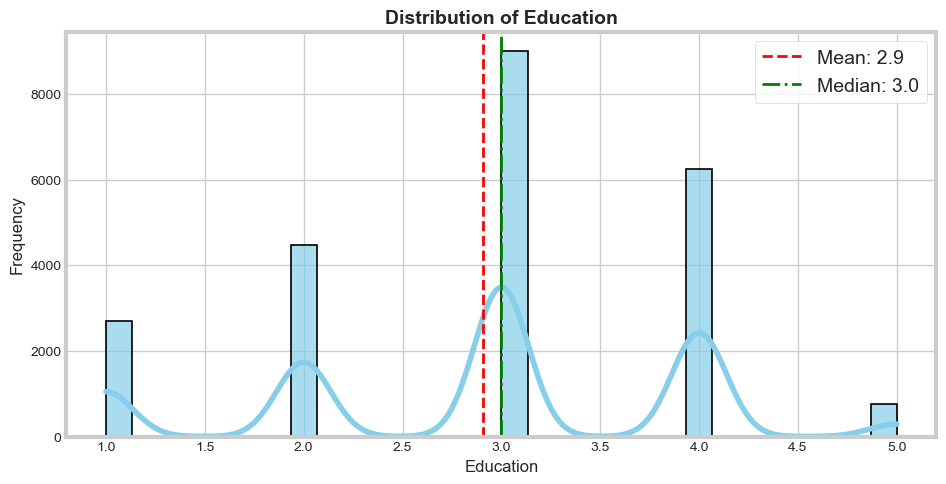

...

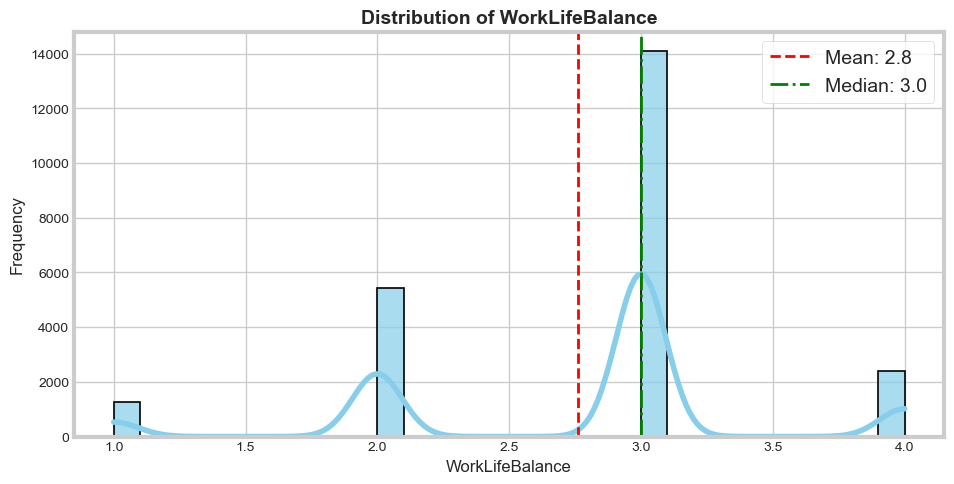

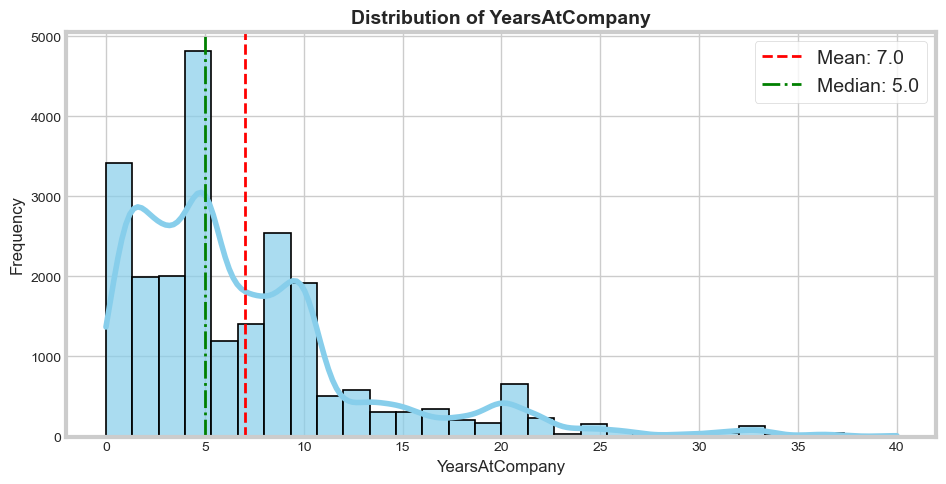

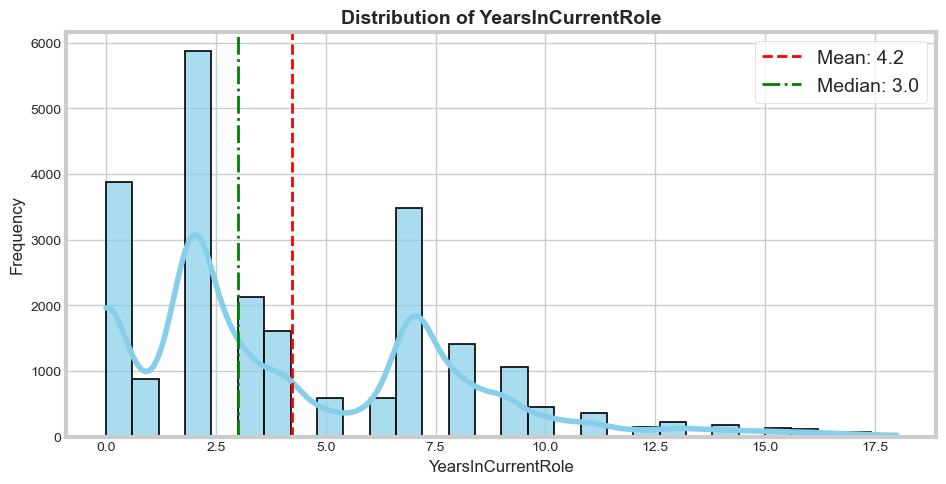

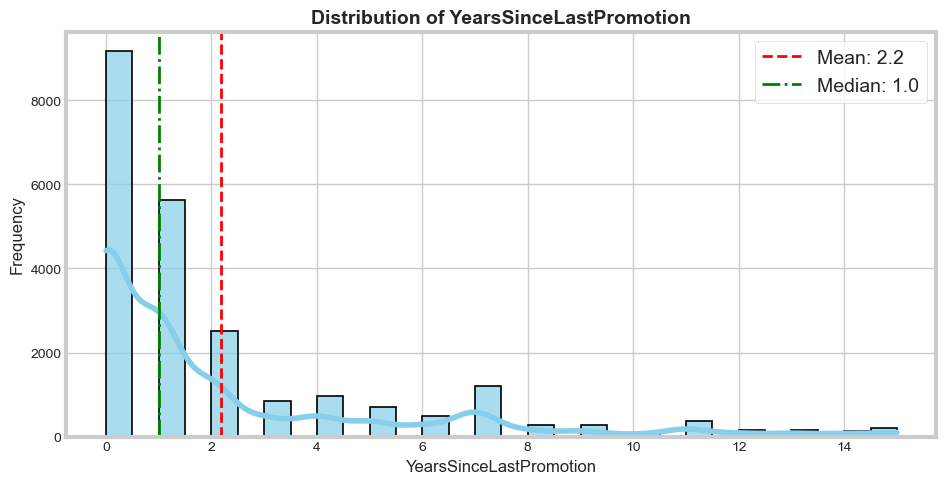

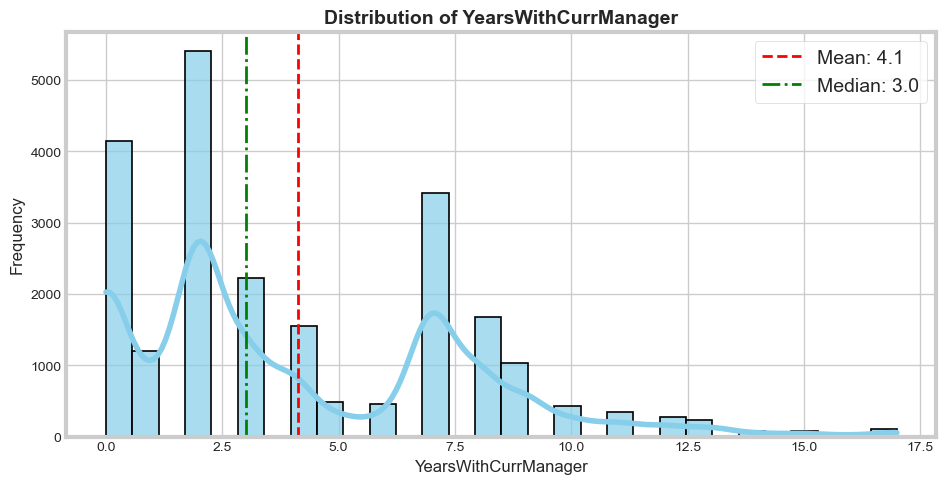

In [265]:
# Set plot style
sns.set_style("whitegrid")

# Univariate Analysis for Numerical Variables
for col in numerical_cols:
    plt.figure(figsize=(10, 5))
    sns.histplot(df_cleaned[col], bins=30, kde=True, color="skyblue", alpha=0.7, edgecolor="black", linewidth=1.2)
    
    # Add mean and median lines
    mean_val = df_cleaned[col].mean()
    median_val = df_cleaned[col].median()
    plt.axvline(mean_val, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_val:.1f}')
    plt.axvline(median_val, color='green', linestyle='-.', linewidth=2, label=f'Median: {median_val:.1f}')

    # Customize labels and title
    plt.title(f'Distribution of {col}', fontsize=14, fontweight='bold')
    plt.xlabel(col, fontsize=12)
    plt.ylabel("Frequency", fontsize=12)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    
    # Show legend
    plt.legend()
    
    # Display the plot
    plt.show()

### Categorical Features Analysis: 

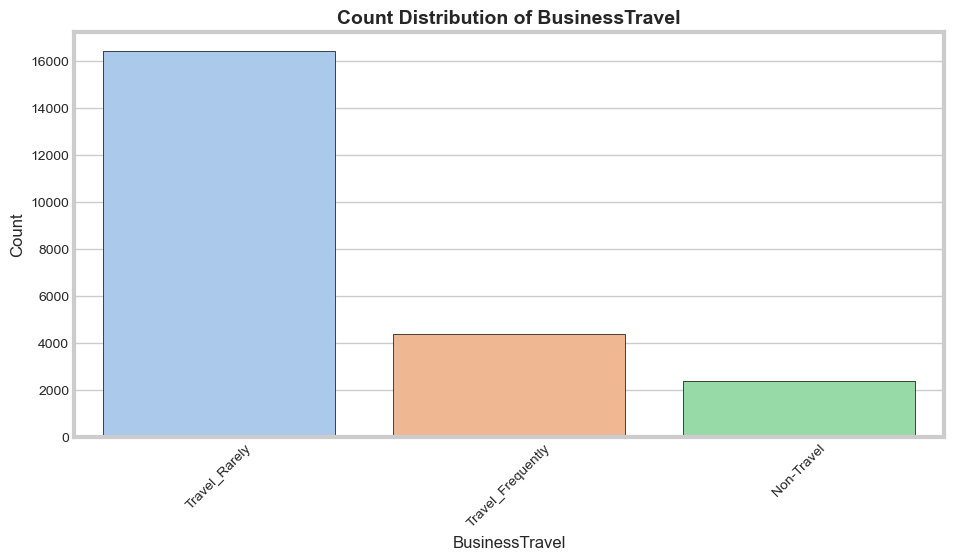

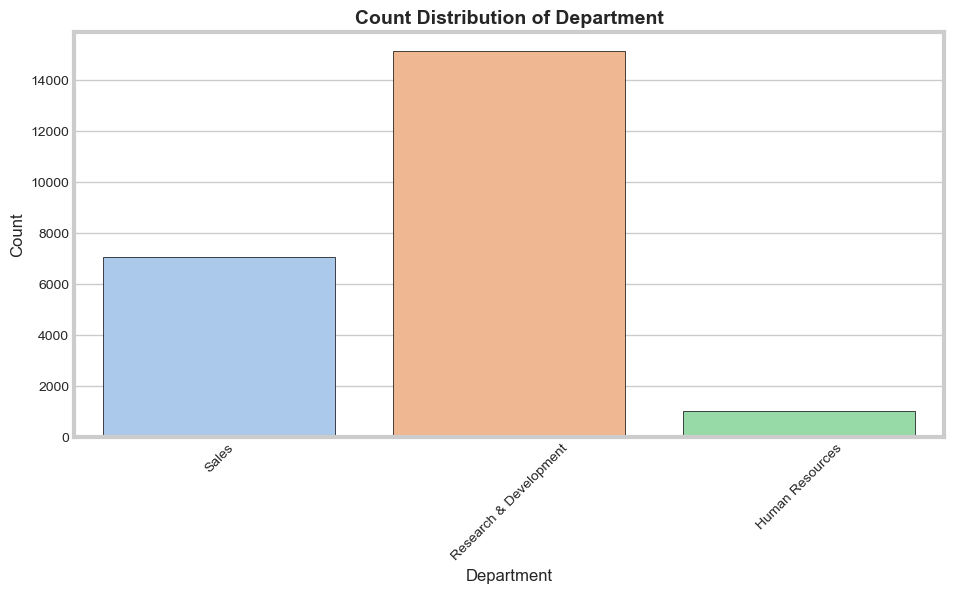

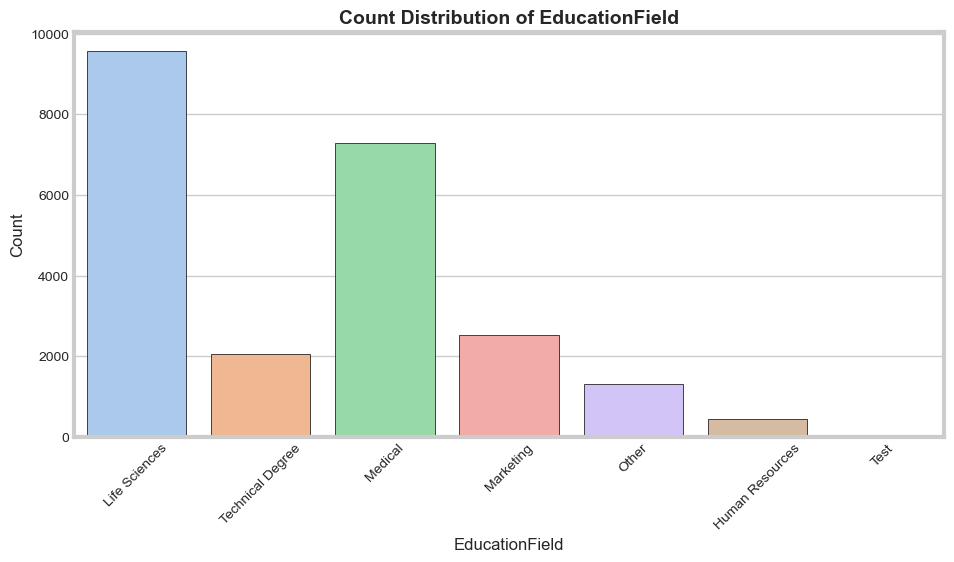

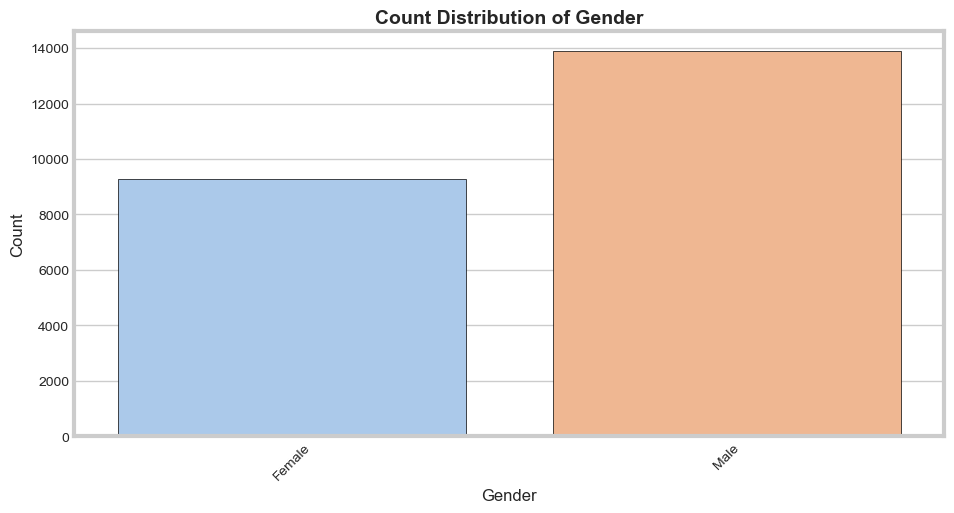

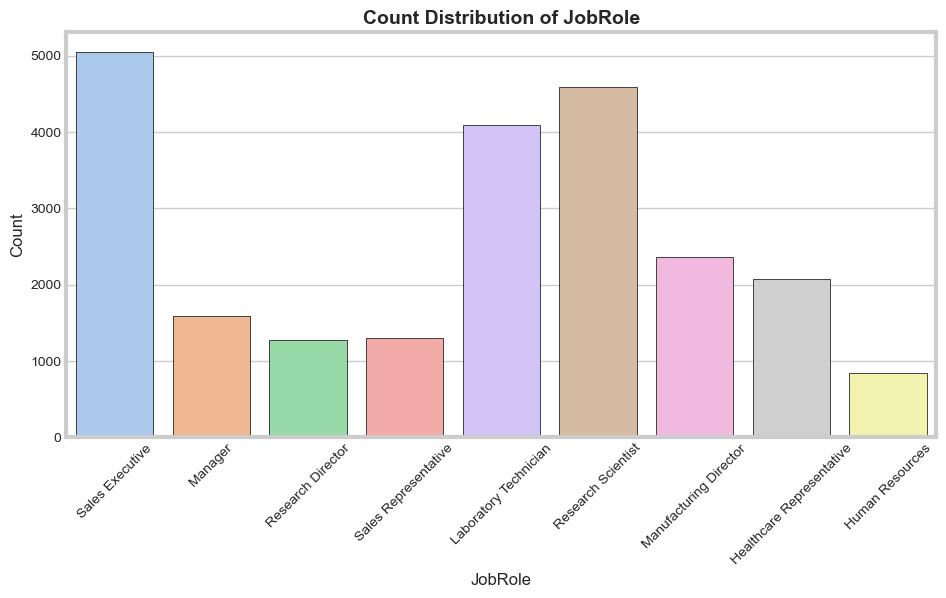

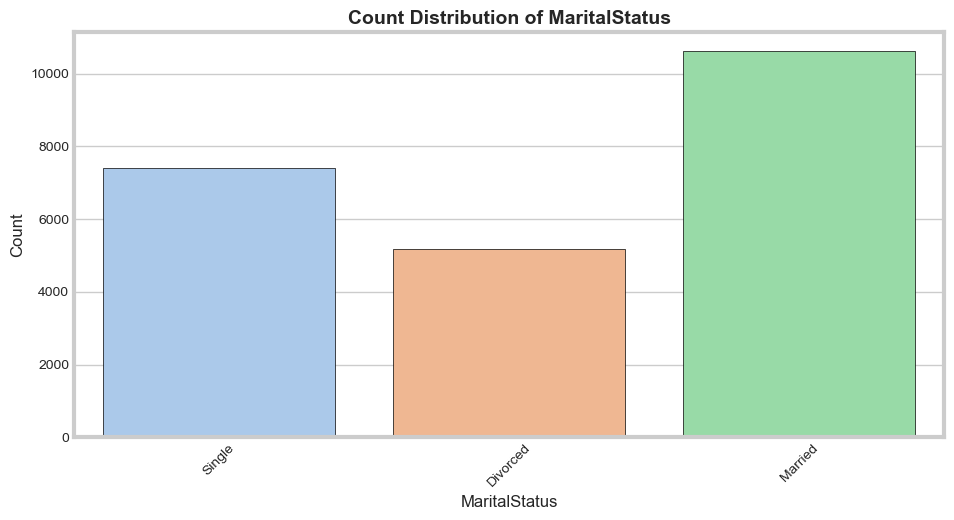

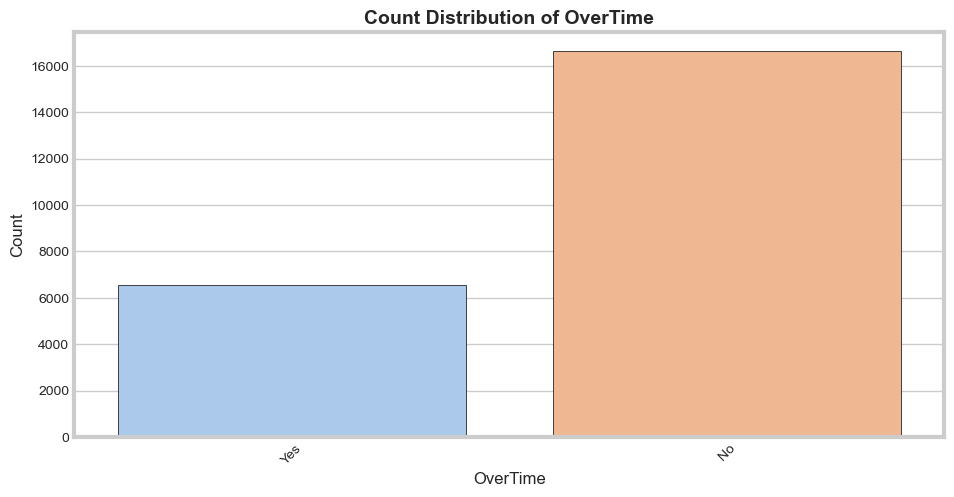

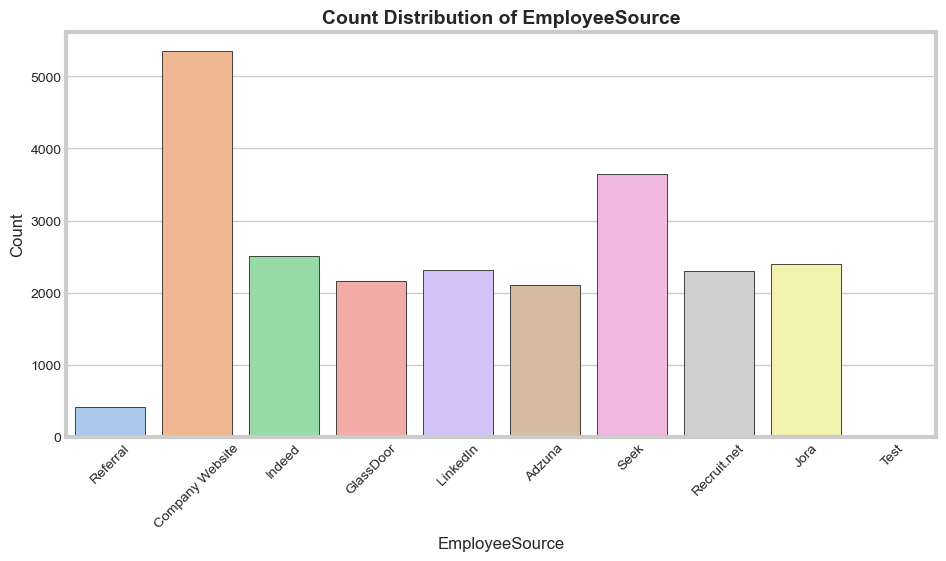

In [267]:
# Univariate Analysis for Categorical Variables
categorical_cols = df_cleaned.select_dtypes(include=['object']).columns

for col in categorical_cols:
    plt.figure(figsize=(10, 5))
    sns.countplot(data=df_cleaned, x=col, palette="pastel", edgecolor="black")
    
    # Customize labels and title
    plt.title(f'Count Distribution of {col}', fontsize=14, fontweight='bold')
    plt.xlabel(col, fontsize=12)
    plt.ylabel("Count", fontsize=12)
    plt.xticks(rotation=45, fontsize=10)
    plt.yticks(fontsize=10)
    
    # Display the plot
    plt.show()

## Bivariate analysis

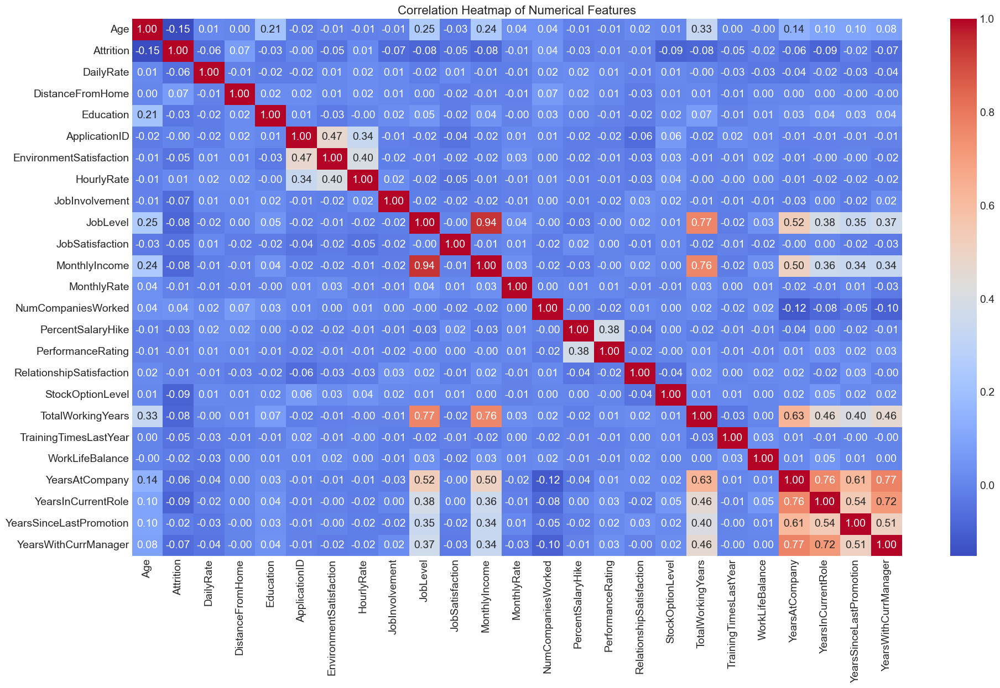

In [269]:
# Correlation Heatmap
plt.figure(figsize=(20, 12))
corr_matrix = df_cleaned[numerical_cols].corr()
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', cbar=True)
plt.title('Correlation Heatmap of Numerical Features', fontsize=16)
plt.show()

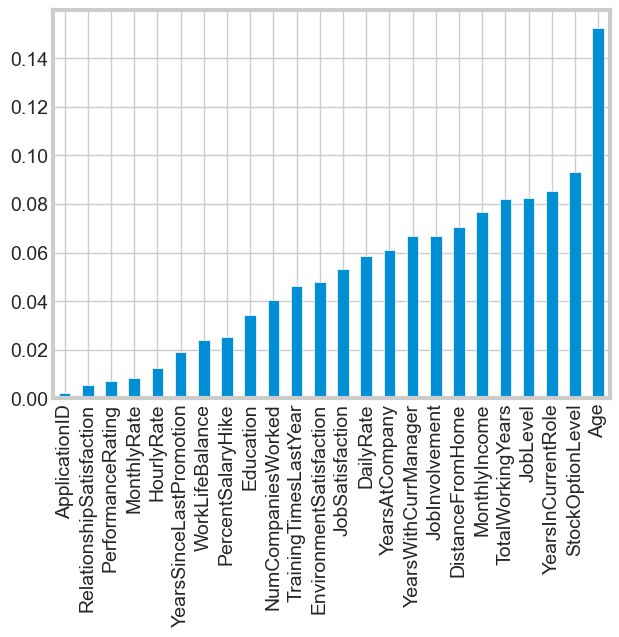

In [270]:
np.abs(corr_matrix["Attrition"]).sort_values()[:-1].plot(kind = "bar");

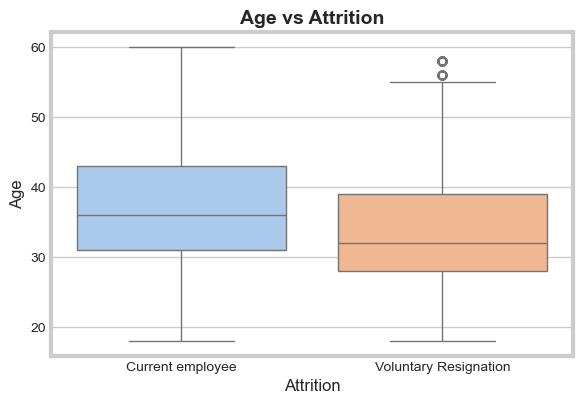

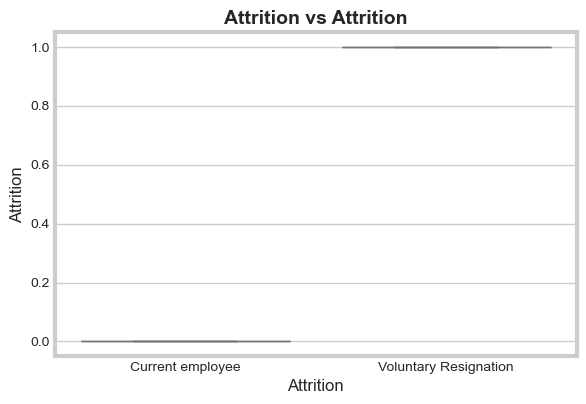

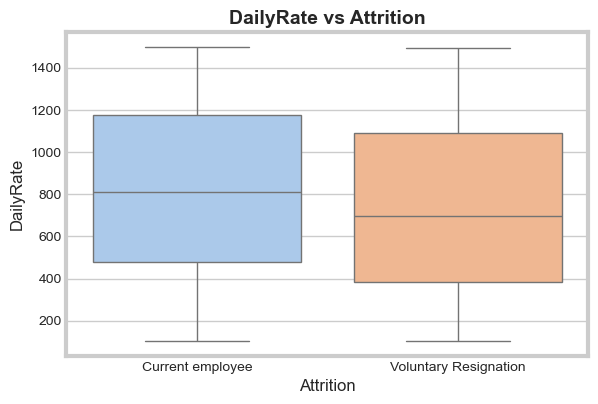

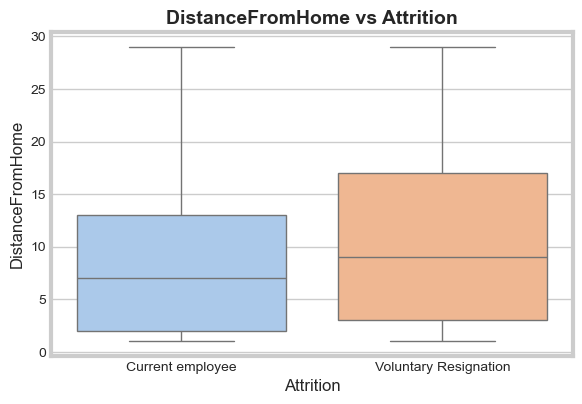

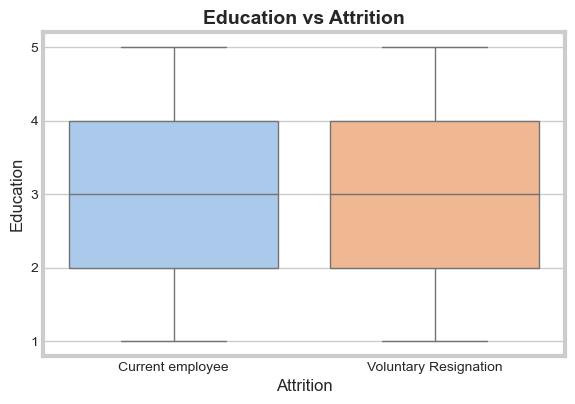

...

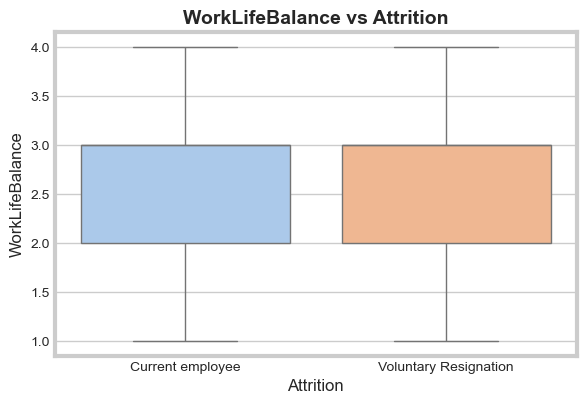

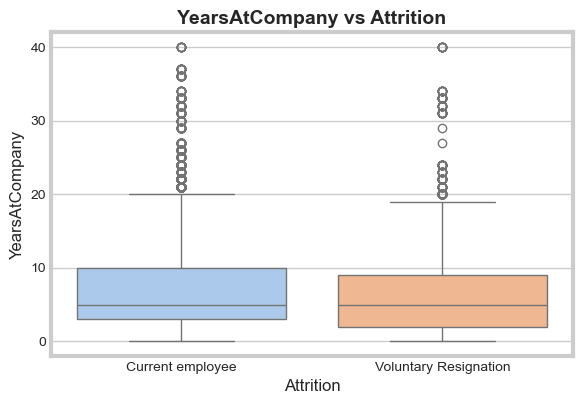

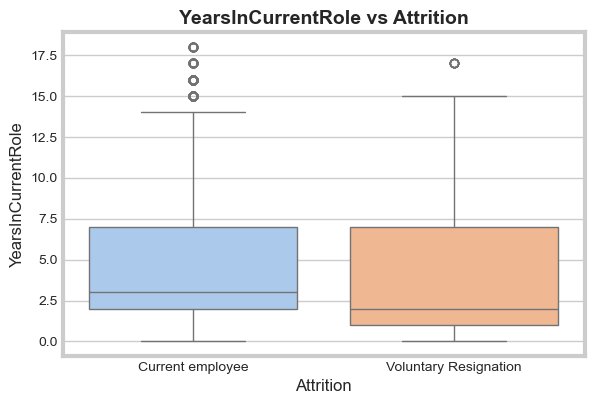

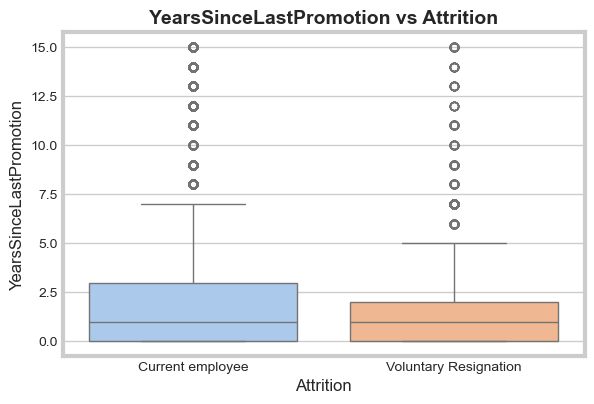

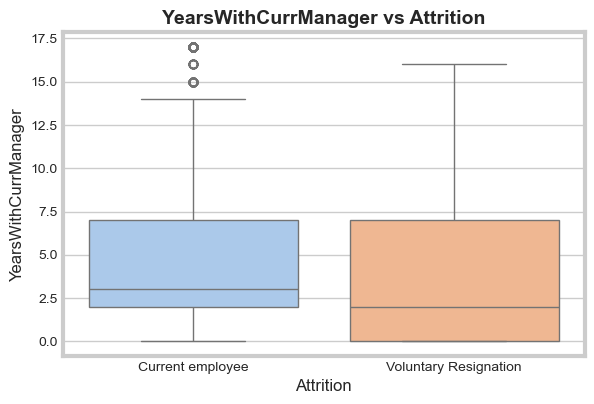

In [271]:
# Assume 'Attrition' is the target variable
target_col = "Attrition"

# Bivariate Analysis for Numerical vs Target (Attrition)
for col in numerical_cols:
    plt.figure(figsize=(6, 4))
    sns.boxplot(data=df_cleaned, x=target_col, y=col, palette="pastel")
    
    # Customize labels and title
    plt.title(f'{col} vs {target_col}', fontsize=14, fontweight='bold')
    plt.xlabel(target_col, fontsize=12)
    plt.ylabel(col, fontsize=12)
    plt.xticks(fontsize=10)
    plt.xticks(ticks=[0, 1], labels=['Current employee','Voluntary Resignation'])
    plt.yticks(fontsize=10)
    
    # Display the plot
    plt.show()

In [272]:
categorical_cols

Index(['BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole',
       'MaritalStatus', 'OverTime', 'EmployeeSource'],
      dtype='object')

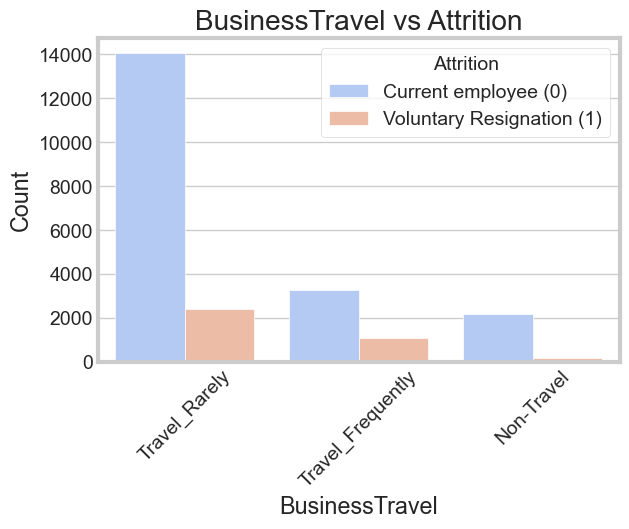

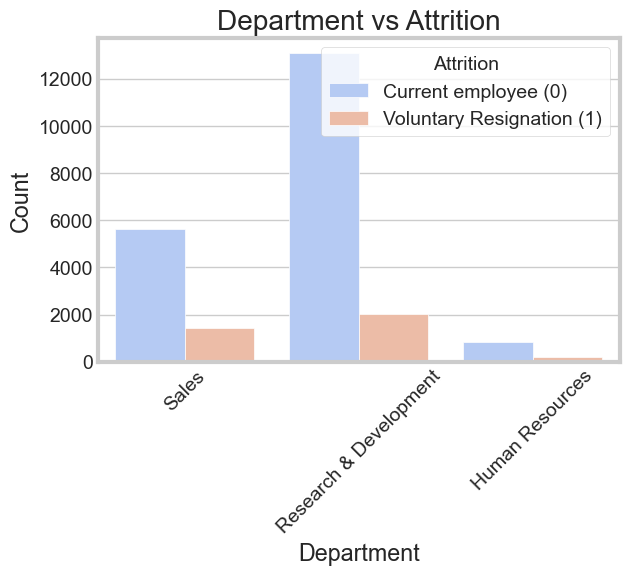

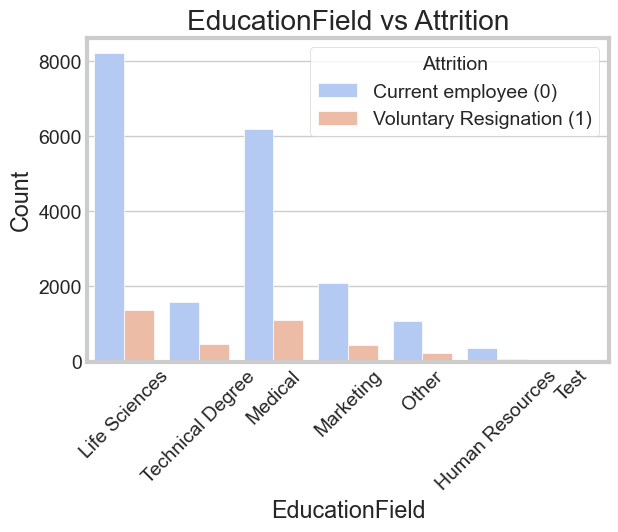

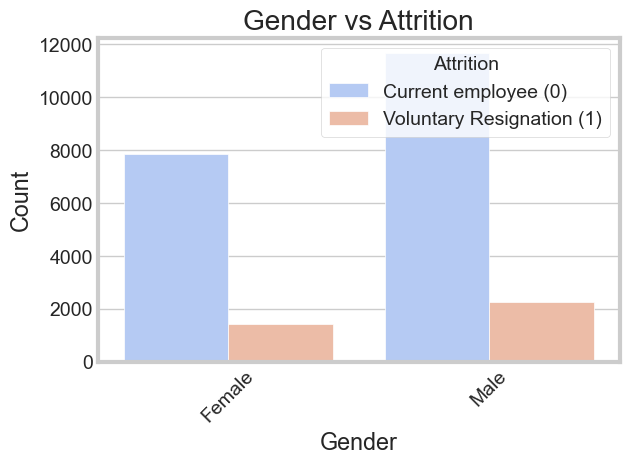

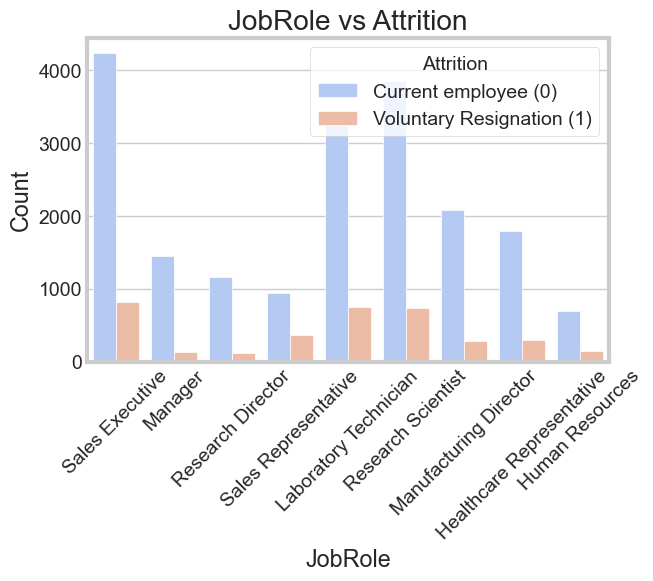

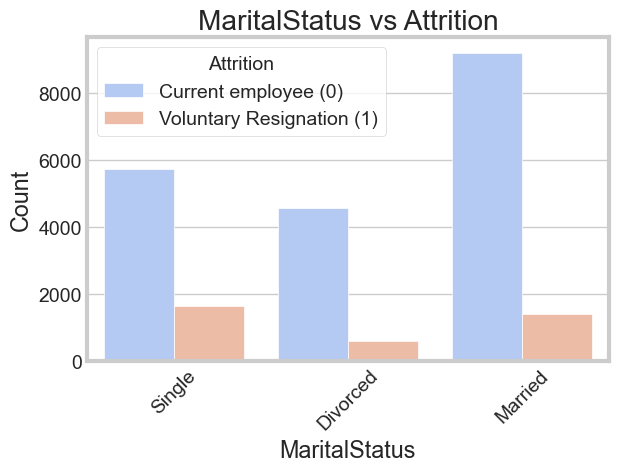

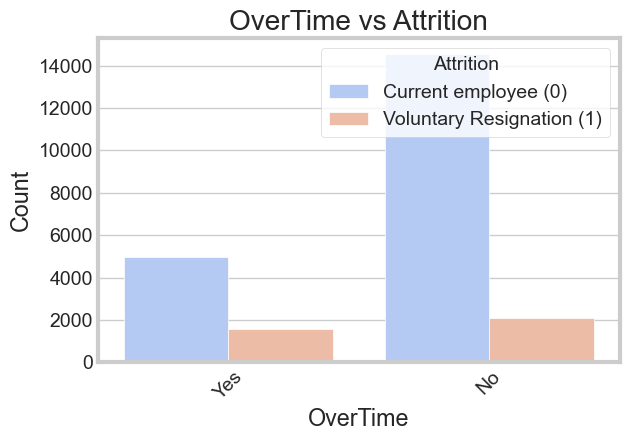

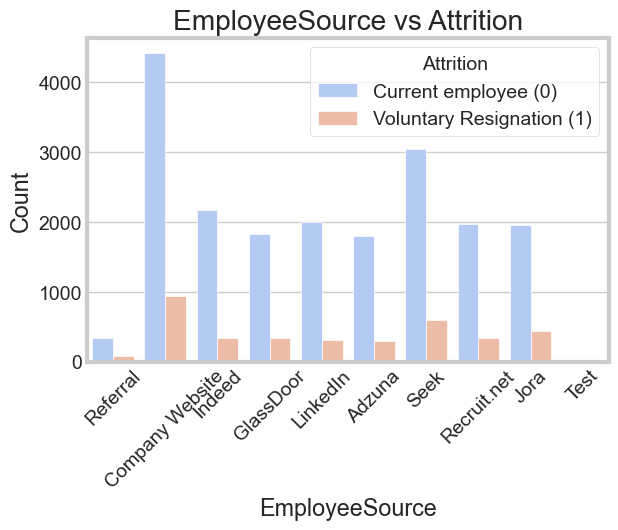

In [273]:
# Create bar plots showing the distribution of categorical features split by Attrition
for col in categorical_cols:
    plt.figure(figsize=(6, 4))
    sns.countplot(x=col, hue="Attrition", data=df_cleaned, palette="coolwarm")
    plt.title(f"{col} vs Attrition")
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.xticks(rotation=45)
    plt.legend(title="Attrition", labels=["Current employee (0)", "Voluntary Resignation (1)"])
    plt.show()

In [274]:
# Cross-tabulation for selected categorical variables
cross_tab_results = {}
selected_categorical = ['BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole',
       'MaritalStatus', 'OverTime', 'EmployeeSource']

for col in selected_categorical:
    cross_tab_results[col] = pd.crosstab(
        df_cleaned[col], df_cleaned['Attrition'], normalize='index') * 100

# Display cross-tabulations
for col, result in cross_tab_results.items():
    print(f"\nCross-tabulation of {col} vs Target:\n")
    print(result)
    print("-" * 50)



Cross-tabulation of BusinessTravel vs Target:

Attrition                  0          1
BusinessTravel                         
Non-Travel         92.109705   7.890295
Travel_Frequently  75.297075  24.702925
Travel_Rarely      85.439728  14.560272
--------------------------------------------------

Cross-tabulation of Department vs Target:

Attrition                       0          1
Department                                  
Human Resources         81.367691  18.632309
Research & Development  86.510613  13.489387
Sales                   79.676871  20.323129
--------------------------------------------------

Cross-tabulation of EducationField vs Target:

Attrition                  0          1
EducationField                         
Human Resources    82.993197  17.006803
Life Sciences      85.778474  14.221526
Marketing          82.765452  17.234548
Medical            84.880055  15.119945
Other              82.668712  17.331288
Technical Degree   77.496347  22.503653
Test         

## Multivariate Analysis

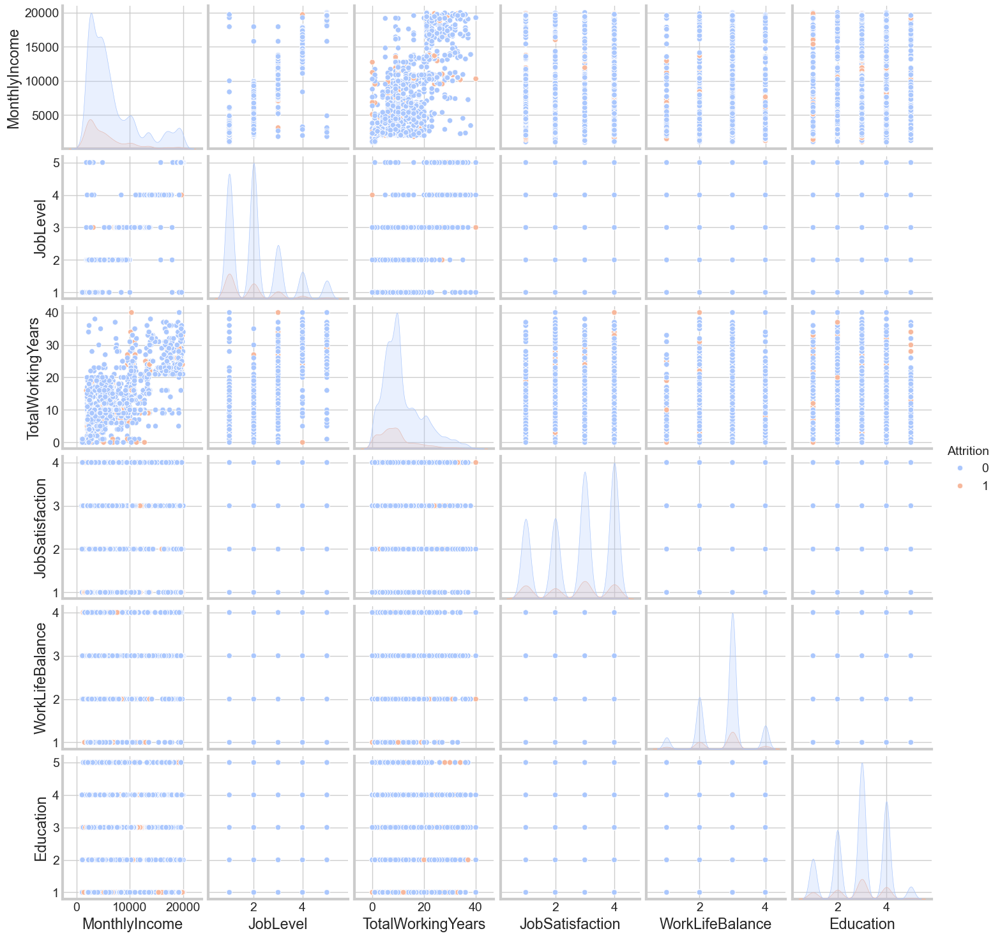

In [276]:
# Pairplot for selected features influencing attrition
selected_features = [
    "MonthlyIncome", "JobLevel", "TotalWorkingYears", "JobSatisfaction", 
    "WorkLifeBalance", "Education", "Attrition"
]
sns.pairplot(df_cleaned[selected_features], hue="Attrition", palette="coolwarm")
plt.show()

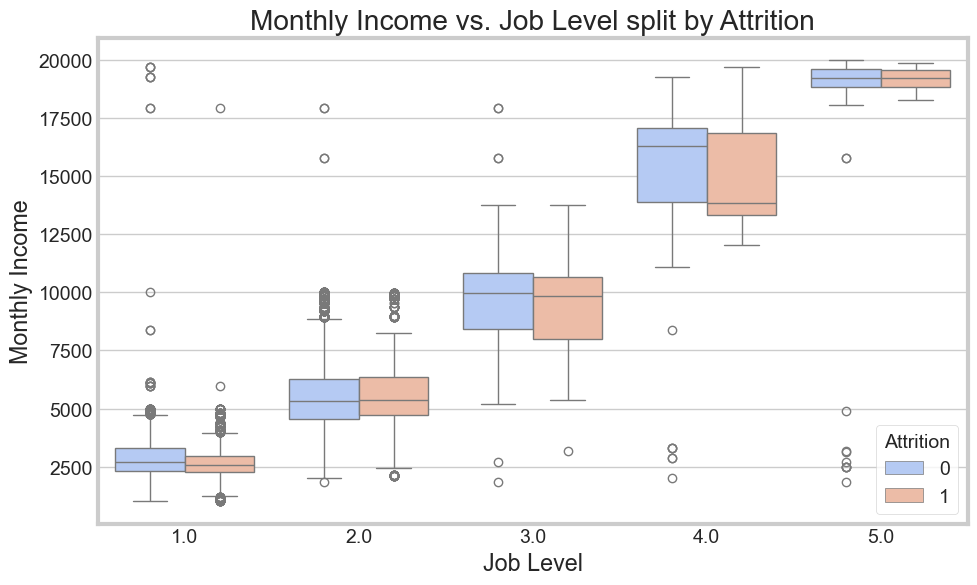

In [277]:
# Boxplot: Monthly Income vs. Job Level split by Attrition
plt.figure(figsize=(10, 6))
sns.boxplot(x="JobLevel", y="MonthlyIncome", hue="Attrition", data=df_cleaned, palette="coolwarm")
plt.title("Monthly Income vs. Job Level split by Attrition")
plt.xlabel("Job Level")
plt.ylabel("Monthly Income")
plt.show()

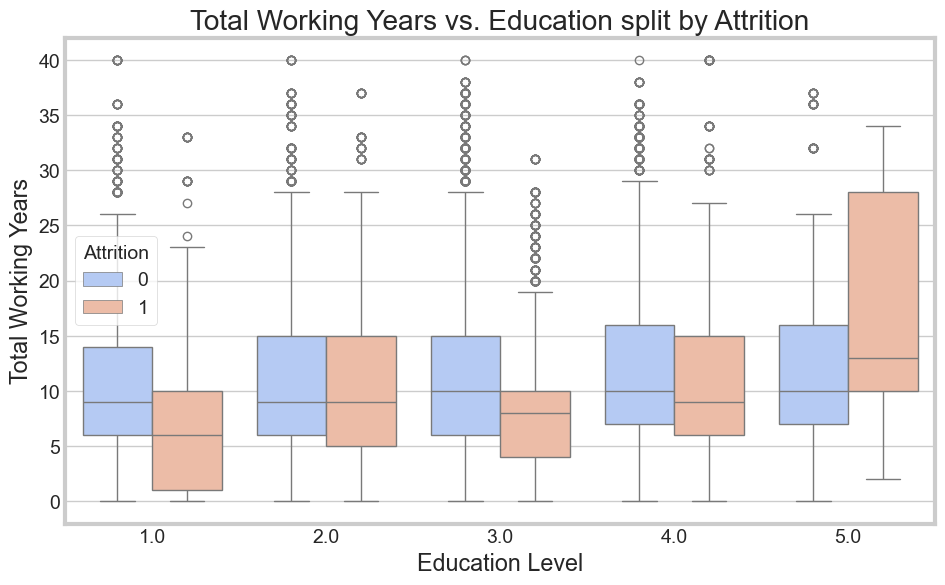

In [278]:
# Boxplot: Total Working Years vs. Education split by Attrition
plt.figure(figsize=(10, 6))
sns.boxplot(x="Education", y="TotalWorkingYears", hue="Attrition", data=df_cleaned, palette="coolwarm")
plt.title("Total Working Years vs. Education split by Attrition")
plt.xlabel("Education Level")
plt.ylabel("Total Working Years")
plt.show()

## Train/Test Split

With your data prepared, split it into a train and test set.

In [280]:
# Splitting the data
X = df_cleaned.drop(columns=['Attrition'])
y = df_cleaned['Attrition']

# Doing train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

print("X_train: ", X_train.shape)
print("y_train: ", y_train.shape)

print("\n")

print("X_test: ", X_test.shape)
print("y_test: ", y_test.shape)

display(X_train.head())
display(y_train.head())

# Identify numerical and categorical columns dynamically
numerical_cols = X_train.select_dtypes(include=["int64", "float64"]).columns.tolist()
categorical_cols = X_train.select_dtypes(include=["object"]).columns.tolist()

# Define transformers for preprocessing using StandardScaler (no imputation)
numerical_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())  # Removed imputer
])

categorical_transformer = Pipeline(steps=[
    ('encoder', OneHotEncoder(handle_unknown="ignore"))  # Removed imputer
])

# Combine transformations
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ]
)

X_train:  (16231, 32)
y_train:  (16231,)


X_test:  (6957, 32)
y_test:  (6957,)


,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,ApplicationID,EnvironmentSatisfaction,Gender,...,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,EmployeeSource
21274,42.0,Travel_Rarely,647.0,Sales,4,4.0,Life Sciences,136917,2.0,Male,...,4.0,0.0,9.0,3.0,4.0,6.0,4.0,1.0,5.0,Seek
9592,29.0,Travel_Rarely,726.0,Research & Development,29,1.0,Technical Degree,132698,3.0,Female,...,2.0,2.0,9.0,4.0,3.0,5.0,3.0,1.0,4.0,Company Website
14796,35.0,Travel_Rarely,1219.0,Sales,18,3.0,Medical,134667,3.0,Female,...,2.0,0.0,5.0,3.0,3.0,5.0,2.0,1.0,0.0,Jora
22448,43.0,Travel_Frequently,775.0,Sales,15,3.0,Medical,127519,1.0,Female,...,1.0,1.0,17.0,2.0,2.0,3.0,1.0,0.0,2.0,Jora
180,41.0,Travel_Rarely,802.0,Sales,9,1.0,Medical,125684,3.0,Male,...,3.0,1.0,12.0,2.0,3.0,9.0,7.0,0.0,7.0,Seek


21274    0
9592     0
14796    0
22448    0
180      0
Name: Attrition, dtype: int64

## A Baseline Model

Before we build our first model, we want to establish a baseline.  What is the baseline performance that our classifier should aim to beat?

In [282]:
baseline = df_cleaned['Attrition'].value_counts(normalize = True)[0]
print(baseline)

0.84207348628601


Baseline Model Accuracy: 0.8422
Baseline Model Precision: 0.0000
Baseline Model Recall: 0.0000
Baseline Model F1 Score: 0.0000
ROC-AUC Score: 0.5000


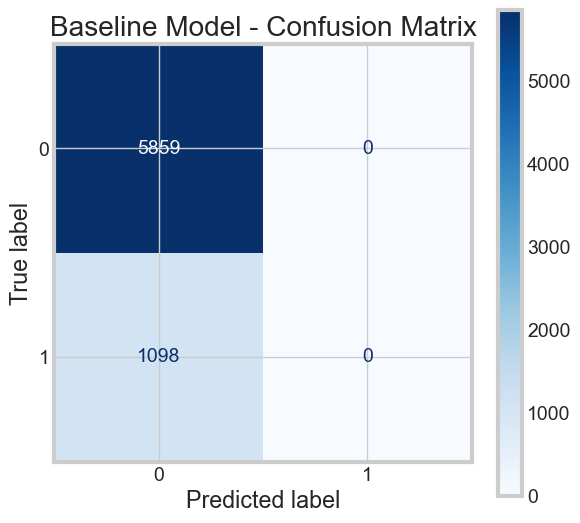


Baseline Model - Classification Report:

              precision    recall  f1-score   support

           0       0.84      1.00      0.91      5859
           1       0.00      0.00      0.00      1098

    accuracy                           0.84      6957
   macro avg       0.42      0.50      0.46      6957
weighted avg       0.71      0.84      0.77      6957



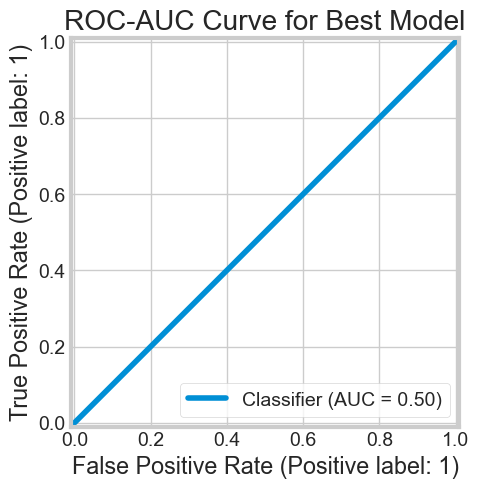

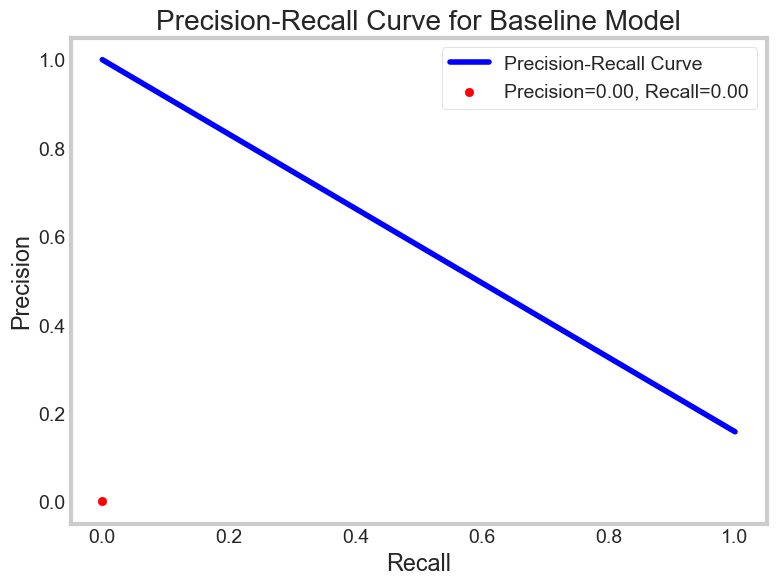


Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,Baseline model,0.842031,0.842173,0.0,0.0,0.0,0.003482,0.5,-


In [283]:
# Create a baseline model using DummyClassifier
baseline_model = DummyClassifier(strategy="most_frequent")  # Always predicts the most common class

# Measure training time
start_time = time.time()
baseline_model.fit(X_train, y_train)
train_time = time.time() - start_time

# Make predictions
y_baseline_pred = baseline_model.predict(X_test)
y_pred_proba = baseline_model.predict_proba(X_test)[:, 1]  # Probability estimates for ROC-AUC

# Evaluate baseline performance
baseline_accuracy = accuracy_score(y_test, y_baseline_pred)
baseline_precision = precision_score(y_test, y_baseline_pred, zero_division=0)
baseline_recall = recall_score(y_test, y_baseline_pred, zero_division=0)
baseline_f1 = f1_score(y_test, y_baseline_pred, zero_division=0)
roc_auc = roc_auc_score(y_test, y_pred_proba)

# Print all evaluation metrics
print(f"Baseline Model Accuracy: {baseline_accuracy:.4f}")
print(f"Baseline Model Precision: {baseline_precision:.4f}")
print(f"Baseline Model Recall: {baseline_recall:.4f}")
print(f"Baseline Model F1 Score: {baseline_f1:.4f}")
print(f"ROC-AUC Score: {roc_auc:.4f}")

# Generate and display confusion matrix for baseline model
cm_baseline = confusion_matrix(y_test, y_baseline_pred)
disp_baseline = ConfusionMatrixDisplay(confusion_matrix=cm_baseline, display_labels=[0, 1])

fig, ax = plt.subplots(figsize=(6, 6))
disp_baseline.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("Baseline Model - Confusion Matrix")
plt.show()

# Print classification report for baseline model
print("\nBaseline Model - Classification Report:\n")
print(classification_report(y_test, y_baseline_pred))

# Plot ROC-AUC Curve
RocCurveDisplay.from_predictions(y_test, y_pred_proba)
plt.title("ROC-AUC Curve for Best Model")
plt.show()

# Plot Precision-Recall Curve with annotations
precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_pred_proba)
plt.figure(figsize=(8, 6))
plt.plot(recall_vals, precision_vals, label="Precision-Recall Curve", color="blue")
plt.scatter(baseline_recall, baseline_precision, color="red",
            label=f'Precision={baseline_precision:.2f}, Recall={baseline_recall:.2f}')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve for Baseline Model")
plt.legend()
plt.grid()
plt.show()

# Create a new DataFrame with specified columns including precision, recall, and F1
results_df = pd.DataFrame(columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

# Append baseline model results
current_results = pd.DataFrame([[
    'Baseline model',
    baseline_model.score(X_train, y_train),
    baseline_model.score(X_test, y_test),
    baseline_precision,
    baseline_recall,
    baseline_f1,
    train_time,
    roc_auc,
    '-'
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

## A Simple Model


🔹 Training KNN...


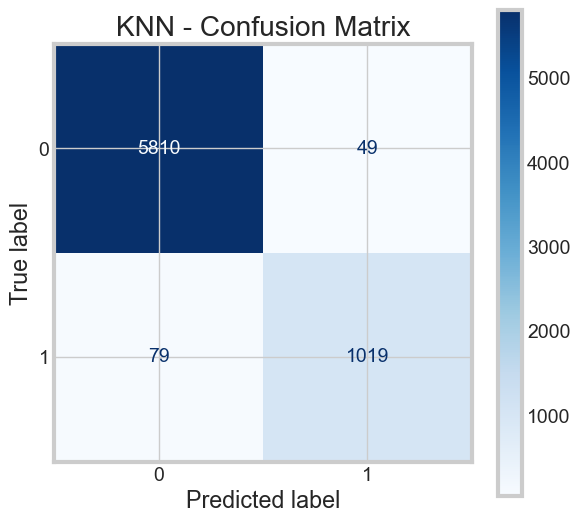


📊 Classification Report for KNN
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      5859
           1       0.95      0.93      0.94      1098

    accuracy                           0.98      6957
   macro avg       0.97      0.96      0.97      6957
weighted avg       0.98      0.98      0.98      6957

✅ Accuracy: 0.9816
✅ Precision: 0.9541
✅ Recall: 0.9281
✅ F1 Score: 0.9409
✅ ROC-AUC Score: 0.9941


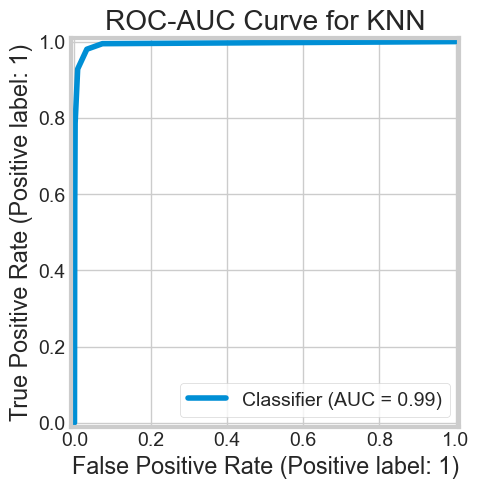

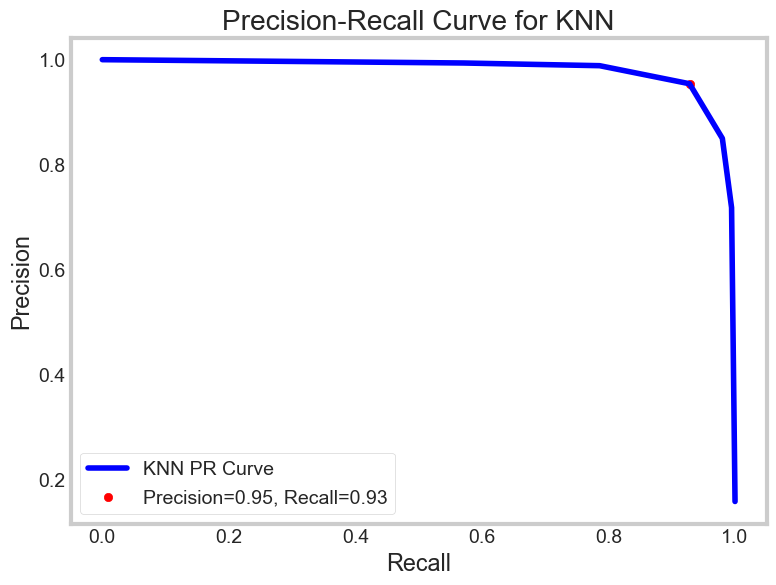


🔹 Training Logistic Regression...


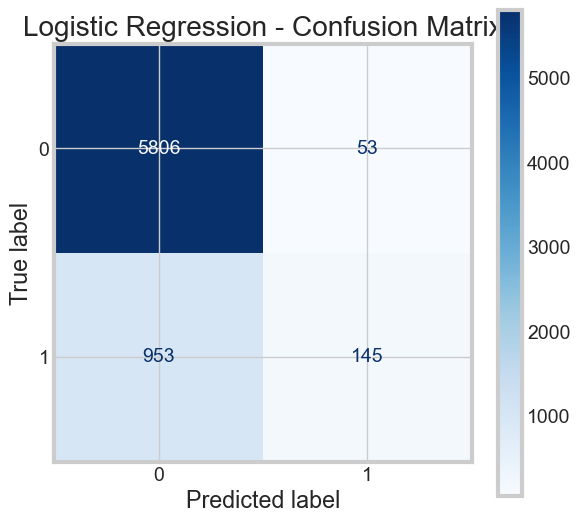


📊 Classification Report for Logistic Regression
              precision    recall  f1-score   support

           0       0.86      0.99      0.92      5859
           1       0.73      0.13      0.22      1098

    accuracy                           0.86      6957
   macro avg       0.80      0.56      0.57      6957
weighted avg       0.84      0.86      0.81      6957

✅ Accuracy: 0.8554
✅ Precision: 0.7323
✅ Recall: 0.1321
✅ F1 Score: 0.2238
✅ ROC-AUC Score: 0.7422


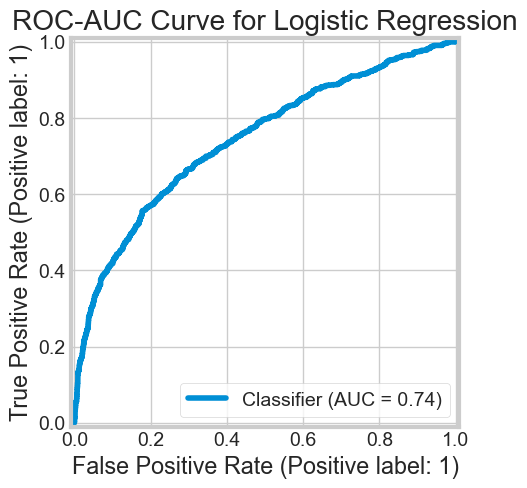

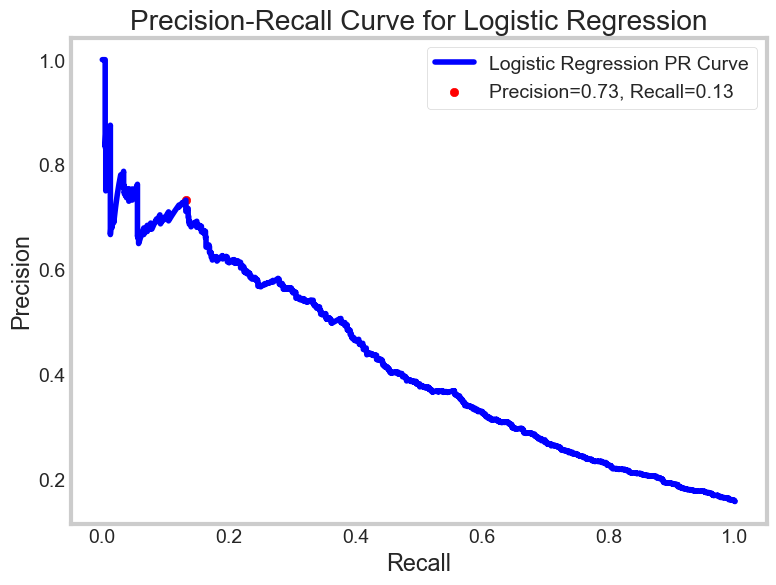


🔹 Training Decision Tree...


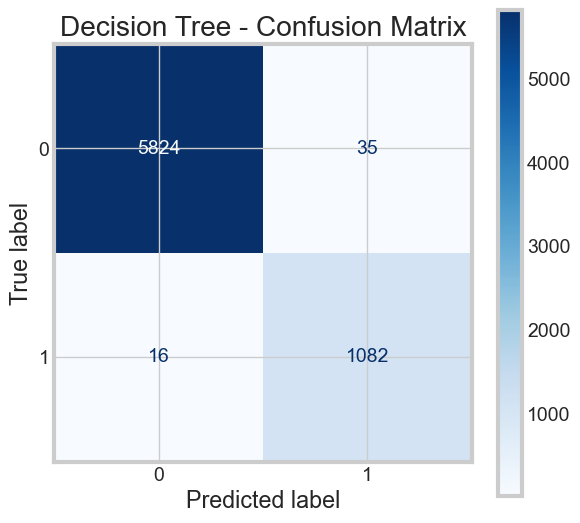


📊 Classification Report for Decision Tree
              precision    recall  f1-score   support

           0       1.00      0.99      1.00      5859
           1       0.97      0.99      0.98      1098

    accuracy                           0.99      6957
   macro avg       0.98      0.99      0.99      6957
weighted avg       0.99      0.99      0.99      6957

✅ Accuracy: 0.9927
✅ Precision: 0.9687
✅ Recall: 0.9854
✅ F1 Score: 0.9770
✅ ROC-AUC Score: 0.9897


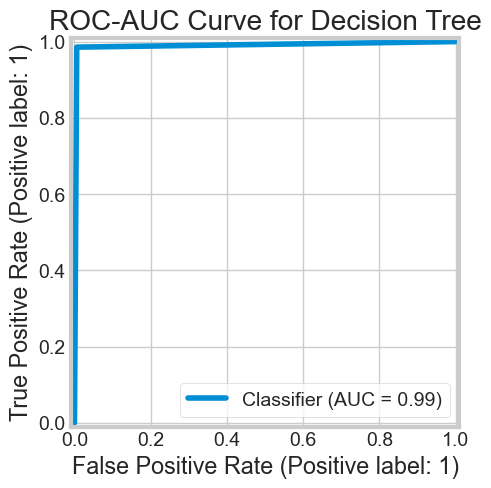

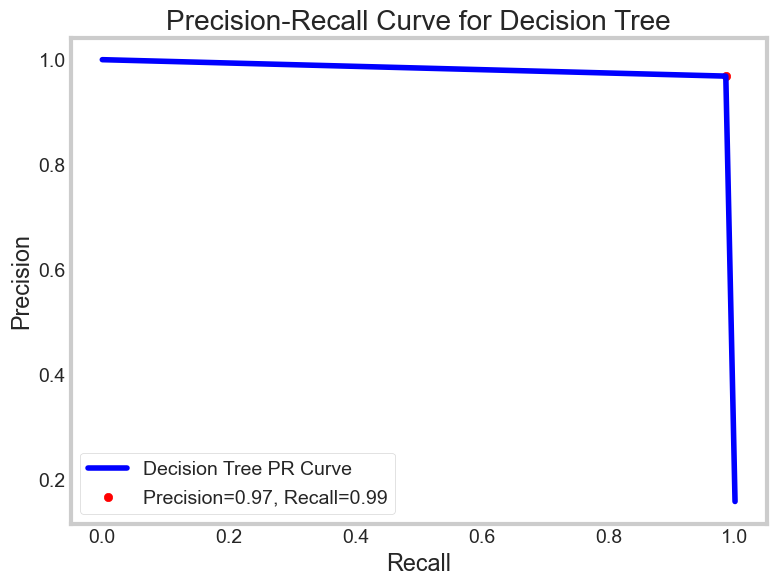


🔹 Training SVM...


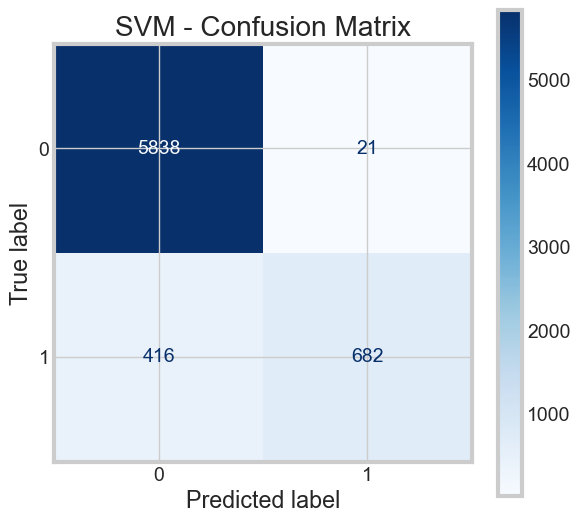


📊 Classification Report for SVM
              precision    recall  f1-score   support

           0       0.93      1.00      0.96      5859
           1       0.97      0.62      0.76      1098

    accuracy                           0.94      6957
   macro avg       0.95      0.81      0.86      6957
weighted avg       0.94      0.94      0.93      6957

✅ Accuracy: 0.9372
✅ Precision: 0.9701
✅ Recall: 0.6211
✅ F1 Score: 0.7574
✅ ROC-AUC Score: 0.9737


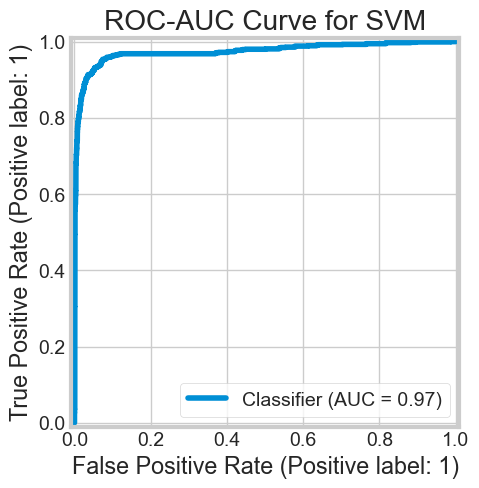

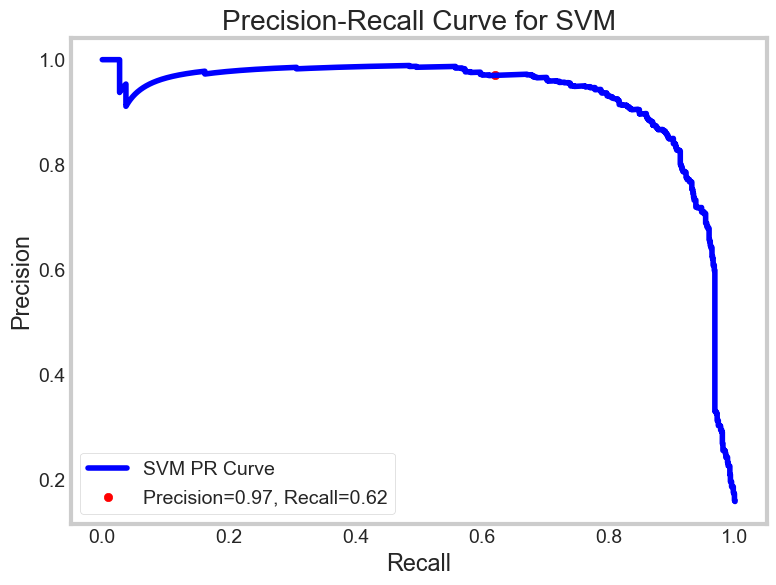


🔹 Training Random Forest...


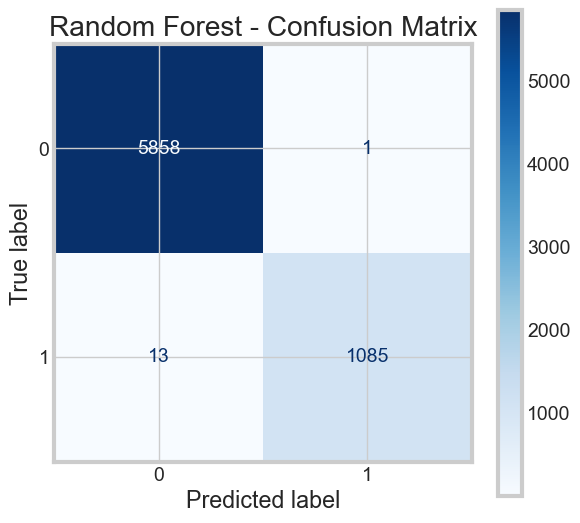


📊 Classification Report for Random Forest
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5859
           1       1.00      0.99      0.99      1098

    accuracy                           1.00      6957
   macro avg       1.00      0.99      1.00      6957
weighted avg       1.00      1.00      1.00      6957

✅ Accuracy: 0.9980
✅ Precision: 0.9991
✅ Recall: 0.9882
✅ F1 Score: 0.9936
✅ ROC-AUC Score: 0.9999


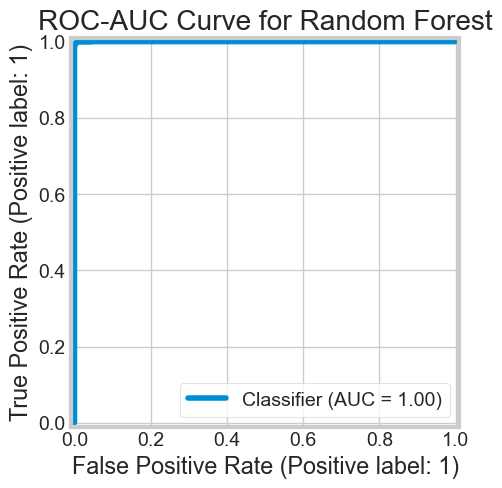

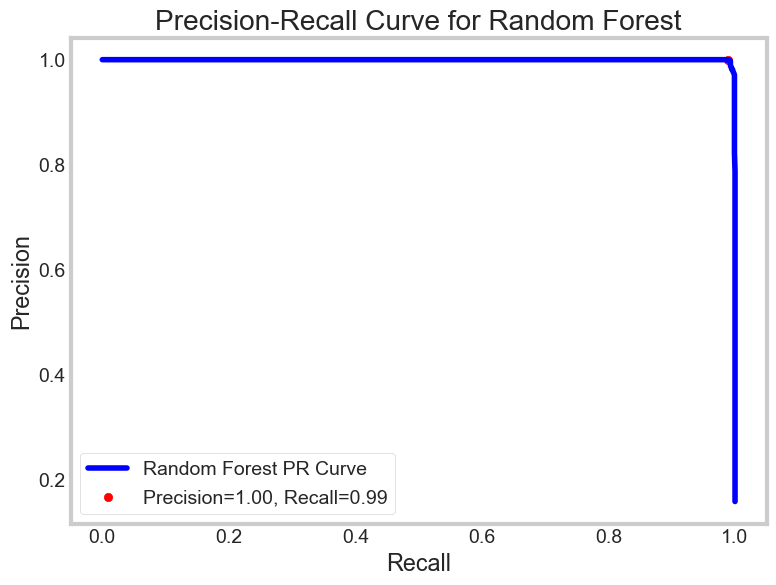


🔹 Training AdaBoost...


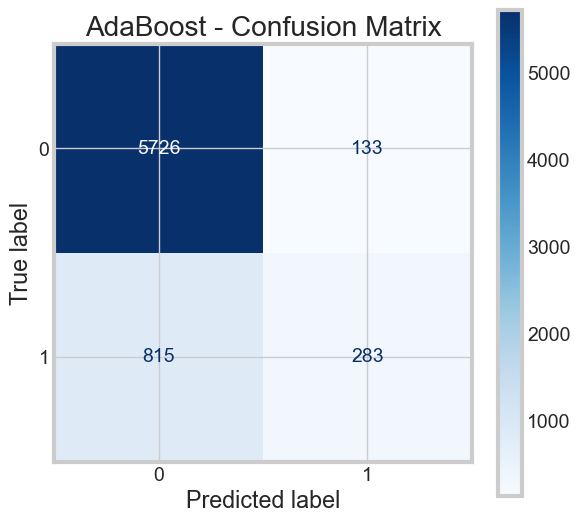


📊 Classification Report for AdaBoost
              precision    recall  f1-score   support

           0       0.88      0.98      0.92      5859
           1       0.68      0.26      0.37      1098

    accuracy                           0.86      6957
   macro avg       0.78      0.62      0.65      6957
weighted avg       0.84      0.86      0.84      6957

✅ Accuracy: 0.8637
✅ Precision: 0.6803
✅ Recall: 0.2577
✅ F1 Score: 0.3738
✅ ROC-AUC Score: 0.8308


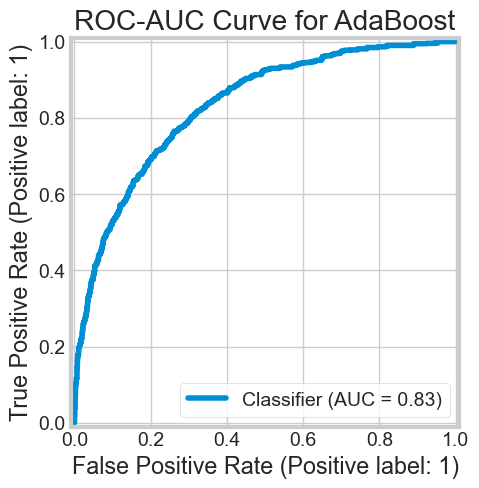

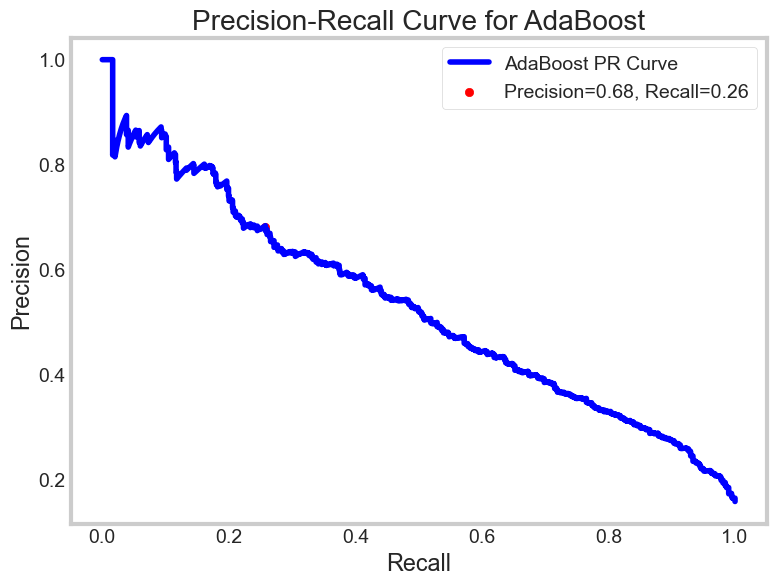


📊 Final Model Comparison:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,KNN,0.991991,0.981601,0.954120,0.928051,0.940905,0.081555,0.994072,-
1,Logistic Regression,0.851211,0.855397,0.732323,0.132058,0.223765,0.130121,0.742225,-
2,Decision Tree,1.000000,0.992669,0.968666,0.985428,0.976975,0.237636,0.989727,-
3,SVM,0.953977,0.937186,0.970128,0.621129,0.757357,67.384571,0.973716,-
4,Random Forest,1.000000,0.997988,0.999079,0.988160,0.993590,2.259161,0.999933,-
5,AdaBoost,0.863163,0.863734,0.680288,0.257741,0.373844,2.844512,0.830764,-


In [285]:
# Define Models with AdaBoost
models = {
    "KNN": KNeighborsClassifier(n_neighbors=5),
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Decision Tree": DecisionTreeClassifier(),
    "SVM": SVC(probability=True),  # Enable probability for ROC-AUC
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "AdaBoost": AdaBoostClassifier(n_estimators=100, random_state=42)
}

# Initialize results DataFrame
results_df = pd.DataFrame(columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

# Loop through each model
for model_name, model in models.items():
    print(f"\n🔹 Training {model_name}...")

    # Define pipeline
    pipe = Pipeline(steps=[
        ("preprocessor", preprocessor),
        ("classifier", model)
    ])

    # Train model
    start_train_time = time.time()
    pipe.fit(X_train, y_train)
    train_time = time.time() - start_train_time

    # Make predictions
    y_pred = pipe.predict(X_test)
    y_pred_proba = pipe.predict_proba(X_test)[:, 1] if hasattr(pipe, "predict_proba") else y_pred

    # Compute metrics
    train_accuracy = pipe.score(X_train, y_train)
    test_accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, zero_division=0)
    recall = recall_score(y_test, y_pred, zero_division=0)
    f1 = f1_score(y_test, y_pred, zero_division=0)
    roc_auc = roc_auc_score(y_test, y_pred_proba)

    # Display confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    disp_numeric = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
    fig, ax = plt.subplots(figsize=(6, 6))
    disp_numeric.plot(cmap="Blues", ax=ax, colorbar=True)
    plt.title(f"{model_name} - Confusion Matrix")
    plt.show()

    print("\n📊 Classification Report for", model_name)
    print(classification_report(y_test, y_pred))
    print(f"✅ Accuracy: {test_accuracy:.4f}")
    print(f"✅ Precision: {precision:.4f}")
    print(f"✅ Recall: {recall:.4f}")
    print(f"✅ F1 Score: {f1:.4f}")
    print(f"✅ ROC-AUC Score: {roc_auc:.4f}")

    # Plot ROC-AUC Curve
    RocCurveDisplay.from_predictions(y_test, y_pred_proba)
    plt.title(f"ROC-AUC Curve for {model_name}")
    plt.show()

   # Plot Precision-Recall Curve with Precision and Recall annotations
    precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_pred_proba)
    plt.figure(figsize=(8, 6))
    plt.plot(recall_vals, precision_vals, label=f'{model_name} PR Curve', color='blue')
    plt.scatter(recall, precision, color='red', label=f'Precision={precision:.2f}, Recall={recall:.2f}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f"Precision-Recall Curve for {model_name}")
    plt.legend()
    plt.grid()
    plt.show()

    # Store results
    current_results = pd.DataFrame([
        [model_name, train_accuracy, test_accuracy, precision, recall, f1, train_time, roc_auc, '-']
    ], columns=['model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score',
                'train time (s)', 'ROC-AUC', 'Best Params'])

    results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display results DataFrame
print("\n📊 Final Model Comparison:")
results_df

In [286]:
results_df

,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,KNN,0.991991,0.981601,0.954120,0.928051,0.940905,0.081555,0.994072,-
1,Logistic Regression,0.851211,0.855397,0.732323,0.132058,0.223765,0.130121,0.742225,-
2,Decision Tree,1.000000,0.992669,0.968666,0.985428,0.976975,0.237636,0.989727,-
3,SVM,0.953977,0.937186,0.970128,0.621129,0.757357,67.384571,0.973716,-
4,Random Forest,1.000000,0.997988,0.999079,0.988160,0.993590,2.259161,0.999933,-
5,AdaBoost,0.863163,0.863734,0.680288,0.257741,0.373844,2.844512,0.830764,-


### KNN - Hyperparameter tuning

Fitting 5 folds for each of 16 candidates, totalling 80 fits
Best Parameters: {'knn__metric': 'manhattan', 'knn__n_neighbors': 5, 'knn__weights': 'distance'}


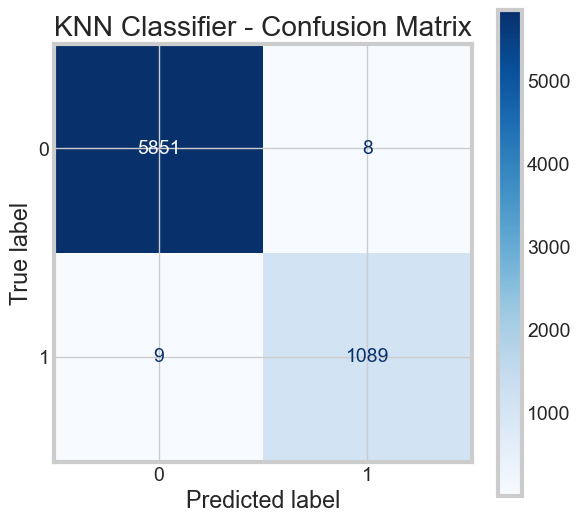


Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      5859
           1       0.99      0.99      0.99      1098

    accuracy                           1.00      6957
   macro avg       1.00      1.00      1.00      6957
weighted avg       1.00      1.00      1.00      6957

Accuracy: 0.9976
Precision: 0.9927
Recall: 0.9918
F1 Score: 0.9923
ROC-AUC Score: 0.9986


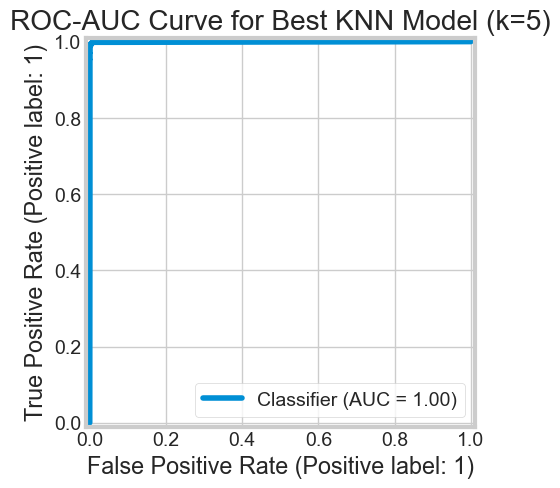

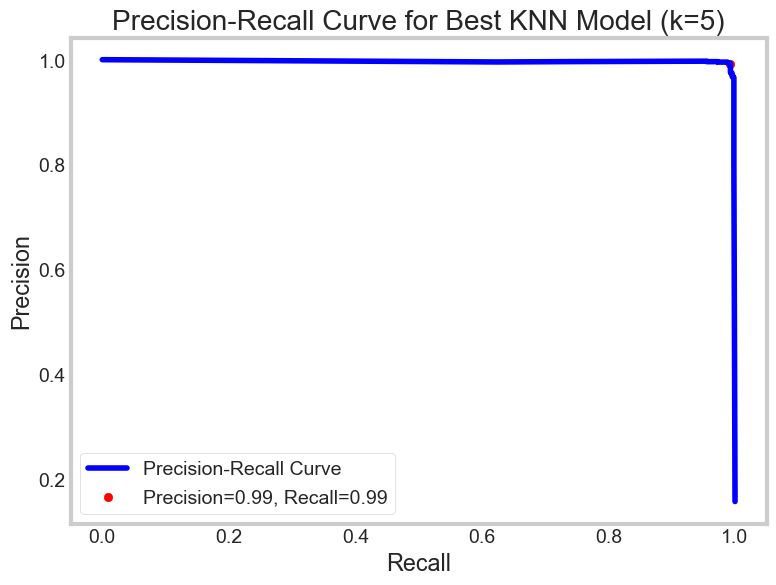


Results DataFrame:
Training set shape: (16231, 32)


In [288]:
# Define KNN model pipeline
knn_pipe = Pipeline(steps=[
    ("preprocessor", preprocessor),
    ("knn", KNeighborsClassifier())
])

# Step 2: Hyperparameter tuning using GridSearchCV
param_grid = {
    'knn__n_neighbors': [5,10,15,20],
    'knn__weights': ['uniform', 'distance'],
    'knn__metric': ['euclidean', 'manhattan']
}

grid_search = GridSearchCV(knn_pipe, param_grid, cv=5, scoring='f1', n_jobs=-1, verbose=1)

# Step 3: Fit the Pipeline and calculate training time
start_train_time = time.time()
grid_search.fit(X_train, y_train)
train_time = time.time() - start_train_time

# Best estimator after hyperparameter tuning
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
print(f"Best Parameters: {best_params}")

# Step 4: Make Predictions
y_pred = best_model.predict(X_test)
y_pred_proba = best_model.predict_proba(X_test)[:, 1]  # Probability estimates for ROC-AUC

# Step 5: Evaluate the Model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, zero_division=0)
recall = recall_score(y_test, y_pred, zero_division=0)
f1 = f1_score(y_test, y_pred, zero_division=0)
roc_auc = roc_auc_score(y_test, y_pred_proba)

# Plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
disp_svm = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp_svm.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("KNN Classifier - Confusion Matrix")
plt.show()

# Print all evaluation metrics
print("\nClassification Report:\n", classification_report(y_test, y_pred))
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC-AUC Score: {roc_auc:.4f}")

# Plot ROC-AUC Curve
RocCurveDisplay.from_predictions(y_test, y_pred_proba)
plt.title(f"ROC-AUC Curve for Best KNN Model (k={best_params['knn__n_neighbors']})")
plt.show()

# Plot Precision-Recall Curve with annotations
precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_pred_proba)
plt.figure(figsize=(8, 6))
plt.plot(recall_vals, precision_vals, label="Precision-Recall Curve", color="blue")
plt.scatter(recall, precision, color="red", label=f'Precision={precision:.2f}, Recall={recall:.2f}')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title(f"Precision-Recall Curve for Best KNN Model (k={best_params['knn__n_neighbors']})")
plt.legend()
plt.grid()
plt.show()

# Step 6: Create or update results DataFrame with all scores
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'KNN Fine Tuned',
    best_model.score(X_train, y_train),
    accuracy,
    precision,
    recall,
    f1,
    train_time,
    roc_auc,
    best_params
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

# Output training set shape for reference
print(f"Training set shape: {X_train.shape}")

### KNN - Hyperparameter tuning and SelectKBest

Fitting 5 folds for each of 60 candidates, totalling 300 fits
Best Parameters: {'feature_selection__k': 15, 'knn__metric': 'manhattan', 'knn__n_neighbors': 15, 'knn__weights': 'distance'}
Test Accuracy: 0.9964


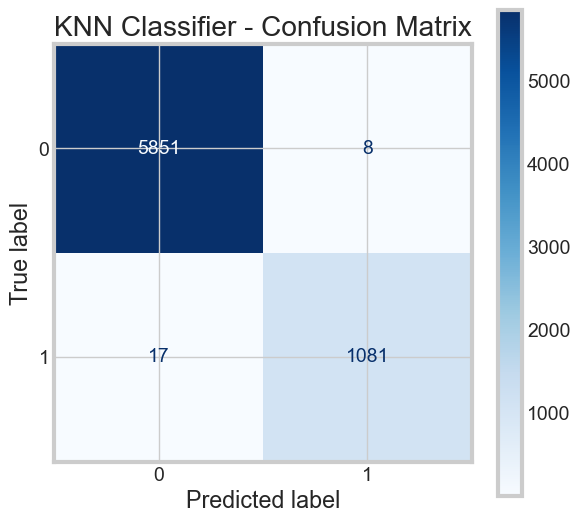


Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      5859
           1       0.99      0.98      0.99      1098

    accuracy                           1.00      6957
   macro avg       0.99      0.99      0.99      6957
weighted avg       1.00      1.00      1.00      6957

Accuracy: 0.9964
Precision: 0.9927
Recall: 0.9845
F1 Score: 0.9886
ROC-AUC Score: 0.9979


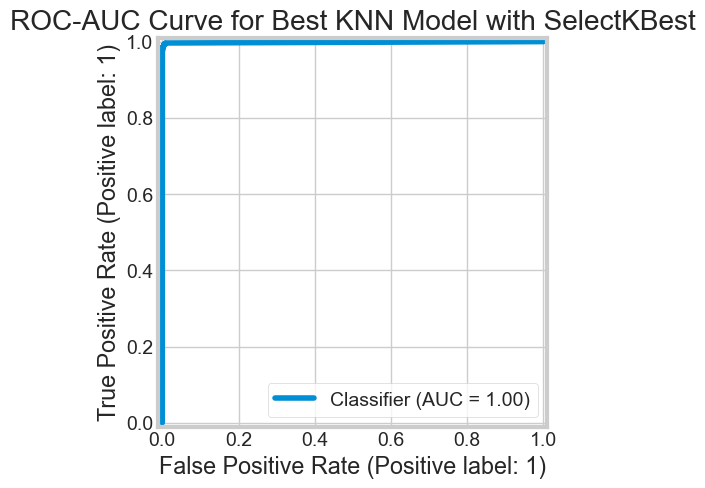

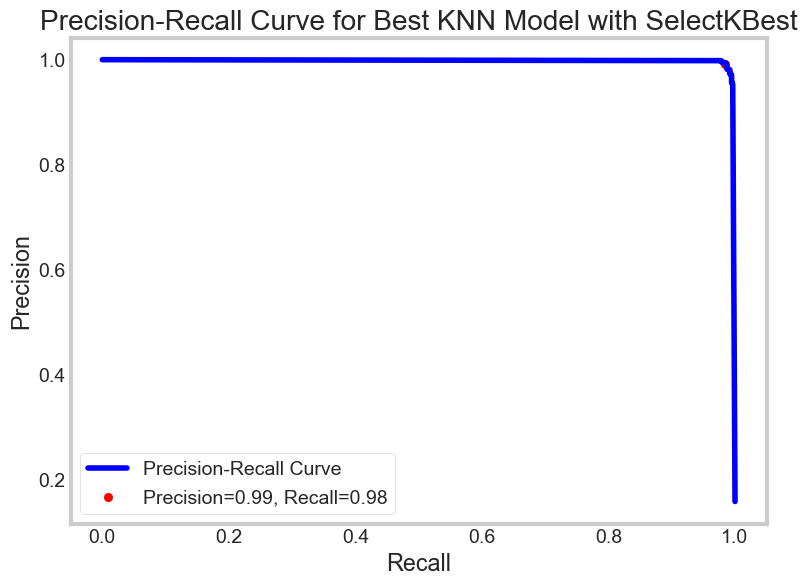


Results DataFrame:
Training set shape: (16231, 32)


In [290]:
# Define KNN model pipeline
knn_pipe = Pipeline(steps=[
    ("preprocessor", preprocessor),
    ('feature_selection', SelectKBest(score_func=f_classif)),
    ("knn", KNeighborsClassifier())
])

# Step 2: Hyperparameter tuning using GridSearchCV
param_grid = {
    'feature_selection__k': [5, 10, 15],                # Number of top features to select
    'knn__n_neighbors': [3, 5, 7, 9, 15],          # Different k values
    'knn__weights': ['uniform', 'distance'],            # Weighting strategies
    'knn__metric': ['euclidean', 'manhattan']
}

grid_search = GridSearchCV(knn_pipe, param_grid, cv=5, scoring='f1', n_jobs=-1, verbose=1)

# Step 3: Fit the Pipeline and calculate training time
start_train_time = time.time()
grid_search.fit(X_train, y_train)
train_time = time.time() - start_train_time

# Best estimator after hyperparameter tuning
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
print(f"Best Parameters: {best_params}")
print(f"Test Accuracy: {best_model.score(X_test, y_test):.4f}")

# Step 4: Make Predictions
y_pred = best_model.predict(X_test)
y_pred_proba = best_model.predict_proba(X_test)[:, 1]  # Probability estimates for ROC-AUC

# Step 5: Evaluate the Model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, zero_division=0)
recall = recall_score(y_test, y_pred, zero_division=0)
f1 = f1_score(y_test, y_pred, zero_division=0)
roc_auc = roc_auc_score(y_test, y_pred_proba)

# Plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
disp_svm = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp_svm.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("KNN Classifier - Confusion Matrix")
plt.show()

# Print all evaluation metrics
print("\nClassification Report:\n", classification_report(y_test, y_pred))
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC-AUC Score: {roc_auc:.4f}")

# Plot ROC-AUC Curve
RocCurveDisplay.from_predictions(y_test, y_pred_proba)
plt.title(f"ROC-AUC Curve for Best KNN Model with SelectKBest")
plt.show()

# Plot Precision-Recall Curve with annotations
precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_pred_proba)
plt.figure(figsize=(8, 6))
plt.plot(recall_vals, precision_vals, label="Precision-Recall Curve", color="blue")
plt.scatter(recall, precision, color="red", label=f'Precision={precision:.2f}, Recall={recall:.2f}')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title(f"Precision-Recall Curve for Best KNN Model with SelectKBest")
plt.legend()
plt.grid()
plt.show()

# Step 6: Create or update results DataFrame with all scores
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'KNN Fine Tuned - SelectKBest',
    best_model.score(X_train, y_train),
    accuracy,
    precision,
    recall,
    f1,
    train_time,
    roc_auc,
    best_params
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

# Output training set shape for reference
print(f"Training set shape: {X_train.shape}")

### KNN - Hyperparameter tuning, SelectKbest and threshold tuning

Fitting 5 folds for each of 60 candidates, totalling 300 fits
Best Parameters: {'feature_selection__k': 15, 'knn__metric': 'manhattan', 'knn__n_neighbors': 15, 'knn__weights': 'distance'}
Test Accuracy: 0.9964


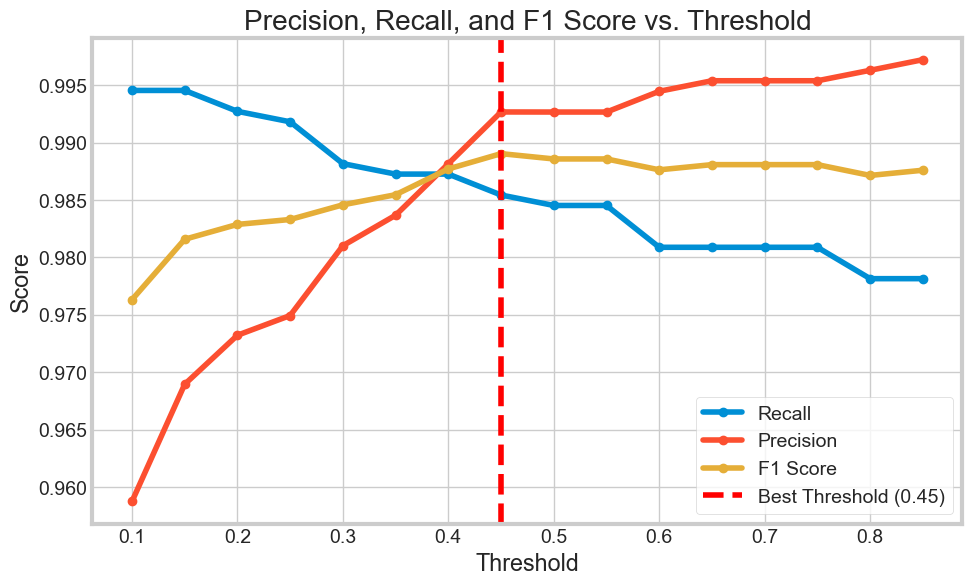

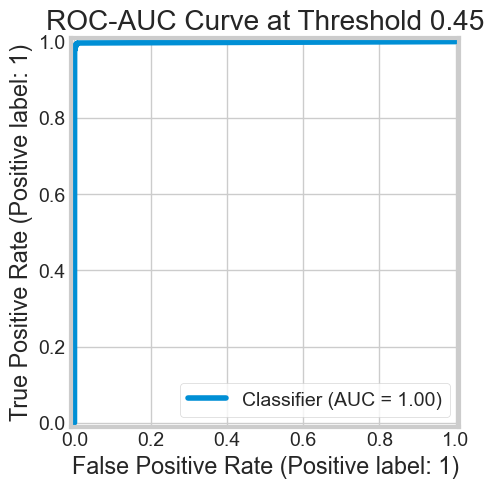

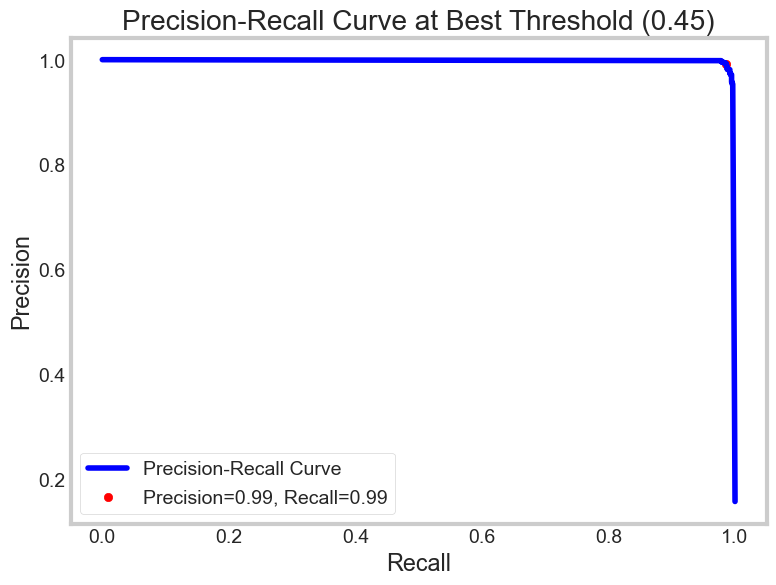

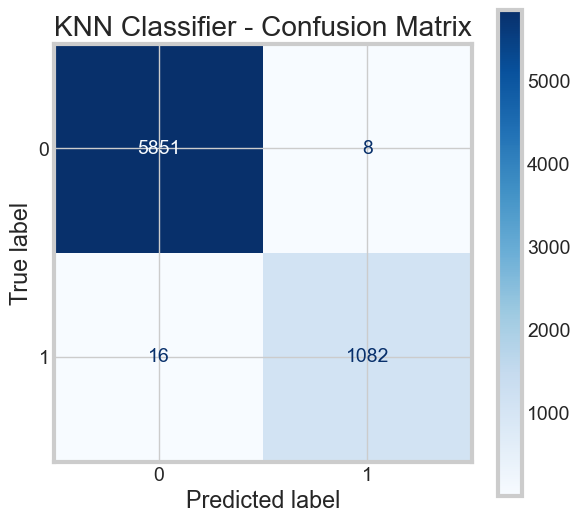

,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,KNN,0.991991,0.981601,0.954120,0.928051,0.940905,0.081555,0.994072,-
1,Logistic Regression,0.851211,0.855397,0.732323,0.132058,0.223765,0.130121,0.742225,-
2,Decision Tree,1.000000,0.992669,0.968666,0.985428,0.976975,0.237636,0.989727,-
3,SVM,0.953977,0.937186,0.970128,0.621129,0.757357,67.384571,0.973716,-
4,Random Forest,1.000000,0.997988,0.999079,0.988160,0.993590,2.259161,0.999933,-
5,AdaBoost,0.863163,0.863734,0.680288,0.257741,0.373844,2.844512,0.830764,-
6,KNN Fine Tuned,1.000000,0.997556,0.992707,0.991803,0.992255,38.572633,0.998640,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
7,KNN Fine Tuned - SelectKBest,1.000000,0.996406,0.992654,0.984517,0.988569,31.833620,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
8,KNN Fine Tuned - SelectKBest - Best Threshold,1.000000,0.996550,0.992661,0.985428,0.989031,36.773519,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."


In [292]:
# Define KNN model pipeline with feature selection
knn_pipe = Pipeline(steps=[
    ("preprocessor", preprocessor),
    ('feature_selection', SelectKBest(score_func=f_classif)),
    ("knn", KNeighborsClassifier())
])

# Hyperparameter tuning using GridSearchCV
param_grid = {
    'feature_selection__k': [5, 10, 15],
    'knn__n_neighbors': [3, 5, 7, 9, 15],
    'knn__weights': ['uniform', 'distance'],
    'knn__metric': ['euclidean', 'manhattan']
}

grid_search = GridSearchCV(knn_pipe, param_grid, cv=5, scoring='f1', n_jobs=-1, verbose=1)

# Fit the Pipeline and calculate training time
start_train_time = time.time()
grid_search.fit(X_train, y_train)
train_time = time.time() - start_train_time

# Best estimator after hyperparameter tuning
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
print(f"Best Parameters: {best_params}")
print(f"Test Accuracy: {best_model.score(X_test, y_test):.4f}")

# Make Predictions
y_pred_proba = best_model.predict_proba(X_test)[:, 1]

# Threshold tuning
thresholds = np.arange(0.1, 0.9, 0.05)
metrics = []

for t in thresholds:
    y_pred_thresh = (y_pred_proba >= t).astype(int)
    accuracy = accuracy_score(y_test, y_pred_thresh)
    precision = precision_score(y_test, y_pred_thresh, zero_division=0)
    recall = recall_score(y_test, y_pred_thresh, zero_division=0)
    f1 = f1_score(y_test, y_pred_thresh, zero_division=0)
    roc_auc = roc_auc_score(y_test, y_pred_proba)
    metrics.append([t, accuracy, precision, recall, f1, roc_auc])

# Convert to DataFrame for analysis
threshold_df = pd.DataFrame(metrics, columns=['Threshold', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC-AUC'])

# Identify the best threshold (based on F1 Score)
best_threshold_row = threshold_df.loc[threshold_df['F1 Score'].idxmax()]
best_threshold = best_threshold_row['Threshold']

# Final Predictions using the best threshold
y_pred_final = (y_pred_proba >= best_threshold).astype(int)
final_accuracy = accuracy_score(y_test, y_pred_final)
final_precision = precision_score(y_test, y_pred_final, zero_division=0)
final_recall = recall_score(y_test, y_pred_final, zero_division=0)
final_f1 = f1_score(y_test, y_pred_final, zero_division=0)
final_roc_auc = roc_auc_score(y_test, y_pred_proba)

# Plot Precision, Recall, and F1 Score vs. Threshold
plt.figure(figsize=(10, 6))
plt.plot(threshold_df['Threshold'], threshold_df['Recall'], label='Recall', marker='o')
plt.plot(threshold_df['Threshold'], threshold_df['Precision'], label='Precision', marker='o')
plt.plot(threshold_df['Threshold'], threshold_df['F1 Score'], label='F1 Score', marker='o')
plt.axvline(x=best_threshold, color='red', linestyle='--', label=f'Best Threshold ({best_threshold:.2f})')
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("Precision, Recall, and F1 Score vs. Threshold")
plt.legend()
plt.grid(True)
plt.show()

# Plot ROC-AUC Curve
RocCurveDisplay.from_predictions(y_test, y_pred_proba)
plt.title(f"ROC-AUC Curve at Threshold {best_threshold:.2f}")
plt.show()

# Plot Precision-Recall Curve with annotations
precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_pred_proba)
plt.figure(figsize=(8, 6))
plt.plot(recall_vals, precision_vals, label="Precision-Recall Curve", color="blue")
plt.scatter(final_recall, final_precision, color="red",
            label=f'Precision={final_precision:.2f}, Recall={final_recall:.2f}')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title(f"Precision-Recall Curve at Best Threshold ({best_threshold:.2f})")
plt.legend()
plt.grid()
plt.show()

# Plot confusion matrix
cm = confusion_matrix(y_test, y_pred_final)
disp_svm = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp_svm.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("KNN Classifier - Confusion Matrix")
plt.show()

# Create or update results DataFrame with all scores
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([
    ['KNN Fine Tuned - SelectKBest - Best Threshold',
     best_model.score(X_train, y_train), final_accuracy, final_precision, final_recall,
     final_f1, train_time, final_roc_auc, best_params]
], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)
results_df

### Logistic Regression - Hyperparameter tuning

Fitting 5 folds for each of 16 candidates, totalling 80 fits
Best Parameters: {'classifier__C': 10, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear'}
Test Accuracy: 0.8547


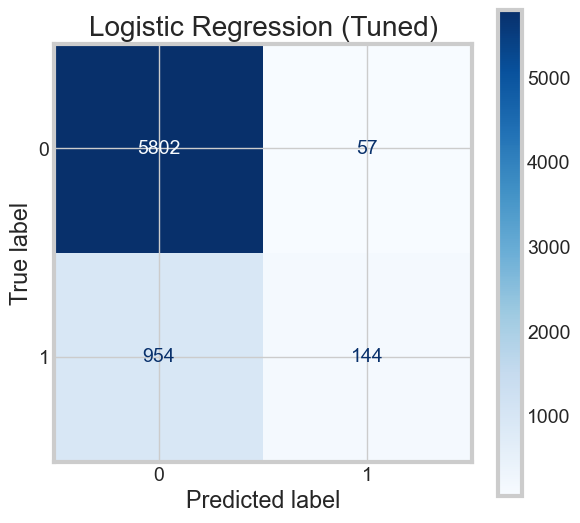


Classification Report:

              precision    recall  f1-score   support

           0       0.86      0.99      0.92      5859
           1       0.72      0.13      0.22      1098

    accuracy                           0.85      6957
   macro avg       0.79      0.56      0.57      6957
weighted avg       0.84      0.85      0.81      6957

Train Accuracy: 0.8512
Test Accuracy: 0.8547
Precision: 0.7164
Recall: 0.1311
F1 Score: 0.2217
ROC-AUC Score: 0.7423


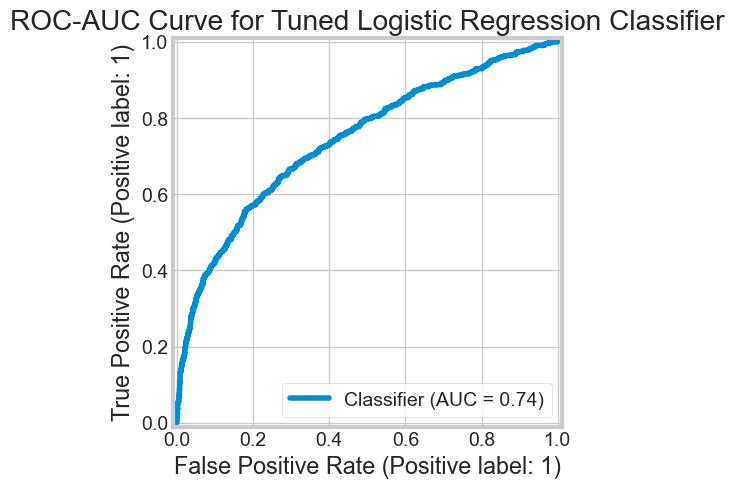

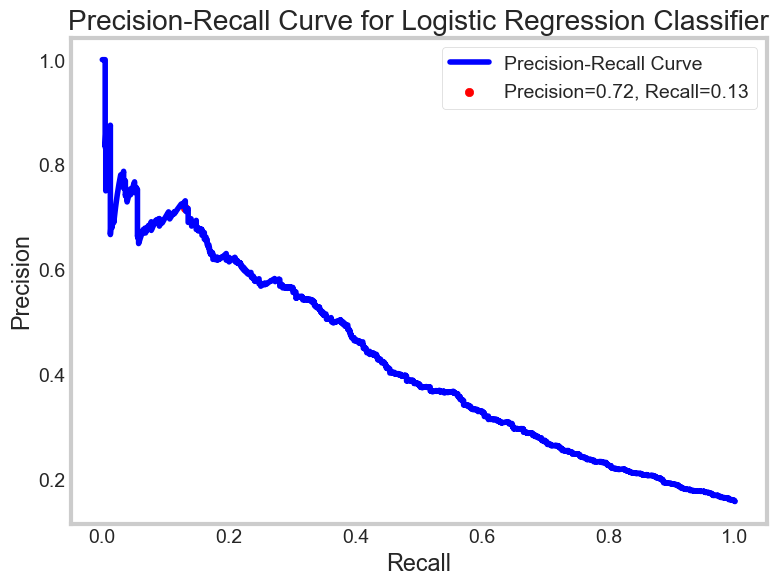

Training set shape: (16231, 32)

Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,KNN,0.991991,0.981601,0.954120,0.928051,0.940905,0.081555,0.994072,-
1,Logistic Regression,0.851211,0.855397,0.732323,0.132058,0.223765,0.130121,0.742225,-
2,Decision Tree,1.000000,0.992669,0.968666,0.985428,0.976975,0.237636,0.989727,-
3,SVM,0.953977,0.937186,0.970128,0.621129,0.757357,67.384571,0.973716,-
4,Random Forest,1.000000,0.997988,0.999079,0.988160,0.993590,2.259161,0.999933,-
5,AdaBoost,0.863163,0.863734,0.680288,0.257741,0.373844,2.844512,0.830764,-
6,KNN Fine Tuned,1.000000,0.997556,0.992707,0.991803,0.992255,38.572633,0.998640,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
7,KNN Fine Tuned - SelectKBest,1.000000,0.996406,0.992654,0.984517,0.988569,31.833620,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
8,KNN Fine Tuned - SelectKBest - Best Threshold,1.000000,0.996550,0.992661,0.985428,0.989031,36.773519,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.851211,0.854679,0.716418,0.131148,0.221709,28.110595,0.742265,"{'classifier__C': 10, 'classifier__penalty': '..."


In [294]:
# Define pipeline with Logistic Regression
pipeline = Pipeline(steps=[
    ("preprocessor", preprocessor),
    ("classifier", LogisticRegression())
])

# Hyperparameter tuning using GridSearchCV
param_grid = {
    'classifier__C': [0.01, 0.1, 1, 10],
    'classifier__penalty': ['l1', 'l2'],
    'classifier__solver': ['liblinear', 'saga']
}

grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='f1', n_jobs=-1, verbose=1)

# Train the model Fine Tuned
start_train_time = time.time()
grid_search.fit(X_train, y_train)
train_time = time.time() - start_train_time

# Best estimator after tuning
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
print(f"Best Parameters: {best_params}")
print(f"Test Accuracy: {best_model.score(X_test, y_test):.4f}")

# Make predictions
y_pred = best_model.predict(X_test)
y_pred_proba = best_model.predict_proba(X_test)[:, 1]  # Probability estimates for ROC-AUC

# Generate and display confusion matrix
cm = confusion_matrix(y_test, y_pred)
disp_numeric = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])

# Plot confusion matrix
fig, ax = plt.subplots(figsize=(6, 6))
disp_numeric.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("Logistic Regression (Tuned)")
plt.show()

# Calculate key metrics
train_accuracy = best_model.score(X_train, y_train)
test_accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, zero_division=0)
recall = recall_score(y_test, y_pred, zero_division=0)
f1 = f1_score(y_test, y_pred, zero_division=0)
roc_auc = roc_auc_score(y_test, y_pred_proba)

# Print all evaluation metrics
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))
print(f"Train Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC-AUC Score: {roc_auc:.4f}")

# Plot ROC-AUC Curve
RocCurveDisplay.from_predictions(y_test, y_pred_proba)
plt.title("ROC-AUC Curve for Tuned Logistic Regression Classifier")
plt.show()

# Plot Precision-Recall Curve with annotations
precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_pred_proba)
plt.figure(figsize=(8, 6))
plt.plot(recall_vals, precision_vals, label="Precision-Recall Curve", color="blue")
plt.scatter(recall, precision, color="red", label=f'Precision={precision:.2f}, Recall={recall:.2f}')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve for Logistic Regression Classifier")
plt.legend()
plt.grid()
plt.show()

# Output training set shape for reference
print(f"Training set shape: {X_train.shape}")

# Create or update results DataFrame with all scores
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'Logistic Regression Classifier Fine Tuned',
    train_accuracy,
    test_accuracy,
    precision,
    recall,
    f1,
    train_time,
    roc_auc,
    best_params
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

### Logistic Regression - Hyperparameter tuning and SelectKBest

Fitting 5 folds for each of 64 candidates, totalling 320 fits
Best Parameters: {'classifier__C': 10, 'classifier__penalty': 'l1', 'classifier__solver': 'saga', 'feature_selection__k': 20}
Test Accuracy: 0.8488


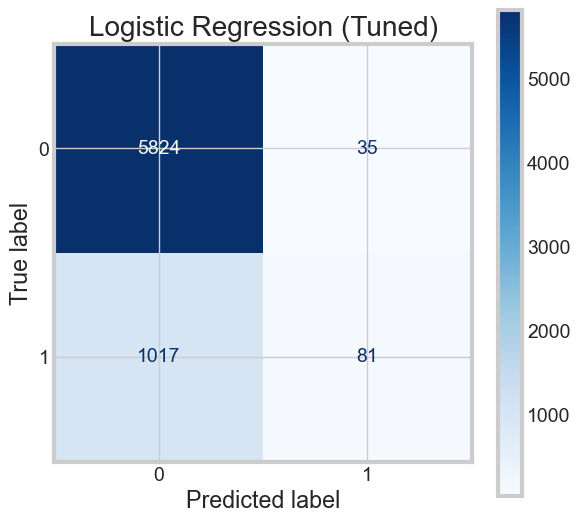


Classification Report:

              precision    recall  f1-score   support

           0       0.85      0.99      0.92      5859
           1       0.70      0.07      0.13      1098

    accuracy                           0.85      6957
   macro avg       0.77      0.53      0.53      6957
weighted avg       0.83      0.85      0.79      6957

Train Accuracy: 0.8481
Test Accuracy: 0.8488
Precision: 0.6983
Recall: 0.0738
F1 Score: 0.1334
ROC-AUC Score: 0.7247


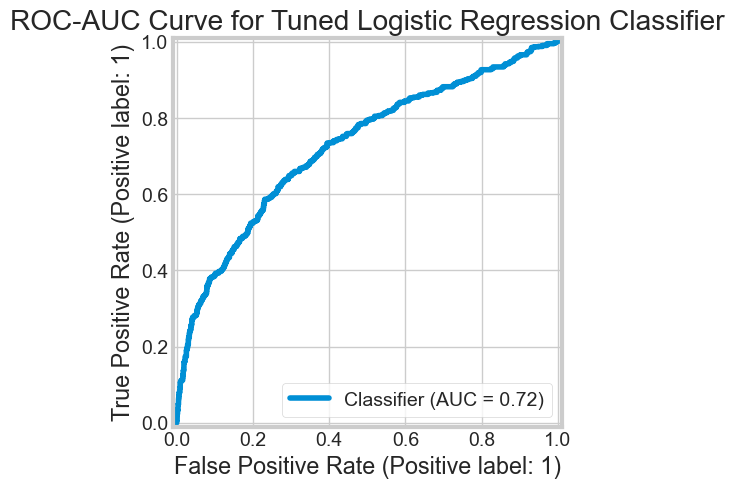

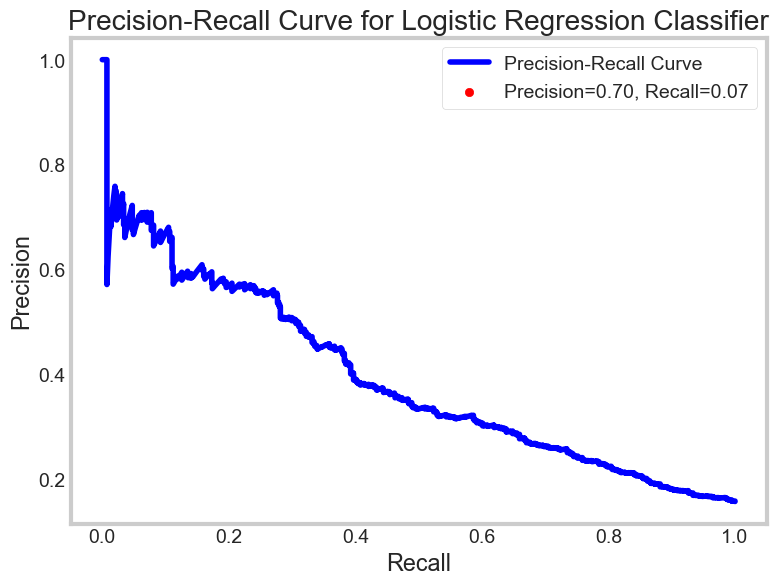

Training set shape: (16231, 32)

Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,KNN,0.991991,0.981601,0.954120,0.928051,0.940905,0.081555,0.994072,-
1,Logistic Regression,0.851211,0.855397,0.732323,0.132058,0.223765,0.130121,0.742225,-
2,Decision Tree,1.000000,0.992669,0.968666,0.985428,0.976975,0.237636,0.989727,-
3,SVM,0.953977,0.937186,0.970128,0.621129,0.757357,67.384571,0.973716,-
4,Random Forest,1.000000,0.997988,0.999079,0.988160,0.993590,2.259161,0.999933,-
5,AdaBoost,0.863163,0.863734,0.680288,0.257741,0.373844,2.844512,0.830764,-
6,KNN Fine Tuned,1.000000,0.997556,0.992707,0.991803,0.992255,38.572633,0.998640,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
7,KNN Fine Tuned - SelectKBest,1.000000,0.996406,0.992654,0.984517,0.988569,31.833620,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
8,KNN Fine Tuned - SelectKBest - Best Threshold,1.000000,0.996550,0.992661,0.985428,0.989031,36.773519,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.851211,0.854679,0.716418,0.131148,0.221709,28.110595,0.742265,"{'classifier__C': 10, 'classifier__penalty': '..."


In [296]:
# Define pipeline with Logistic Regression
pipeline = Pipeline(steps=[
    ("preprocessor", preprocessor),
    ("feature_selection", SelectKBest(score_func=f_classif)),
    ("classifier", LogisticRegression())
])

# Hyperparameter tuning using GridSearchCV
param_grid = {
    'feature_selection__k': [5, 10, 15, 20],
    'classifier__C': [0.01, 0.1, 1, 10],
    'classifier__penalty': ['l1', 'l2'],
    'classifier__solver': ['liblinear', 'saga']
}

grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='f1', n_jobs=-1, verbose=1)

# Train the model Fine Tuned
start_train_time = time.time()
grid_search.fit(X_train, y_train)
train_time = time.time() - start_train_time

# Best estimator after tuning
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
print(f"Best Parameters: {best_params}")
print(f"Test Accuracy: {best_model.score(X_test, y_test):.4f}")

# Make predictions
y_pred = best_model.predict(X_test)
y_pred_proba = best_model.predict_proba(X_test)[:, 1]  # Probability estimates for ROC-AUC

# Generate and display confusion matrix
cm = confusion_matrix(y_test, y_pred)
disp_numeric = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])

# Plot confusion matrix
fig, ax = plt.subplots(figsize=(6, 6))
disp_numeric.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("Logistic Regression (Tuned)")
plt.show()

# Calculate key metrics
train_accuracy = best_model.score(X_train, y_train)
test_accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, zero_division=0)
recall = recall_score(y_test, y_pred, zero_division=0)
f1 = f1_score(y_test, y_pred, zero_division=0)
roc_auc = roc_auc_score(y_test, y_pred_proba)

# Print all evaluation metrics
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))
print(f"Train Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC-AUC Score: {roc_auc:.4f}")

# Plot ROC-AUC Curve
RocCurveDisplay.from_predictions(y_test, y_pred_proba)
plt.title("ROC-AUC Curve for Tuned Logistic Regression Classifier")
plt.show()

# Plot Precision-Recall Curve with annotations
precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_pred_proba)
plt.figure(figsize=(8, 6))
plt.plot(recall_vals, precision_vals, label="Precision-Recall Curve", color="blue")
plt.scatter(recall, precision, color="red", label=f'Precision={precision:.2f}, Recall={recall:.2f}')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve for Logistic Regression Classifier")
plt.legend()
plt.grid()
plt.show()

# Output training set shape for reference
print(f"Training set shape: {X_train.shape}")

# Create or update results DataFrame with all scores
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'Logistic Regression Classifier Fine Tuned - SelectKBest',
    train_accuracy,
    test_accuracy,
    precision,
    recall,
    f1,
    train_time,
    roc_auc,
    best_params
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

### Logistic Regression - Hyperparameter tuning and SelectKBest and class_weight='balanced'

Fitting 5 folds for each of 18 candidates, totalling 90 fits
🔎 Best Parameters: {'classifier__C': 1, 'classifier__penalty': 'l1', 'classifier__solver': 'saga', 'feature_selection__k': 20}


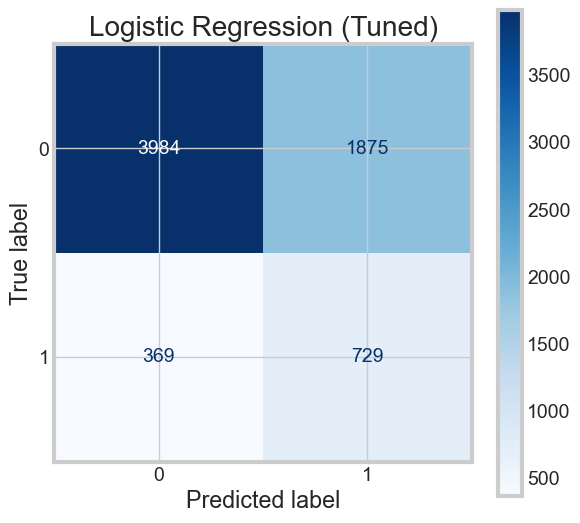


📊 Classification Report:

              precision    recall  f1-score   support

           0       0.92      0.68      0.78      5859
           1       0.28      0.66      0.39      1098

    accuracy                           0.68      6957
   macro avg       0.60      0.67      0.59      6957
weighted avg       0.81      0.68      0.72      6957

✅ Train Accuracy: 0.6757
✅ Test Accuracy: 0.6774
✅ Precision: 0.2800
✅ Recall: 0.6639
✅ F1 Score: 0.3938
✅ ROC-AUC Score: 0.7247


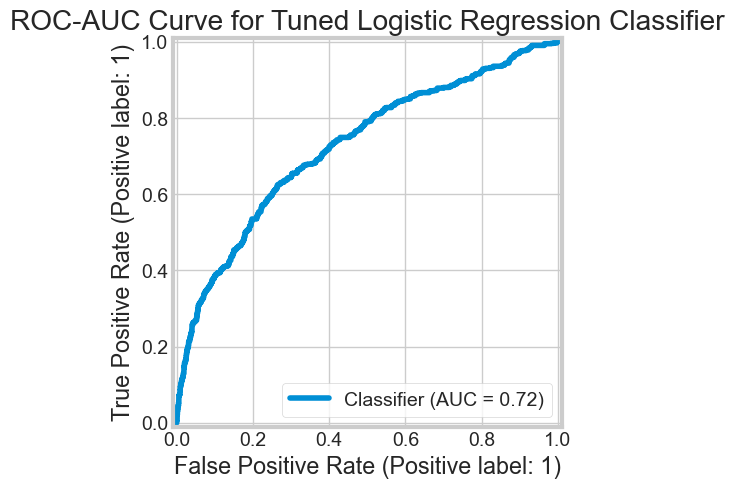

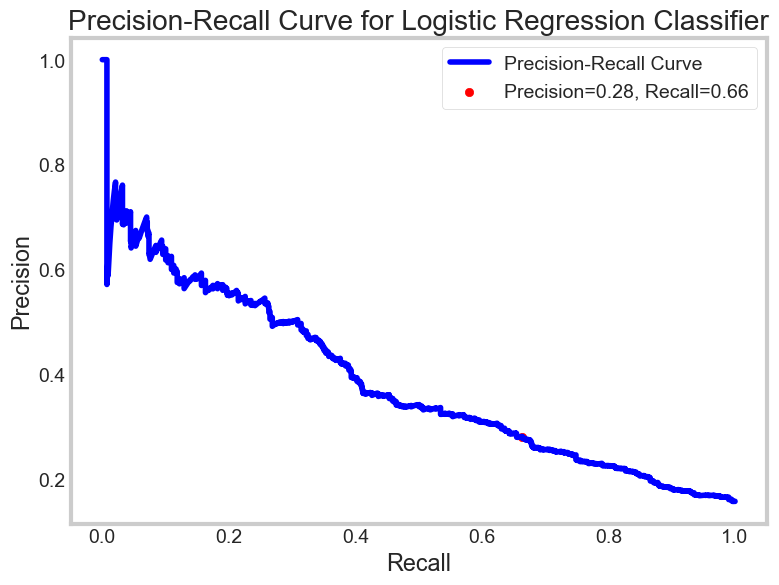


📊 Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,KNN,0.991991,0.981601,0.954120,0.928051,0.940905,0.081555,0.994072,-
1,Logistic Regression,0.851211,0.855397,0.732323,0.132058,0.223765,0.130121,0.742225,-
2,Decision Tree,1.000000,0.992669,0.968666,0.985428,0.976975,0.237636,0.989727,-
3,SVM,0.953977,0.937186,0.970128,0.621129,0.757357,67.384571,0.973716,-
4,Random Forest,1.000000,0.997988,0.999079,0.988160,0.993590,2.259161,0.999933,-
5,AdaBoost,0.863163,0.863734,0.680288,0.257741,0.373844,2.844512,0.830764,-
6,KNN Fine Tuned,1.000000,0.997556,0.992707,0.991803,0.992255,38.572633,0.998640,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
7,KNN Fine Tuned - SelectKBest,1.000000,0.996406,0.992654,0.984517,0.988569,31.833620,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
8,KNN Fine Tuned - SelectKBest - Best Threshold,1.000000,0.996550,0.992661,0.985428,0.989031,36.773519,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.851211,0.854679,0.716418,0.131148,0.221709,28.110595,0.742265,"{'classifier__C': 10, 'classifier__penalty': '..."


In [298]:
# Define pipeline with Logistic Regression
pipeline = Pipeline(steps=[
    ("preprocessor", preprocessor),
    ("feature_selection", SelectKBest(score_func=f_classif)),
    ("classifier", LogisticRegression(class_weight='balanced'))  # Handle imbalance
])

# Improved Hyperparameter tuning using GridSearchCV
param_grid = {
    'feature_selection__k': [10, 15, 20],  # Removed lower values to avoid underfitting
    'classifier__C': [0.1, 1, 10],  # Avoid extreme regularization
    'classifier__penalty': ['l1', 'l2'],
    'classifier__solver': ['saga']  # 'saga' is better for L1 & large datasets
}

grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='f1', n_jobs=-1, verbose=1)

# Train the fine-tuned model
start_train_time = time.time()
grid_search.fit(X_train, y_train)
train_time = time.time() - start_train_time

# Best estimator after tuning
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
print(f"🔎 Best Parameters: {best_params}")

# Make predictions
y_pred = best_model.predict(X_test)
y_pred_proba = best_model.predict_proba(X_test)[:, 1]  # Probability estimates for ROC-AUC

# Generate and display confusion matrix
cm = confusion_matrix(y_test, y_pred)
disp_numeric = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])

# Plot confusion matrix
fig, ax = plt.subplots(figsize=(6, 6))
disp_numeric.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("Logistic Regression (Tuned)")
plt.show()

# Calculate key metrics
train_accuracy = best_model.score(X_train, y_train)
test_accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, zero_division=0)
recall = recall_score(y_test, y_pred, zero_division=0)
f1 = f1_score(y_test, y_pred, zero_division=0)
roc_auc = roc_auc_score(y_test, y_pred_proba)

# Print all evaluation metrics
print("\n📊 Classification Report:\n")
print(classification_report(y_test, y_pred))
print(f"✅ Train Accuracy: {train_accuracy:.4f}")
print(f"✅ Test Accuracy: {test_accuracy:.4f}")
print(f"✅ Precision: {precision:.4f}")
print(f"✅ Recall: {recall:.4f}")
print(f"✅ F1 Score: {f1:.4f}")
print(f"✅ ROC-AUC Score: {roc_auc:.4f}")

# Plot ROC-AUC Curve
RocCurveDisplay.from_predictions(y_test, y_pred_proba)
plt.title("ROC-AUC Curve for Tuned Logistic Regression Classifier")
plt.show()

# Plot Precision-Recall Curve with annotations
precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_pred_proba)
plt.figure(figsize=(8, 6))
plt.plot(recall_vals, precision_vals, label="Precision-Recall Curve", color="blue")
plt.scatter(recall, precision, color="red", label=f'Precision={precision:.2f}, Recall={recall:.2f}')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve for Logistic Regression Classifier")
plt.legend()
plt.grid()
plt.show()

# Store results in DataFrame
current_results = pd.DataFrame([[
    'Logistic Regression Classifier - Optimized',
    train_accuracy,
    test_accuracy,
    precision,
    recall,
    f1,
    train_time,
    roc_auc,
    best_params
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\n📊 Results DataFrame:")
display(results_df)

#### Logistic Regression Tuned with Optimized Threshold

Fitting 5 folds for each of 240 candidates, totalling 1200 fits
Best Parameters: {'classifier__C': 0.1, 'classifier__class_weight': 'balanced', 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear', 'feature_selection__k': 50}
🔹 Best Threshold for Maximum F1-Score: 0.663

🔹 Classification Report (Optimized Threshold):

              precision    recall  f1-score   support

           0       0.89      0.90      0.90      5859
           1       0.44      0.42      0.43      1098

    accuracy                           0.82      6957
   macro avg       0.67      0.66      0.66      6957
weighted avg       0.82      0.82      0.82      6957

🔹 Optimized Precision: 0.4401
🔹 Optimized Recall: 0.4217
🔹 Optimized F1 Score: 0.4307
🔹 Optimized ROC-AUC Score: 0.6606


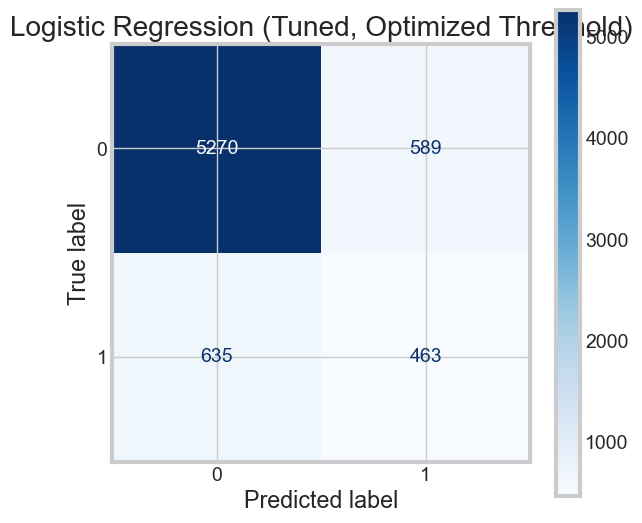

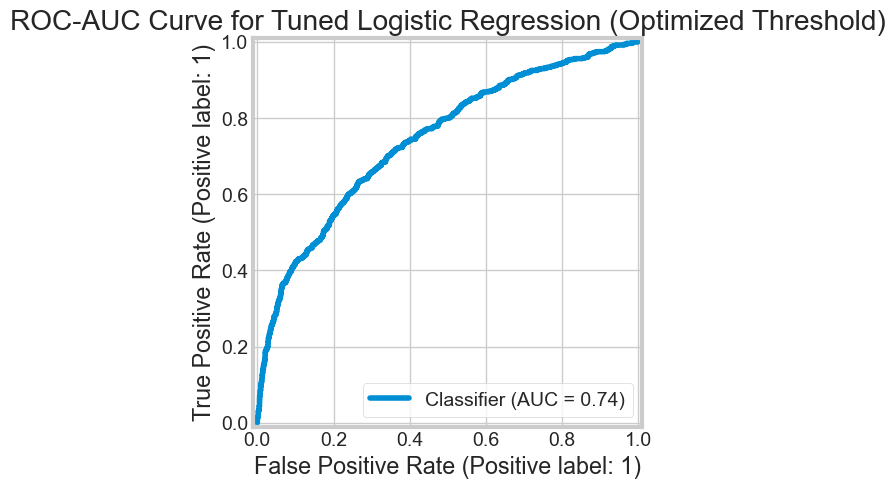

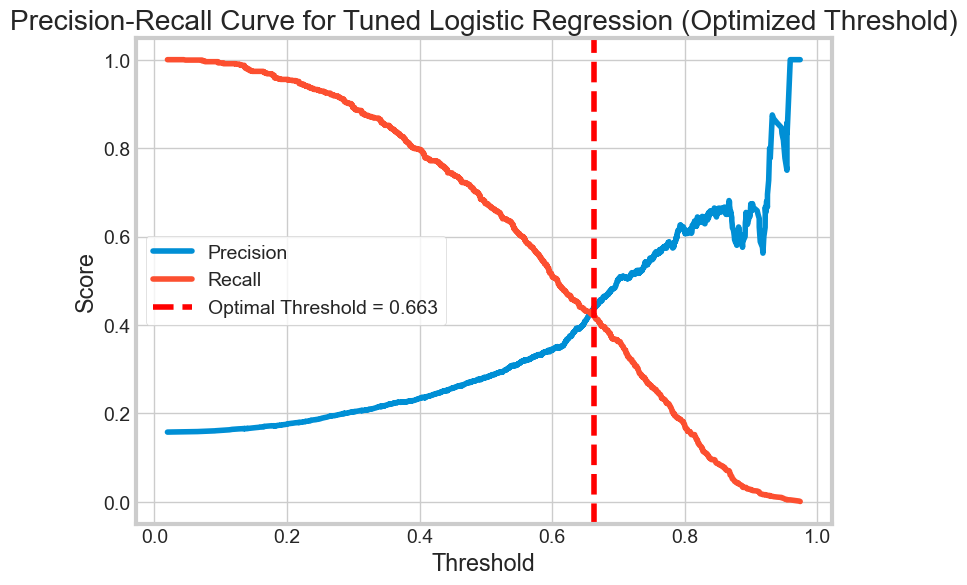


🔹 Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,KNN,0.991991,0.981601,0.954120,0.928051,0.940905,0.081555,0.994072,-
1,Logistic Regression,0.851211,0.855397,0.732323,0.132058,0.223765,0.130121,0.742225,-
2,Decision Tree,1.000000,0.992669,0.968666,0.985428,0.976975,0.237636,0.989727,-
3,SVM,0.953977,0.937186,0.970128,0.621129,0.757357,67.384571,0.973716,-
4,Random Forest,1.000000,0.997988,0.999079,0.988160,0.993590,2.259161,0.999933,-
5,AdaBoost,0.863163,0.863734,0.680288,0.257741,0.373844,2.844512,0.830764,-
6,KNN Fine Tuned,1.000000,0.997556,0.992707,0.991803,0.992255,38.572633,0.998640,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
7,KNN Fine Tuned - SelectKBest,1.000000,0.996406,0.992654,0.984517,0.988569,31.833620,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
8,KNN Fine Tuned - SelectKBest - Best Threshold,1.000000,0.996550,0.992661,0.985428,0.989031,36.773519,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.851211,0.854679,0.716418,0.131148,0.221709,28.110595,0.742265,"{'classifier__C': 10, 'classifier__penalty': '..."


In [300]:
# Define pipeline with Logistic Regression
pipeline = Pipeline(steps=[
    ("preprocessor", preprocessor),
    ("feature_selection", SelectKBest(score_func=f_classif)),
    ("classifier", LogisticRegression(max_iter=1000))  # Increased max_iter for convergence
])

# Hyperparameter tuning with improved search space
param_grid = {
    'feature_selection__k': [10, 20, 30, 40, 50],  # Expanded range to retain more features
    'classifier__C': [0.01, 0.1, 1, 10, 100, 1000],  # Higher C for better separation
    'classifier__penalty': ['l1', 'l2'],  # L1 (lasso) and L2 (ridge)
    'classifier__solver': ['liblinear', 'saga'],  # Correct solver for penalties
    'classifier__class_weight': ['balanced', None]  # Adjusting for class imbalance
}

# Use StratifiedKFold for more balanced training splits
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# GridSearchCV optimizing F1-score
grid_search = GridSearchCV(pipeline, param_grid, cv=cv, scoring='f1', n_jobs=-1, verbose=1)

# Train the model with hyperparameter tuning
start_train_time = time.time()
grid_search.fit(X_train, y_train)
train_time = time.time() - start_train_time

# Best estimator after tuning
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
print(f"Best Parameters: {best_params}")

# Make predictions using the best model
y_proba = best_model.predict_proba(X_test)[:, 1]  # Probability estimates for threshold tuning

# **🔹 Find the Best Threshold using Precision-Recall Curve**
precisions, recalls, thresholds = precision_recall_curve(y_test, y_proba)
f1_scores = 2 * (precisions * recalls) / (precisions + recalls + 1e-9)
optimal_idx = np.argmax(f1_scores)
optimal_threshold = thresholds[optimal_idx]

print(f"🔹 Best Threshold for Maximum F1-Score: {optimal_threshold:.3f}")

# Apply new threshold
y_pred_optimal = (y_proba > optimal_threshold).astype(int)

# **Recalculate Metrics with Optimized Threshold**
precision_opt = precision_score(y_test, y_pred_optimal, zero_division=0)
recall_opt = recall_score(y_test, y_pred_optimal, zero_division=0)
f1_opt = f1_score(y_test, y_pred_optimal, zero_division=0)
roc_auc_opt = roc_auc_score(y_test, y_pred_optimal)

# **🔹 Print adjusted classification metrics**
print("\n🔹 Classification Report (Optimized Threshold):\n")
print(classification_report(y_test, y_pred_optimal))
print(f"🔹 Optimized Precision: {precision_opt:.4f}")
print(f"🔹 Optimized Recall: {recall_opt:.4f}")
print(f"🔹 Optimized F1 Score: {f1_opt:.4f}")
print(f"🔹 Optimized ROC-AUC Score: {roc_auc_opt:.4f}")

# **Confusion Matrix**
cm = confusion_matrix(y_test, y_pred_optimal)
disp_numeric = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])

# **Plot Confusion Matrix**
fig, ax = plt.subplots(figsize=(6, 6))
disp_numeric.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("Logistic Regression (Tuned, Optimized Threshold)")
plt.show()

# **Plot ROC-AUC Curve**
RocCurveDisplay.from_predictions(y_test, y_proba)
plt.title("ROC-AUC Curve for Tuned Logistic Regression (Optimized Threshold)")
plt.show()

# **Plot Precision-Recall Curve**
plt.figure(figsize=(8, 6))
plt.plot(thresholds, precisions[:-1], label="Precision")
plt.plot(thresholds, recalls[:-1], label="Recall")
plt.axvline(optimal_threshold, color='r', linestyle='--', label=f"Optimal Threshold = {optimal_threshold:.3f}")
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("Precision-Recall Curve for Tuned Logistic Regression (Optimized Threshold)")
plt.legend()
plt.show()

# Store results in DataFrame with updated column names
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score',
        'train time (s)', 'ROC-AUC', 'Best Params'
    ])

# Compute train accuracy
train_accuracy = best_model.score(X_train, y_train)
test_accuracy = best_model.score(X_test, y_test)

# Create a new DataFrame entry with updated metrics
current_results = pd.DataFrame([[
    'Logistic Regression (Optimal Threshold)',
    train_accuracy,
    test_accuracy,
    precision_opt,
    recall_opt,
    f1_opt,
    train_time,
    roc_auc_opt,
    best_params
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score',
    'train time (s)', 'ROC-AUC', 'Best Params'
])

# Concatenate the updated results
results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\n🔹 Results DataFrame:")
results_df

# Best Parameters: {'classifier__C': 0.1, 'classifier__class_weight': 'balanced', 'classifier__penalty': 'l1',
#'classifier__solver': 'saga', 'feature_selection__k': 50}


 Top Positive Coefficients:
                                   Feature  Coefficient
21  cat__BusinessTravel_Travel_Frequently     0.626268
29   cat__EducationField_Technical Degree     0.384864
40              cat__MaritalStatus_Single     0.368917
42                      cat__OverTime_Yes     0.301978
33     cat__JobRole_Laboratory Technician     0.269714
37      cat__JobRole_Sales Representative     0.249091
16                    num__YearsAtCompany     0.191528
44    cat__EmployeeSource_Company Website     0.183299
46               cat__EmployeeSource_Jora     0.180711
5                         num__HourlyRate     0.169302

 Top Negative Coefficients:
                                    Feature  Coefficient
14              num__TrainingTimesLastYear    -0.182408
38             cat__MaritalStatus_Divorced    -0.183654
6                      num__JobInvolvement    -0.202786
4             num__EnvironmentSatisfaction    -0.204912
17                 num__YearsInCurrentRole    -0.232305

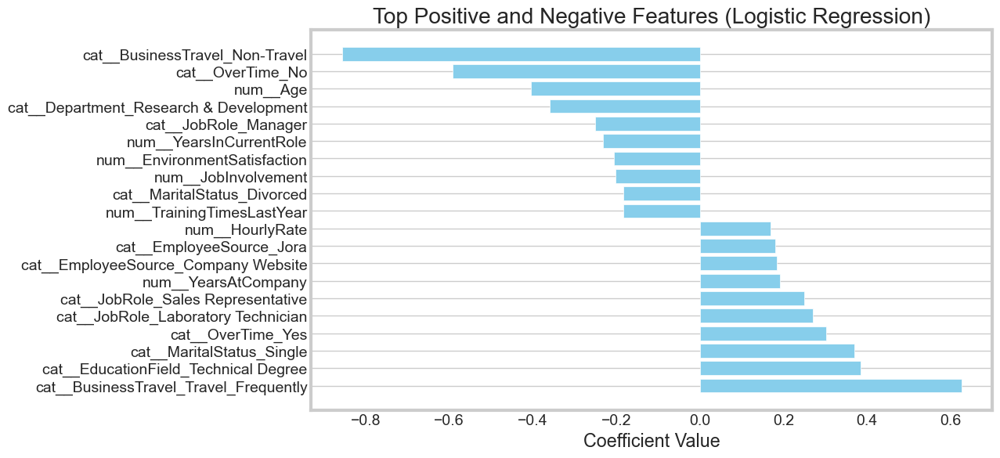

In [301]:
# ============================
# DISPLAY TOP COEFFICIENTS
# ============================

# Extract logistic regression model and feature names
logistic_model = best_model.named_steps['classifier']
preprocessor = best_model.named_steps['preprocessor']
feature_selector = best_model.named_steps['feature_selection']

# Get feature names after preprocessing
feature_names = preprocessor.get_feature_names_out()

# Apply feature selection mask (SelectKBest)
support_mask = feature_selector.get_support()
selected_features = np.array(feature_names)[support_mask]

# Extract coefficients
coefficients = logistic_model.coef_.flatten()

# Create DataFrame for feature importance
coef_df = pd.DataFrame({'Feature': selected_features, 'Coefficient': coefficients})
coef_df = coef_df.sort_values(by='Coefficient', ascending=False)

# Display top positive and negative coefficients
print("\n Top Positive Coefficients:\n", coef_df.head(10))
print("\n Top Negative Coefficients:\n", coef_df.tail(10))

# Optional Visualization
top_features = pd.concat([coef_df.head(10), coef_df.tail(10)])

plt.figure(figsize=(10, 6))
plt.barh(top_features['Feature'], top_features['Coefficient'], color='skyblue')
plt.xlabel("Coefficient Value")
plt.title("Top Positive and Negative Features (Logistic Regression)")
plt.grid(axis='x')
plt.show()


### Decision Tree - Hyperparameter tuning

Fitting 5 folds for each of 54 candidates, totalling 270 fits

Classification Report (Decision Tree - Tuned):

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      5859
           1       0.96      0.93      0.94      1098

    accuracy                           0.98      6957
   macro avg       0.97      0.96      0.97      6957
weighted avg       0.98      0.98      0.98      6957



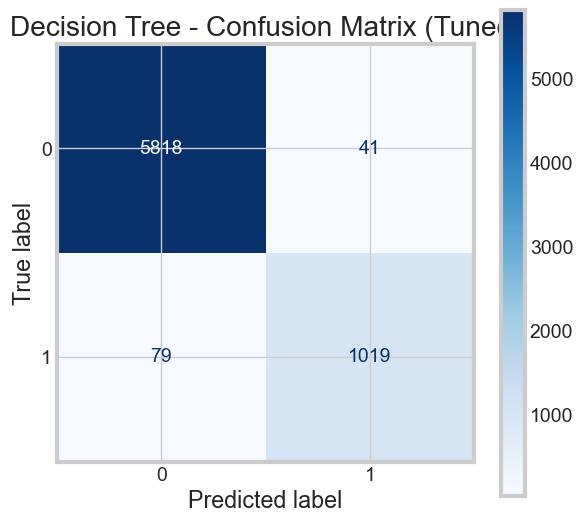

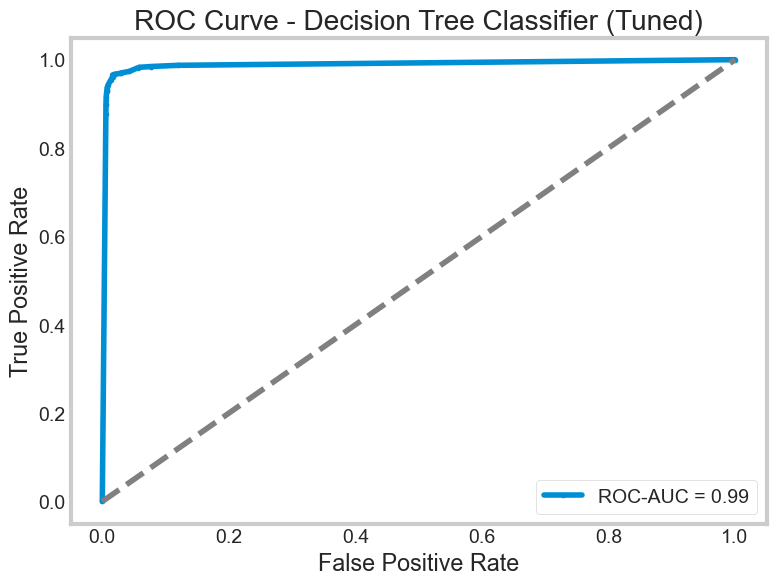

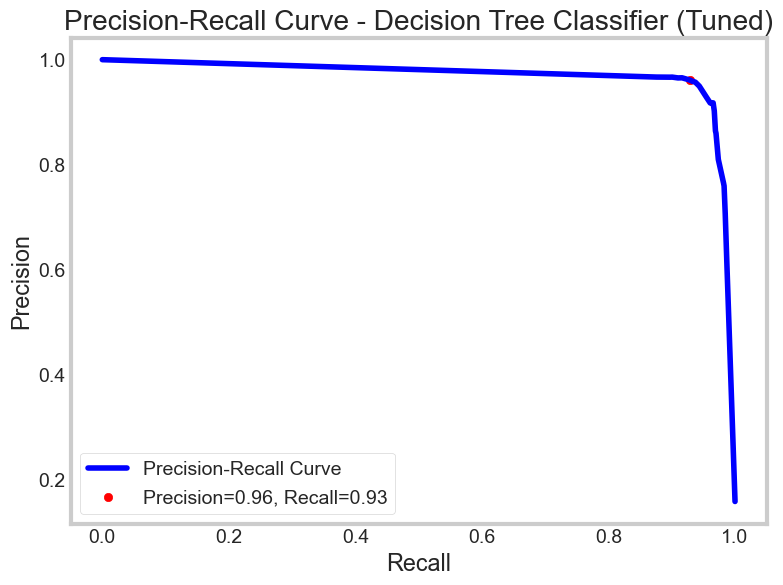

Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 15, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2}
Training Accuracy: 0.9913
Test Accuracy: 0.9828
Precision: 0.9613
Recall: 0.9281
F1 Score: 0.9444
ROC-AUC Score: 0.9886
Depth of Best Tree: 15
Training Time: 14.00 seconds

Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,KNN,0.991991,0.981601,0.954120,0.928051,0.940905,0.081555,0.994072,-
1,Logistic Regression,0.851211,0.855397,0.732323,0.132058,0.223765,0.130121,0.742225,-
2,Decision Tree,1.000000,0.992669,0.968666,0.985428,0.976975,0.237636,0.989727,-
3,SVM,0.953977,0.937186,0.970128,0.621129,0.757357,67.384571,0.973716,-
4,Random Forest,1.000000,0.997988,0.999079,0.988160,0.993590,2.259161,0.999933,-
5,AdaBoost,0.863163,0.863734,0.680288,0.257741,0.373844,2.844512,0.830764,-
6,KNN Fine Tuned,1.000000,0.997556,0.992707,0.991803,0.992255,38.572633,0.998640,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
7,KNN Fine Tuned - SelectKBest,1.000000,0.996406,0.992654,0.984517,0.988569,31.833620,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
8,KNN Fine Tuned - SelectKBest - Best Threshold,1.000000,0.996550,0.992661,0.985428,0.989031,36.773519,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.851211,0.854679,0.716418,0.131148,0.221709,28.110595,0.742265,"{'classifier__C': 10, 'classifier__penalty': '..."


In [303]:
# Define pipeline with preprocessing and Decision Tree
pipeline_dt = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', DecisionTreeClassifier(random_state=42))
])

# Define hyperparameter grid for tuning
param_grid = {
    "classifier__max_depth": [5, 10, 15],
    "classifier__min_samples_split": [2, 5, 10],
    "classifier__min_samples_leaf": [1, 2, 5],
    "classifier__criterion": ["gini", "entropy"]
}

# Perform Grid Search with cross-validation
start_time = time.time()
grid_search = GridSearchCV(pipeline_dt, param_grid, cv=5, scoring="f1", n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)
fit_time = time.time() - start_time

# Best estimator and parameters
best_pipeline = grid_search.best_estimator_
best_params = grid_search.best_params_

# Evaluate the best model
y_pred_best = best_pipeline.predict(X_test)
y_pred_proba_best = best_pipeline.predict_proba(X_test)[:, 1]
train_acc = best_pipeline.score(X_train, y_train)
test_acc = best_pipeline.score(X_test, y_test)
precision = precision_score(y_test, y_pred_best, zero_division=0)
recall = recall_score(y_test, y_pred_best, zero_division=0)
f1 = f1_score(y_test, y_pred_best, zero_division=0)
roc_auc_best = roc_auc_score(y_test, y_pred_proba_best)
depth_best = best_pipeline.named_steps['classifier'].get_depth()

# Classification report
print("\nClassification Report (Decision Tree - Tuned):\n")
print(classification_report(y_test, y_pred_best))

# Confusion matrix
cm_best = confusion_matrix(y_test, y_pred_best)
disp_best = ConfusionMatrixDisplay(confusion_matrix=cm_best, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp_best.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("Decision Tree - Confusion Matrix (Tuned)")
plt.show()

# ROC Curve
fpr_best, tpr_best, _ = roc_curve(y_test, y_pred_proba_best)
plt.figure(figsize=(8, 6))
plt.plot(fpr_best, tpr_best, marker='.', label=f"ROC-AUC = {roc_auc_best:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Decision Tree Classifier (Tuned)")
plt.legend()
plt.grid()
plt.show()

# Precision-Recall Curve
precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_pred_proba_best)
plt.figure(figsize=(8, 6))
plt.plot(recall_vals, precision_vals, label="Precision-Recall Curve", color="blue")
plt.scatter(recall, precision, color="red", label=f'Precision={precision:.2f}, Recall={recall:.2f}')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve - Decision Tree Classifier (Tuned)")
plt.legend()
plt.grid()
plt.show()

# Final output
print(f"Best Hyperparameters: {best_params}")
print(f"Training Accuracy: {train_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC-AUC Score: {roc_auc_best:.4f}")
print(f"Depth of Best Tree: {depth_best}")
print(f"Training Time: {fit_time:.2f} seconds")

# Create or update results DataFrame with all scores
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'Decision Tree Fine Tuned',
    train_acc,
    test_acc,
    precision,
    recall,
    f1,
    fit_time,
    roc_auc_best,
    best_params
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

#### Feature importance


 Top 10 Most Important Features:

                   Feature  Importance
1           num__DailyRate    0.129136
0                 num__Age    0.096623
4       num__ApplicationID    0.065593
6          num__HourlyRate    0.063325
2    num__DistanceFromHome    0.057608
20     num__YearsAtCompany    0.051334
11        num__MonthlyRate    0.049211
10      num__MonthlyIncome    0.048814
3           num__Education    0.037289
13  num__PercentSalaryHike    0.036368


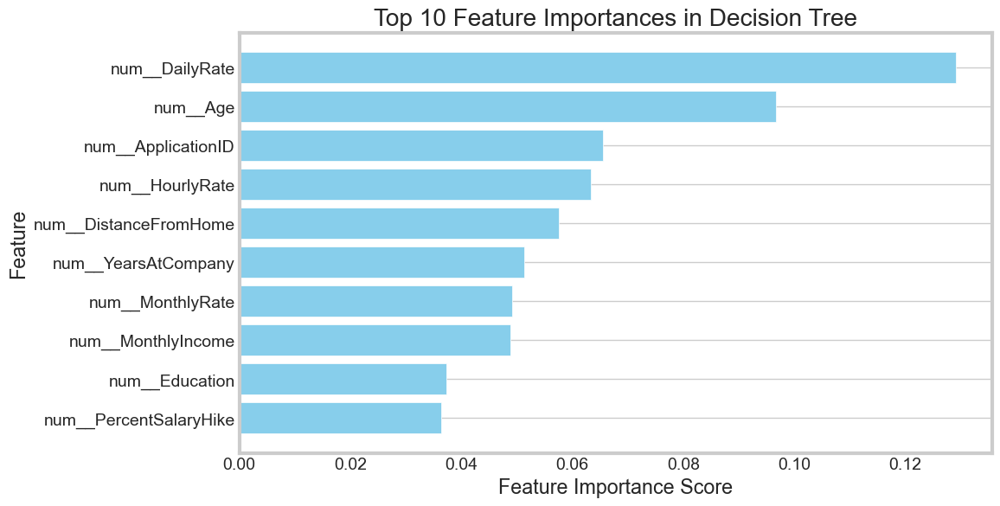

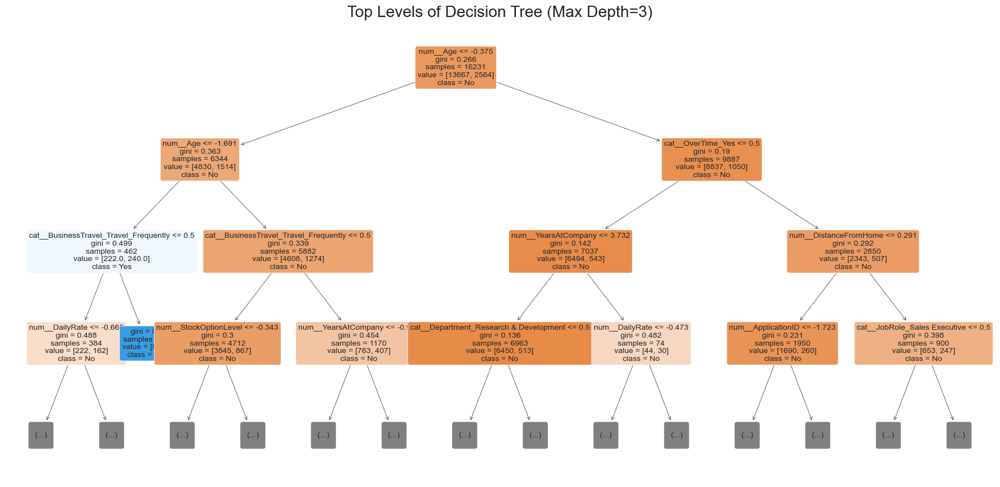

In [305]:
# Extract feature importance
dt_model = best_pipeline.named_steps['classifier']
feature_names = best_pipeline.named_steps['preprocessor'].get_feature_names_out()

importances = dt_model.feature_importances_
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Display top 10 most important features
print("\n Top 10 Most Important Features:\n")
print(importance_df.head(10))

# Plot top 10 feature importances
plt.figure(figsize=(10, 6))
plt.barh(importance_df.head(10)['Feature'], importance_df.head(10)['Importance'], color='skyblue')
plt.xlabel('Feature Importance Score')
plt.ylabel('Feature')
plt.title('Top 10 Feature Importances in Decision Tree')
plt.gca().invert_yaxis()
plt.grid(axis='x')
plt.show()

# Visualize the top levels of the decision tree
plt.figure(figsize=(20, 10))
plot_tree(
    dt_model,
    feature_names=feature_names,
    class_names=["No", "Yes"],
    filled=True,
    rounded=True,
    fontsize=10,
    max_depth=3  # Limit depth for clearer visualization
)
plt.title("Top Levels of Decision Tree (Max Depth=3)")
plt.show()

### Decision Tree - Hyperparameter tuning and SelectKBest

Fitting 5 folds for each of 162 candidates, totalling 810 fits

Classification Report (Decision Tree - Tuned):

              precision    recall  f1-score   support

           0       0.98      0.99      0.99      5859
           1       0.97      0.90      0.93      1098

    accuracy                           0.98      6957
   macro avg       0.97      0.95      0.96      6957
weighted avg       0.98      0.98      0.98      6957



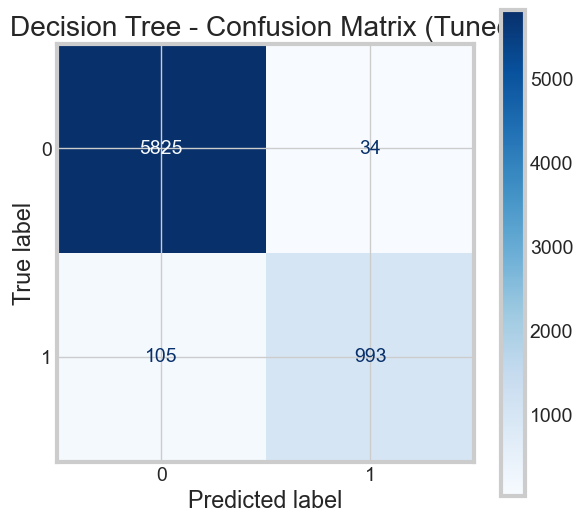

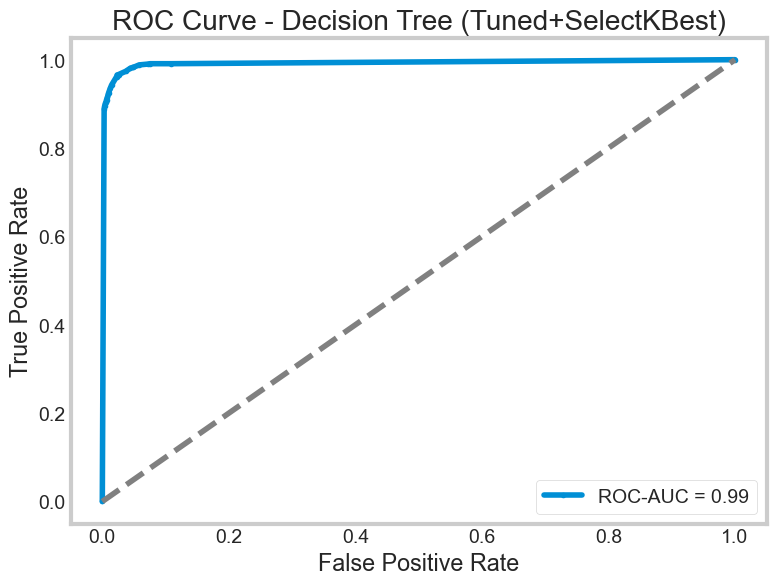

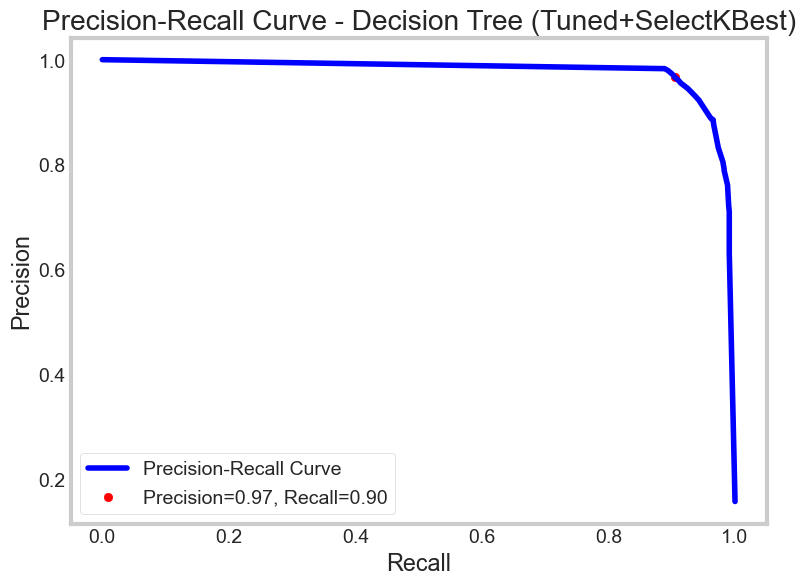

Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 15, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'feature_selection__k': 15}
Training Accuracy: 0.9888
Test Accuracy: 0.9800
Precision: 0.9669
Recall: 0.9044
F1 Score: 0.9346
ROC-AUC Score: 0.9917
Depth of Best Tree: 15
Training Time: 21.20 seconds

Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,KNN,0.991991,0.981601,0.954120,0.928051,0.940905,0.081555,0.994072,-
1,Logistic Regression,0.851211,0.855397,0.732323,0.132058,0.223765,0.130121,0.742225,-
2,Decision Tree,1.000000,0.992669,0.968666,0.985428,0.976975,0.237636,0.989727,-
3,SVM,0.953977,0.937186,0.970128,0.621129,0.757357,67.384571,0.973716,-
4,Random Forest,1.000000,0.997988,0.999079,0.988160,0.993590,2.259161,0.999933,-
5,AdaBoost,0.863163,0.863734,0.680288,0.257741,0.373844,2.844512,0.830764,-
6,KNN Fine Tuned,1.000000,0.997556,0.992707,0.991803,0.992255,38.572633,0.998640,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
7,KNN Fine Tuned - SelectKBest,1.000000,0.996406,0.992654,0.984517,0.988569,31.833620,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
8,KNN Fine Tuned - SelectKBest - Best Threshold,1.000000,0.996550,0.992661,0.985428,0.989031,36.773519,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.851211,0.854679,0.716418,0.131148,0.221709,28.110595,0.742265,"{'classifier__C': 10, 'classifier__penalty': '..."


In [307]:
# Define pipeline with preprocessing and Decision Tree
pipeline_dt = Pipeline([
    ('preprocessor', preprocessor),
    ('feature_selection', SelectKBest(score_func=f_classif)),
    ('classifier', DecisionTreeClassifier(random_state=42))
])

# Define hyperparameter grid for tuning
param_grid = {
    "feature_selection__k": [5, 10, 15],
    "classifier__max_depth": [5, 10, 15],
    "classifier__min_samples_split": [2, 5, 10],
    "classifier__min_samples_leaf": [1, 2, 5],
    "classifier__criterion": ["gini", "entropy"]
}

# Perform Grid Search with cross-validation
start_time = time.time()
grid_search = GridSearchCV(pipeline_dt, param_grid, cv=5, scoring="f1", n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)
fit_time = time.time() - start_time

# Best estimator and parameters
best_pipeline = grid_search.best_estimator_
best_params = grid_search.best_params_

# Evaluate the best model
y_pred_best = best_pipeline.predict(X_test)
y_pred_proba_best = best_pipeline.predict_proba(X_test)[:, 1]
train_acc = best_pipeline.score(X_train, y_train)
test_acc = best_pipeline.score(X_test, y_test)
precision = precision_score(y_test, y_pred_best, zero_division=0)
recall = recall_score(y_test, y_pred_best, zero_division=0)
f1 = f1_score(y_test, y_pred_best, zero_division=0)
roc_auc_best = roc_auc_score(y_test, y_pred_proba_best)
depth_best = best_pipeline.named_steps['classifier'].get_depth()

# Classification report
print("\nClassification Report (Decision Tree - Tuned):\n")
print(classification_report(y_test, y_pred_best))

# Confusion matrix
cm_best = confusion_matrix(y_test, y_pred_best)
disp_best = ConfusionMatrixDisplay(confusion_matrix=cm_best, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp_best.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("Decision Tree - Confusion Matrix (Tuned)")
plt.show()

# ROC Curve
fpr_best, tpr_best, _ = roc_curve(y_test, y_pred_proba_best)
plt.figure(figsize=(8, 6))
plt.plot(fpr_best, tpr_best, marker='.', label=f"ROC-AUC = {roc_auc_best:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Decision Tree (Tuned+SelectKBest)")
plt.legend()
plt.grid()
plt.show()

# Precision-Recall Curve
precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_pred_proba_best)
plt.figure(figsize=(8, 6))
plt.plot(recall_vals, precision_vals, label="Precision-Recall Curve", color="blue")
plt.scatter(recall, precision, color="red", label=f'Precision={precision:.2f}, Recall={recall:.2f}')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve - Decision Tree (Tuned+SelectKBest)")
plt.legend()
plt.grid()
plt.show()

# Final output
print(f"Best Hyperparameters: {best_params}")
print(f"Training Accuracy: {train_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC-AUC Score: {roc_auc_best:.4f}")
print(f"Depth of Best Tree: {depth_best}")
print(f"Training Time: {fit_time:.2f} seconds")

# Create or update results DataFrame with all scores
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'Decision Tree Fine Tuned - SelectKBest',
    train_acc,
    test_acc,
    precision,
    recall,
    f1,
    fit_time,
    roc_auc_best,
    best_params
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

### Feature Importance

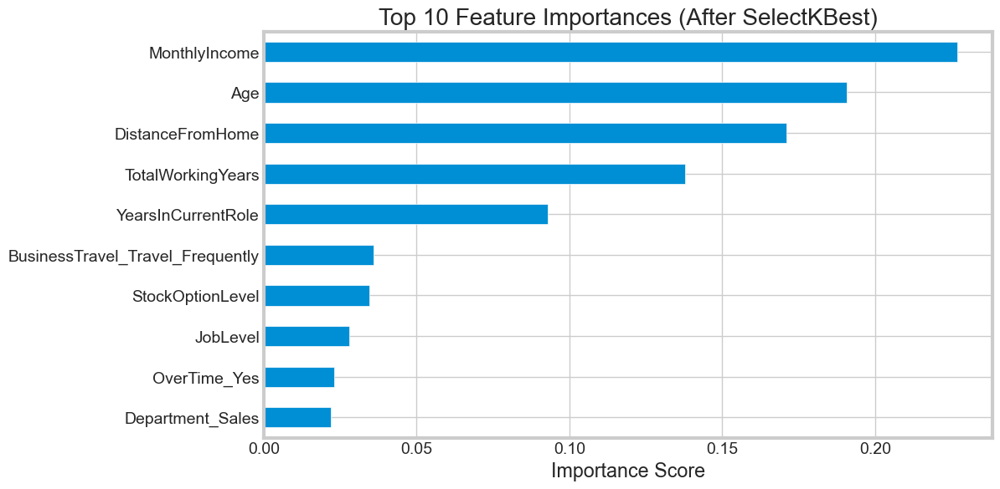

In [309]:
# Retrieve feature names after preprocessing
feature_names = numerical_cols + list(
    best_pipeline.named_steps['preprocessor']
    .transformers_[1][1].named_steps['encoder']
    .get_feature_names_out(categorical_cols)
)

# Get the mask of selected features from SelectKBest
selected_mask = best_pipeline.named_steps['feature_selection'].get_support()

# Filter feature names based on selected features
selected_feature_names = np.array(feature_names)[selected_mask]

# Retrieve feature importances
importances = best_pipeline.named_steps['classifier'].feature_importances_

# Create a DataFrame/Series for visualization
feat_importances = pd.Series(importances, index=selected_feature_names).sort_values(ascending=False)

# Plot top 10 feature importances
plt.figure(figsize=(10, 6))
feat_importances.head(10).plot(kind='barh')
plt.title("Top 10 Feature Importances (After SelectKBest)")
plt.xlabel("Importance Score")
plt.gca().invert_yaxis()
plt.show()

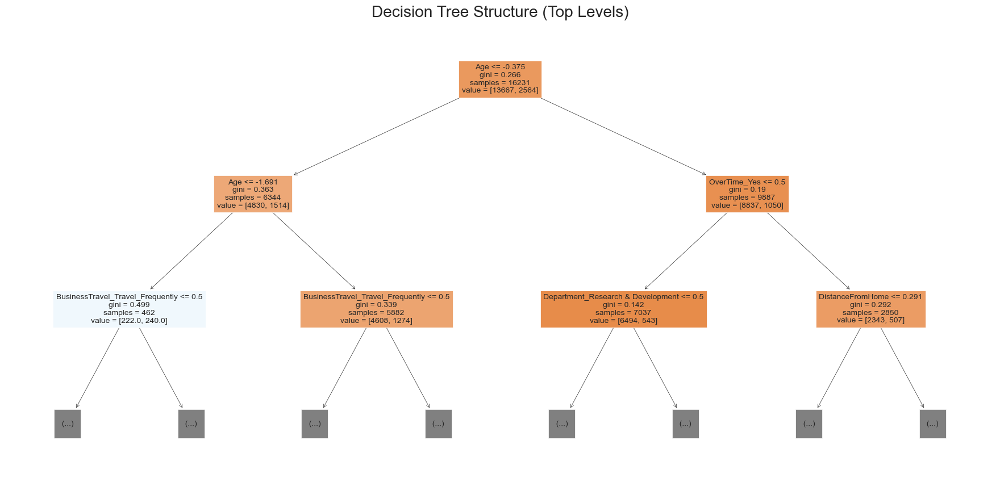

In [310]:
# Plot the tree structure
plt.figure(figsize=(20, 10))
plot_tree(best_pipeline.named_steps['classifier'], filled=True, feature_names=selected_feature_names, max_depth=2, fontsize=10)
plt.title("Decision Tree Structure (Top Levels)")
plt.show()


### Decision Tree - Class_weight=balanced

Fitting 5 folds for each of 162 candidates, totalling 810 fits

Classification Report (Decision Tree - Tuned):

              precision    recall  f1-score   support

           0       0.99      0.97      0.98      5859
           1       0.85      0.97      0.91      1098

    accuracy                           0.97      6957
   macro avg       0.92      0.97      0.94      6957
weighted avg       0.97      0.97      0.97      6957



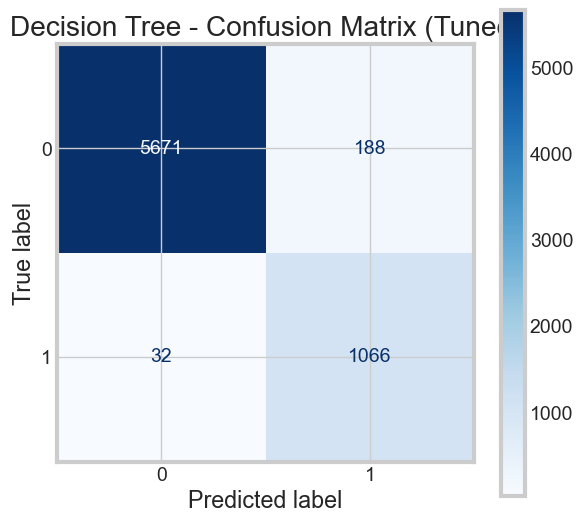

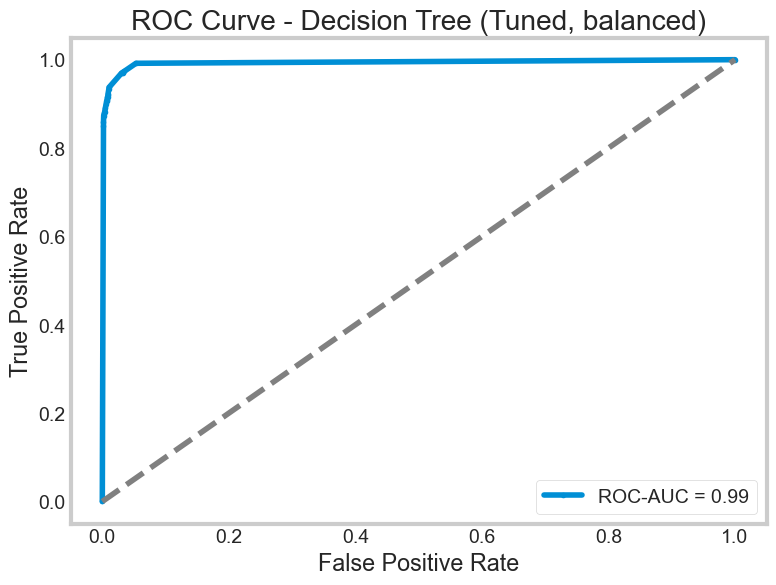

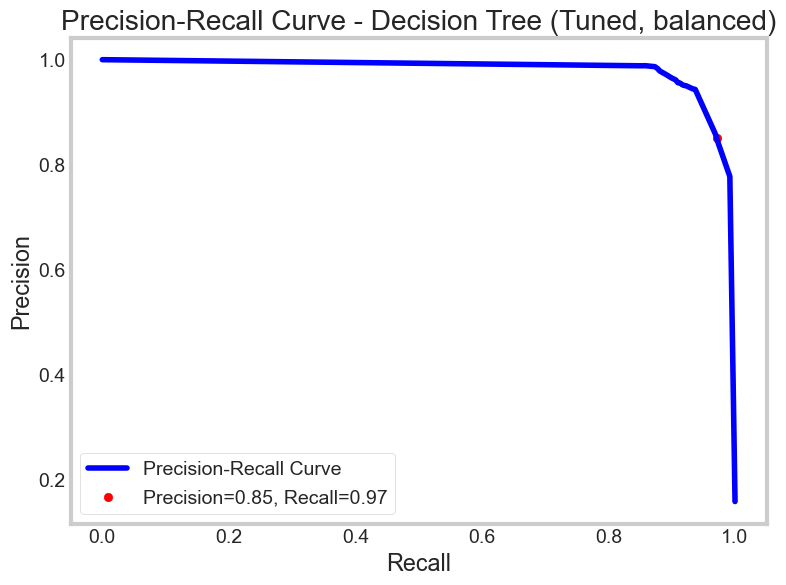

Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 15, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'feature_selection__k': 15}
Training Accuracy: 0.9715
Test Accuracy: 0.9684
Precision: 0.8501
Recall: 0.9709
F1 Score: 0.9065
ROC-AUC Score: 0.9928
Depth of Best Tree: 15
Training Time: 25.09 seconds

Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,KNN,0.991991,0.981601,0.954120,0.928051,0.940905,0.081555,0.994072,-
1,Logistic Regression,0.851211,0.855397,0.732323,0.132058,0.223765,0.130121,0.742225,-
2,Decision Tree,1.000000,0.992669,0.968666,0.985428,0.976975,0.237636,0.989727,-
3,SVM,0.953977,0.937186,0.970128,0.621129,0.757357,67.384571,0.973716,-
4,Random Forest,1.000000,0.997988,0.999079,0.988160,0.993590,2.259161,0.999933,-
5,AdaBoost,0.863163,0.863734,0.680288,0.257741,0.373844,2.844512,0.830764,-
6,KNN Fine Tuned,1.000000,0.997556,0.992707,0.991803,0.992255,38.572633,0.998640,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
7,KNN Fine Tuned - SelectKBest,1.000000,0.996406,0.992654,0.984517,0.988569,31.833620,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
8,KNN Fine Tuned - SelectKBest - Best Threshold,1.000000,0.996550,0.992661,0.985428,0.989031,36.773519,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.851211,0.854679,0.716418,0.131148,0.221709,28.110595,0.742265,"{'classifier__C': 10, 'classifier__penalty': '..."


In [312]:
# Define pipeline with preprocessing and Decision Tree
pipeline_dt = Pipeline([
    ('preprocessor', preprocessor),
    ('feature_selection', SelectKBest(score_func=f_classif)),
    ('classifier', DecisionTreeClassifier(class_weight='balanced', random_state=42))
])

# Define hyperparameter grid for tuning
param_grid = {
    "feature_selection__k": [5, 10, 15],
    "classifier__max_depth": [5, 10, 15],
    "classifier__min_samples_split": [2, 5, 10],
    "classifier__min_samples_leaf": [1, 2, 5],
    "classifier__criterion": ["gini", "entropy"]
}

# Perform Grid Search with cross-validation
start_time = time.time()
grid_search = GridSearchCV(pipeline_dt, param_grid, cv=5, scoring="f1", n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)
fit_time = time.time() - start_time

# Best estimator and parameters
best_pipeline = grid_search.best_estimator_
best_params = grid_search.best_params_

# Evaluate the best model
y_pred_best = best_pipeline.predict(X_test)
y_pred_proba_best = best_pipeline.predict_proba(X_test)[:, 1]
train_acc = best_pipeline.score(X_train, y_train)
test_acc = best_pipeline.score(X_test, y_test)
precision = precision_score(y_test, y_pred_best, zero_division=0)
recall = recall_score(y_test, y_pred_best, zero_division=0)
f1 = f1_score(y_test, y_pred_best, zero_division=0)
roc_auc_best = roc_auc_score(y_test, y_pred_proba_best)
depth_best = best_pipeline.named_steps['classifier'].get_depth()

# Classification report
print("\nClassification Report (Decision Tree - Tuned):\n")
print(classification_report(y_test, y_pred_best))

# Confusion matrix
cm_best = confusion_matrix(y_test, y_pred_best)
disp_best = ConfusionMatrixDisplay(confusion_matrix=cm_best, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp_best.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("Decision Tree - Confusion Matrix (Tuned)")
plt.show()

# ROC Curve
fpr_best, tpr_best, _ = roc_curve(y_test, y_pred_proba_best)
plt.figure(figsize=(8, 6))
plt.plot(fpr_best, tpr_best, marker='.', label=f"ROC-AUC = {roc_auc_best:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Decision Tree (Tuned, balanced)")
plt.legend()
plt.grid()
plt.show()

# Precision-Recall Curve
precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_pred_proba_best)
plt.figure(figsize=(8, 6))
plt.plot(recall_vals, precision_vals, label="Precision-Recall Curve", color="blue")
plt.scatter(recall, precision, color="red", label=f'Precision={precision:.2f}, Recall={recall:.2f}')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve - Decision Tree (Tuned, balanced)")
plt.legend()
plt.grid()
plt.show()

# Final output
print(f"Best Hyperparameters: {best_params}")
print(f"Training Accuracy: {train_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC-AUC Score: {roc_auc_best:.4f}")
print(f"Depth of Best Tree: {depth_best}")
print(f"Training Time: {fit_time:.2f} seconds")

# Create or update results DataFrame with all scores
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'Decision Tree Fine Tuned - SelectKBest,class_weight="balanced"',
    train_acc,
    test_acc,
    precision,
    recall,
    f1,
    fit_time,
    roc_auc_best,
    best_params
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

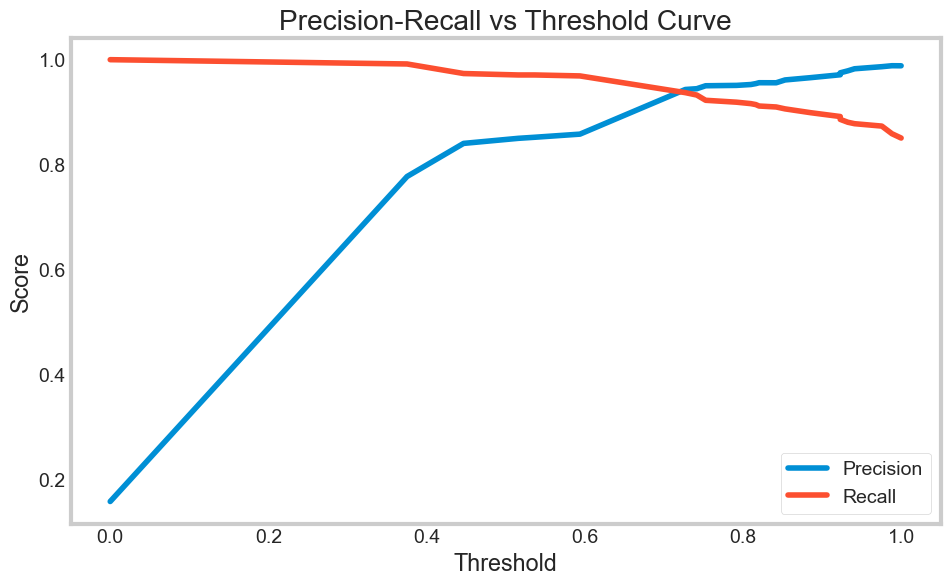

In [313]:
from sklearn.metrics import precision_recall_curve

# Threshold tuning for better balance
y_scores = best_pipeline.predict_proba(X_test)[:, 1]
precisions, recalls, thresholds = precision_recall_curve(y_test, y_scores)

plt.figure(figsize=(10, 6))
plt.plot(thresholds, precisions[:-1], label="Precision")
plt.plot(thresholds, recalls[:-1], label="Recall")
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("Precision-Recall vs Threshold Curve")
plt.legend()
plt.grid()
plt.show()

### SVM - Hyperparamter tuning

Fitting 5 folds for each of 4 candidates, totalling 20 fits

Classification Report (SVM - Tuned):

              precision    recall  f1-score   support

           0       0.93      1.00      0.96      5859
           1       0.97      0.62      0.76      1098

    accuracy                           0.94      6957
   macro avg       0.95      0.81      0.86      6957
weighted avg       0.94      0.94      0.93      6957



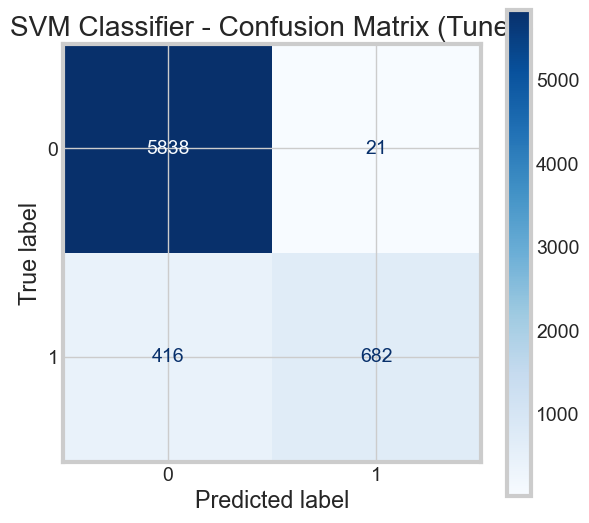

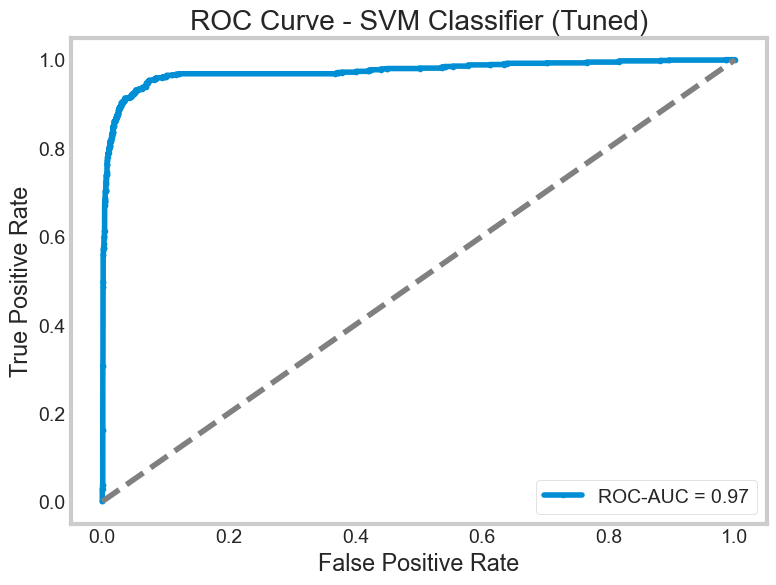

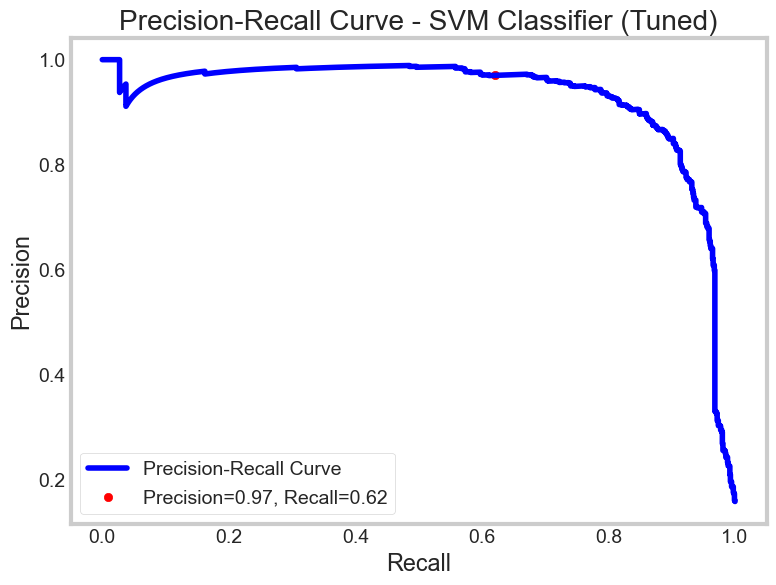

Best Hyperparameters: {'classifier__C': 1, 'classifier__gamma': 'scale', 'classifier__kernel': 'rbf'}
Training Accuracy: 0.9540
Test Accuracy: 0.9372
Precision: 0.9701
Recall: 0.6211
F1 Score: 0.7574
ROC-AUC Score: 0.9737
Training Time: 465.43 seconds

Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,KNN,0.991991,0.981601,0.954120,0.928051,0.940905,0.081555,0.994072,-
1,Logistic Regression,0.851211,0.855397,0.732323,0.132058,0.223765,0.130121,0.742225,-
2,Decision Tree,1.000000,0.992669,0.968666,0.985428,0.976975,0.237636,0.989727,-
3,SVM,0.953977,0.937186,0.970128,0.621129,0.757357,67.384571,0.973716,-
4,Random Forest,1.000000,0.997988,0.999079,0.988160,0.993590,2.259161,0.999933,-
5,AdaBoost,0.863163,0.863734,0.680288,0.257741,0.373844,2.844512,0.830764,-
6,KNN Fine Tuned,1.000000,0.997556,0.992707,0.991803,0.992255,38.572633,0.998640,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
7,KNN Fine Tuned - SelectKBest,1.000000,0.996406,0.992654,0.984517,0.988569,31.833620,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
8,KNN Fine Tuned - SelectKBest - Best Threshold,1.000000,0.996550,0.992661,0.985428,0.989031,36.773519,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.851211,0.854679,0.716418,0.131148,0.221709,28.110595,0.742265,"{'classifier__C': 10, 'classifier__penalty': '..."


In [315]:
# Define SVM pipeline
pipeline_svm = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', SVC(probability=True, random_state=42))
])

# Define hyperparameter grid for tuning
param_grid = {
    "classifier__C": [0.1, 1],
    "classifier__kernel": ["linear", "rbf"],
    "classifier__gamma": ["scale"]
}

# Perform Grid Search with cross-validation
start_time = time.time()
grid_search_svm = GridSearchCV(pipeline_svm, param_grid, cv=5, scoring="f1", n_jobs=-1, verbose=1)
grid_search_svm.fit(X_train, y_train)
fit_time = time.time() - start_time

# Best estimator and parameters
best_pipeline_svm = grid_search_svm.best_estimator_
best_params_svm = grid_search_svm.best_params_

# Evaluate the best SVM model
y_pred_best_svm = best_pipeline_svm.predict(X_test)
y_pred_proba_best_svm = best_pipeline_svm.predict_proba(X_test)[:, 1]

# Compute performance metrics
train_acc_svm = best_pipeline_svm.score(X_train, y_train)
test_acc_svm = best_pipeline_svm.score(X_test, y_test)
precision_svm = precision_score(y_test, y_pred_best_svm, zero_division=0)
recall_svm = recall_score(y_test, y_pred_best_svm, zero_division=0)
f1_svm = f1_score(y_test, y_pred_best_svm, zero_division=0)
roc_auc_best_svm = roc_auc_score(y_test, y_pred_proba_best_svm)

# Classification report
print("\nClassification Report (SVM - Tuned):\n")
print(classification_report(y_test, y_pred_best_svm))

# Confusion matrix
cm_best_svm = confusion_matrix(y_test, y_pred_best_svm)
disp_best_svm = ConfusionMatrixDisplay(confusion_matrix=cm_best_svm, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp_best_svm.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("SVM Classifier - Confusion Matrix (Tuned)")
plt.show()

# ROC Curve
fpr_best_svm, tpr_best_svm, _ = roc_curve(y_test, y_pred_proba_best_svm)
plt.figure(figsize=(8, 6))
plt.plot(fpr_best_svm, tpr_best_svm, marker='.', label=f"ROC-AUC = {roc_auc_best_svm:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - SVM Classifier (Tuned)")
plt.legend()
plt.grid()
plt.show()

# Precision-Recall Curve
precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_pred_proba_best_svm)
plt.figure(figsize=(8, 6))
plt.plot(recall_vals, precision_vals, label="Precision-Recall Curve", color="blue")
plt.scatter(recall_svm, precision_svm, color="red",
            label=f'Precision={precision_svm:.2f}, Recall={recall_svm:.2f}')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve - SVM Classifier (Tuned)")
plt.legend()
plt.grid()
plt.show()

# Final output
print(f"Best Hyperparameters: {best_params_svm}")
print(f"Training Accuracy: {train_acc_svm:.4f}")
print(f"Test Accuracy: {test_acc_svm:.4f}")
print(f"Precision: {precision_svm:.4f}")
print(f"Recall: {recall_svm:.4f}")
print(f"F1 Score: {f1_svm:.4f}")
print(f"ROC-AUC Score: {roc_auc_best_svm:.4f}")
print(f"Training Time: {fit_time:.2f} seconds")

# Create or update results DataFrame with all scores
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'SVM Fine Tuned',
    train_acc_svm,
    test_acc_svm,
    precision_svm,
    recall_svm,
    f1_svm,
    fit_time,
    roc_auc_best_svm,
    best_params_svm
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

### SVM - Hyperparamter tuning and SelectKBest

Fitting 5 folds for each of 4 candidates, totalling 20 fits

Classification Report (SVM - Tuned):

              precision    recall  f1-score   support

           0       0.86      1.00      0.92      5859
           1       0.87      0.10      0.18      1098

    accuracy                           0.86      6957
   macro avg       0.86      0.55      0.55      6957
weighted avg       0.86      0.86      0.80      6957



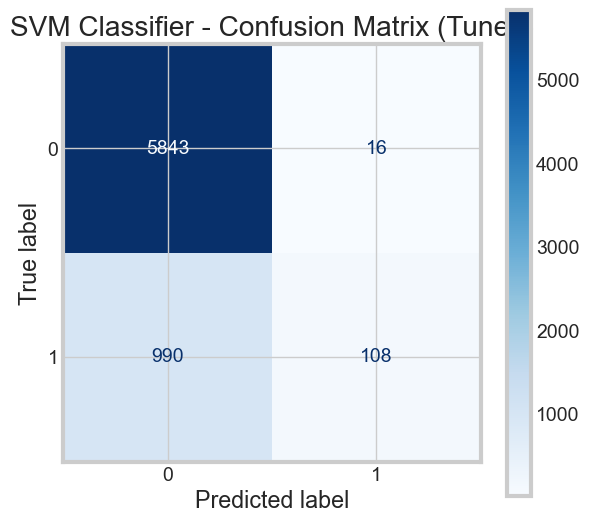

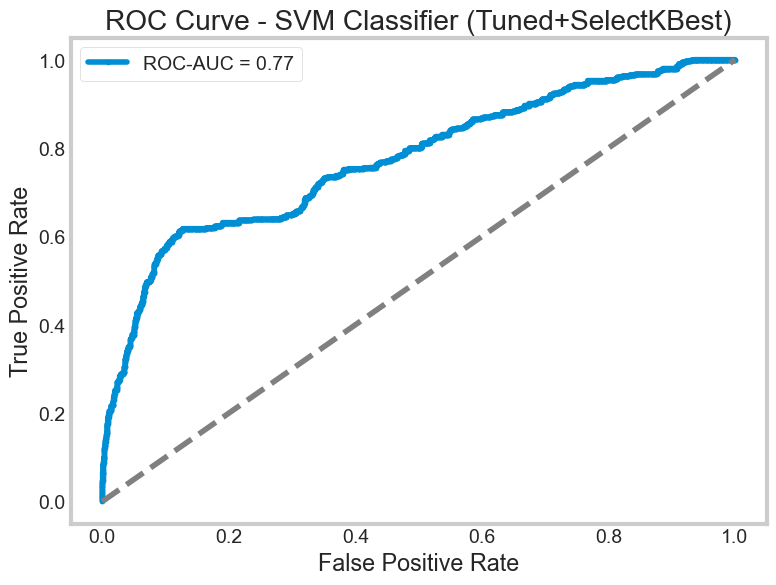

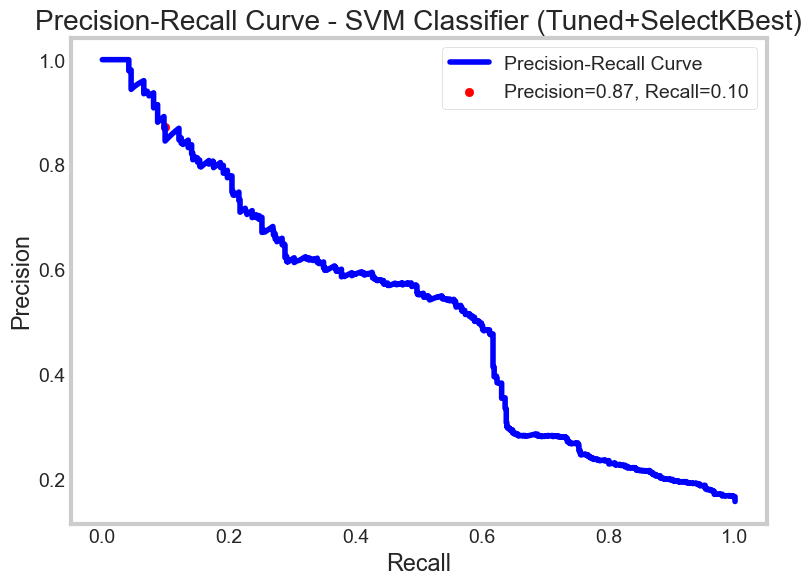

Best Hyperparameters: {'classifier__C': 1, 'classifier__gamma': 'scale', 'classifier__kernel': 'rbf'}
Training Accuracy: 0.8553
Test Accuracy: 0.8554
Precision: 0.8710
Recall: 0.0984
F1 Score: 0.1768
ROC-AUC Score: 0.7743
Training Time: 247.57 seconds

Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,KNN,0.991991,0.981601,0.954120,0.928051,0.940905,0.081555,0.994072,-
1,Logistic Regression,0.851211,0.855397,0.732323,0.132058,0.223765,0.130121,0.742225,-
2,Decision Tree,1.000000,0.992669,0.968666,0.985428,0.976975,0.237636,0.989727,-
3,SVM,0.953977,0.937186,0.970128,0.621129,0.757357,67.384571,0.973716,-
4,Random Forest,1.000000,0.997988,0.999079,0.988160,0.993590,2.259161,0.999933,-
5,AdaBoost,0.863163,0.863734,0.680288,0.257741,0.373844,2.844512,0.830764,-
6,KNN Fine Tuned,1.000000,0.997556,0.992707,0.991803,0.992255,38.572633,0.998640,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
7,KNN Fine Tuned - SelectKBest,1.000000,0.996406,0.992654,0.984517,0.988569,31.833620,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
8,KNN Fine Tuned - SelectKBest - Best Threshold,1.000000,0.996550,0.992661,0.985428,0.989031,36.773519,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.851211,0.854679,0.716418,0.131148,0.221709,28.110595,0.742265,"{'classifier__C': 10, 'classifier__penalty': '..."


In [317]:
# Define SVM pipeline
pipeline_svm = Pipeline([
    ('preprocessor', preprocessor),
    ('feature_selection', SelectKBest(score_func=f_classif, k=10)),
    ('classifier', SVC(probability=True, random_state=42))
])

# Define hyperparameter grid for tuning
param_grid = {
    "classifier__C": [0.1, 1],
    "classifier__kernel": ["linear", "rbf"],
    "classifier__gamma": ["scale"]
}

# Perform Grid Search with cross-validation
start_time = time.time()
grid_search_svm = GridSearchCV(pipeline_svm, param_grid, cv=5, scoring="f1", n_jobs=-1, verbose=1)
grid_search_svm.fit(X_train, y_train)
fit_time = time.time() - start_time

# Best estimator and parameters
best_pipeline_svm = grid_search_svm.best_estimator_
best_params_svm = grid_search_svm.best_params_

# Evaluate the best SVM model
y_pred_best_svm = best_pipeline_svm.predict(X_test)
y_pred_proba_best_svm = best_pipeline_svm.predict_proba(X_test)[:, 1]

# Compute performance metrics
train_acc_svm = best_pipeline_svm.score(X_train, y_train)
test_acc_svm = best_pipeline_svm.score(X_test, y_test)
precision_svm = precision_score(y_test, y_pred_best_svm, zero_division=0)
recall_svm = recall_score(y_test, y_pred_best_svm, zero_division=0)
f1_svm = f1_score(y_test, y_pred_best_svm, zero_division=0)
roc_auc_best_svm = roc_auc_score(y_test, y_pred_proba_best_svm)

# Classification report
print("\nClassification Report (SVM - Tuned):\n")
print(classification_report(y_test, y_pred_best_svm))

# Confusion matrix
cm_best_svm = confusion_matrix(y_test, y_pred_best_svm)
disp_best_svm = ConfusionMatrixDisplay(confusion_matrix=cm_best_svm, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp_best_svm.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("SVM Classifier - Confusion Matrix (Tuned)")
plt.show()

# ROC Curve
fpr_best_svm, tpr_best_svm, _ = roc_curve(y_test, y_pred_proba_best_svm)
plt.figure(figsize=(8, 6))
plt.plot(fpr_best_svm, tpr_best_svm, marker='.', label=f"ROC-AUC = {roc_auc_best_svm:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - SVM Classifier (Tuned+SelectKBest)")
plt.legend()
plt.grid()
plt.show()

# Precision-Recall Curve
precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_pred_proba_best_svm)
plt.figure(figsize=(8, 6))
plt.plot(recall_vals, precision_vals, label="Precision-Recall Curve", color="blue")
plt.scatter(recall_svm, precision_svm, color="red",
            label=f'Precision={precision_svm:.2f}, Recall={recall_svm:.2f}')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve - SVM Classifier (Tuned+SelectKBest)")
plt.legend()
plt.grid()
plt.show()

# Final output
print(f"Best Hyperparameters: {best_params_svm}")
print(f"Training Accuracy: {train_acc_svm:.4f}")
print(f"Test Accuracy: {test_acc_svm:.4f}")
print(f"Precision: {precision_svm:.4f}")
print(f"Recall: {recall_svm:.4f}")
print(f"F1 Score: {f1_svm:.4f}")
print(f"ROC-AUC Score: {roc_auc_best_svm:.4f}")
print(f"Training Time: {fit_time:.2f} seconds")

# Create or update results DataFrame with all scores
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'SVM Fine Tuned - SelectKBest',
    train_acc_svm,
    test_acc_svm,
    precision_svm,
    recall_svm,
    f1_svm,
    fit_time,
    roc_auc_best_svm,
    best_params_svm
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

### SVM - Hyperparamter tuning and SelectKBest, class_weight='balanced'

Fitting 5 folds for each of 4 candidates, totalling 20 fits

Classification Report (SVM - Tuned):

              precision    recall  f1-score   support

           0       0.93      0.78      0.85      5859
           1       0.38      0.71      0.49      1098

    accuracy                           0.77      6957
   macro avg       0.66      0.75      0.67      6957
weighted avg       0.85      0.77      0.80      6957



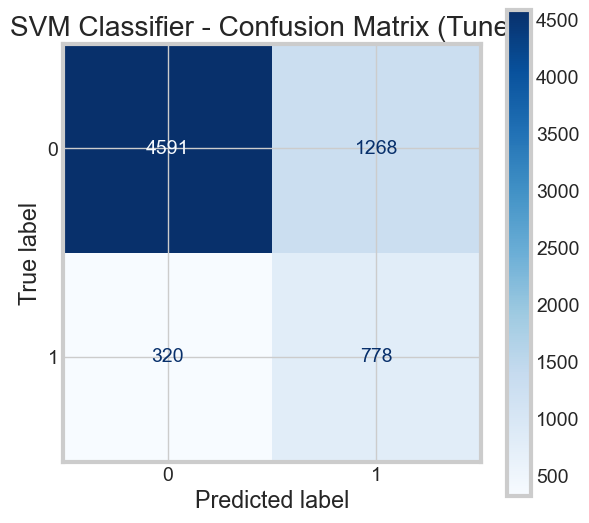

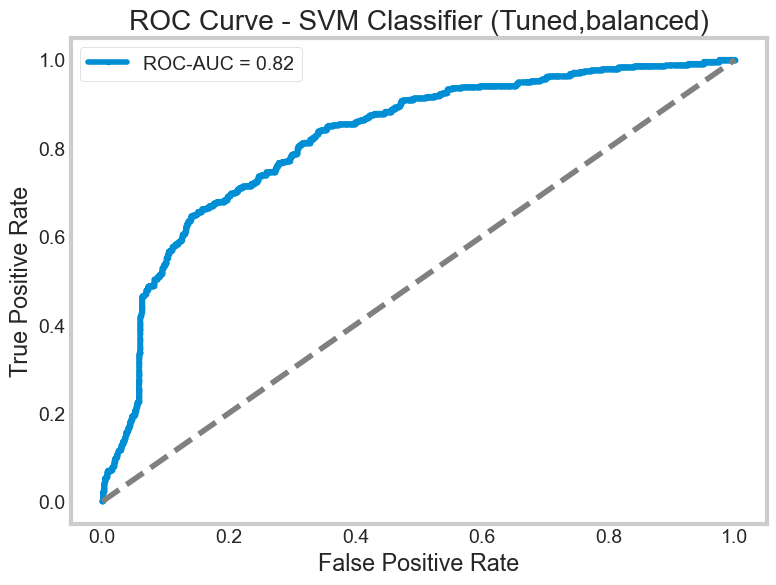

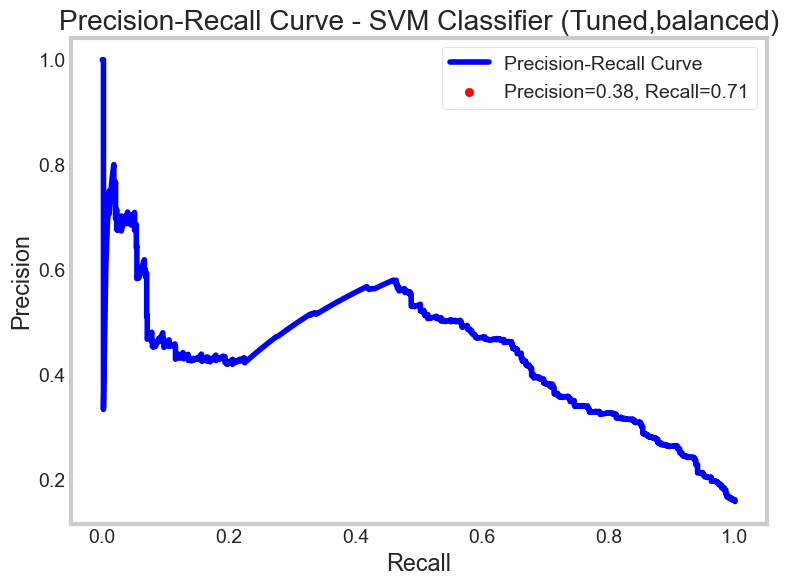

Best Hyperparameters: {'classifier__C': 1, 'classifier__gamma': 'scale', 'classifier__kernel': 'rbf'}
Training Accuracy: 0.7743
Test Accuracy: 0.7717
Precision: 0.3803
Recall: 0.7086
F1 Score: 0.4949
ROC-AUC Score: 0.8187
Training Time: 524.41 seconds

Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,KNN,0.991991,0.981601,0.954120,0.928051,0.940905,0.081555,0.994072,-
1,Logistic Regression,0.851211,0.855397,0.732323,0.132058,0.223765,0.130121,0.742225,-
2,Decision Tree,1.000000,0.992669,0.968666,0.985428,0.976975,0.237636,0.989727,-
3,SVM,0.953977,0.937186,0.970128,0.621129,0.757357,67.384571,0.973716,-
4,Random Forest,1.000000,0.997988,0.999079,0.988160,0.993590,2.259161,0.999933,-
5,AdaBoost,0.863163,0.863734,0.680288,0.257741,0.373844,2.844512,0.830764,-
6,KNN Fine Tuned,1.000000,0.997556,0.992707,0.991803,0.992255,38.572633,0.998640,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
7,KNN Fine Tuned - SelectKBest,1.000000,0.996406,0.992654,0.984517,0.988569,31.833620,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
8,KNN Fine Tuned - SelectKBest - Best Threshold,1.000000,0.996550,0.992661,0.985428,0.989031,36.773519,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.851211,0.854679,0.716418,0.131148,0.221709,28.110595,0.742265,"{'classifier__C': 10, 'classifier__penalty': '..."


In [319]:
# Define SVM pipeline
pipeline_svm = Pipeline([
    ('preprocessor', preprocessor),
    ('feature_selection', SelectKBest(score_func=f_classif, k=10)),
    ('classifier', SVC(probability=True, random_state=42,class_weight='balanced'))
])

# Define hyperparameter grid for tuning
param_grid = {
    "classifier__C": [0.1, 1],
    "classifier__kernel": ["linear", "rbf"],
    "classifier__gamma": ["scale"]
}

# Perform Grid Search with cross-validation
start_time = time.time()
grid_search_svm = GridSearchCV(pipeline_svm, param_grid, cv=5, scoring="f1", n_jobs=-1, verbose=1)
grid_search_svm.fit(X_train, y_train)
fit_time = time.time() - start_time

# Best estimator and parameters
best_pipeline_svm = grid_search_svm.best_estimator_
best_params_svm = grid_search_svm.best_params_

# Evaluate the best SVM model
y_pred_best_svm = best_pipeline_svm.predict(X_test)
y_pred_proba_best_svm = best_pipeline_svm.predict_proba(X_test)[:, 1]

# Compute performance metrics
train_acc_svm = best_pipeline_svm.score(X_train, y_train)
test_acc_svm = best_pipeline_svm.score(X_test, y_test)
precision_svm = precision_score(y_test, y_pred_best_svm, zero_division=0)
recall_svm = recall_score(y_test, y_pred_best_svm, zero_division=0)
f1_svm = f1_score(y_test, y_pred_best_svm, zero_division=0)
roc_auc_best_svm = roc_auc_score(y_test, y_pred_proba_best_svm)

# Classification report
print("\nClassification Report (SVM - Tuned):\n")
print(classification_report(y_test, y_pred_best_svm))

# Confusion matrix
cm_best_svm = confusion_matrix(y_test, y_pred_best_svm)
disp_best_svm = ConfusionMatrixDisplay(confusion_matrix=cm_best_svm, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp_best_svm.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("SVM Classifier - Confusion Matrix (Tuned)")
plt.show()

# ROC Curve
fpr_best_svm, tpr_best_svm, _ = roc_curve(y_test, y_pred_proba_best_svm)
plt.figure(figsize=(8, 6))
plt.plot(fpr_best_svm, tpr_best_svm, marker='.', label=f"ROC-AUC = {roc_auc_best_svm:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - SVM Classifier (Tuned,balanced)")
plt.legend()
plt.grid()
plt.show()

# Precision-Recall Curve
precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_pred_proba_best_svm)
plt.figure(figsize=(8, 6))
plt.plot(recall_vals, precision_vals, label="Precision-Recall Curve", color="blue")
plt.scatter(recall_svm, precision_svm, color="red",
            label=f'Precision={precision_svm:.2f}, Recall={recall_svm:.2f}')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve - SVM Classifier (Tuned,balanced)")
plt.legend()
plt.grid()
plt.show()

# Final output
print(f"Best Hyperparameters: {best_params_svm}")
print(f"Training Accuracy: {train_acc_svm:.4f}")
print(f"Test Accuracy: {test_acc_svm:.4f}")
print(f"Precision: {precision_svm:.4f}")
print(f"Recall: {recall_svm:.4f}")
print(f"F1 Score: {f1_svm:.4f}")
print(f"ROC-AUC Score: {roc_auc_best_svm:.4f}")
print(f"Training Time: {fit_time:.2f} seconds")

# Create or update results DataFrame with all scores
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'SVM Fine Tuned - SelectKBest,class_weight="balanced"',
    train_acc_svm,
    test_acc_svm,
    precision_svm,
    recall_svm,
    f1_svm,
    fit_time,
    roc_auc_best_svm,
    best_params_svm
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

## RandomForest Classifier

Fitting 5 folds for each of 27 candidates, totalling 135 fits

🔹 Classification Report (Random Forest - Tuned):

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5859
           1       0.99      0.99      0.99      1098

    accuracy                           1.00      6957
   macro avg       1.00      0.99      0.99      6957
weighted avg       1.00      1.00      1.00      6957

🔹 Best Hyperparameters: {'classifier__max_depth': None, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 50}
🔹 Training Accuracy: 1.0000
🔹 Test Accuracy: 0.9973
🔹 Precision: 0.9945
🔹 Recall: 0.9882
🔹 F1 Score: 0.9913
🔹 ROC-AUC Score: 0.9999
🔹 Training Time: 40.26 seconds


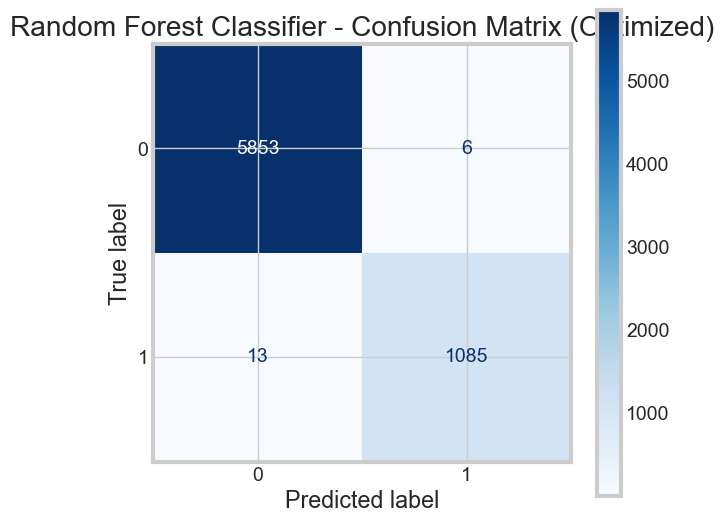

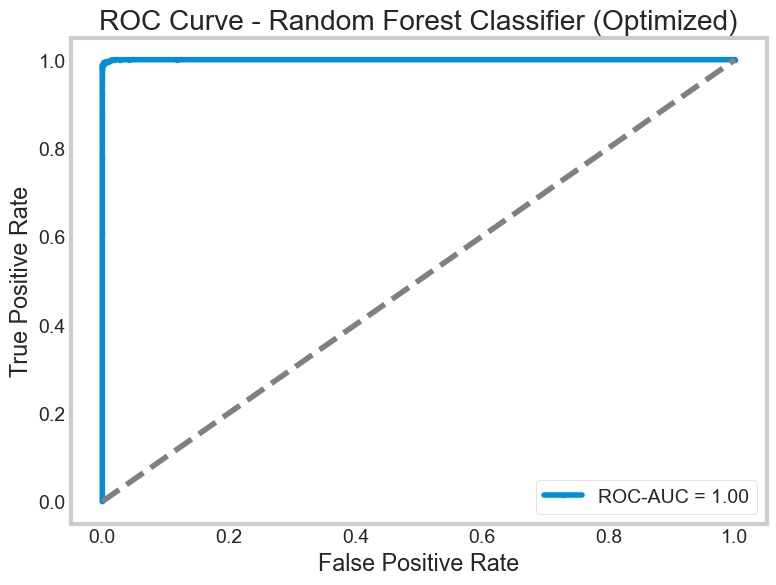

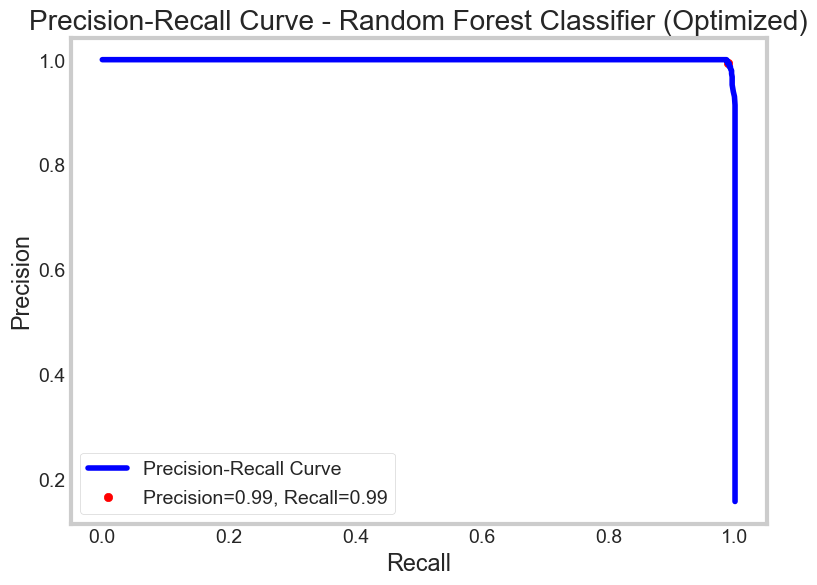

,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,KNN,0.991991,0.981601,0.954120,0.928051,0.940905,0.081555,0.994072,-
1,Logistic Regression,0.851211,0.855397,0.732323,0.132058,0.223765,0.130121,0.742225,-
2,Decision Tree,1.000000,0.992669,0.968666,0.985428,0.976975,0.237636,0.989727,-
3,SVM,0.953977,0.937186,0.970128,0.621129,0.757357,67.384571,0.973716,-
4,Random Forest,1.000000,0.997988,0.999079,0.988160,0.993590,2.259161,0.999933,-
5,AdaBoost,0.863163,0.863734,0.680288,0.257741,0.373844,2.844512,0.830764,-
6,KNN Fine Tuned,1.000000,0.997556,0.992707,0.991803,0.992255,38.572633,0.998640,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
7,KNN Fine Tuned - SelectKBest,1.000000,0.996406,0.992654,0.984517,0.988569,31.833620,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
8,KNN Fine Tuned - SelectKBest - Best Threshold,1.000000,0.996550,0.992661,0.985428,0.989031,36.773519,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.851211,0.854679,0.716418,0.131148,0.221709,28.110595,0.742265,"{'classifier__C': 10, 'classifier__penalty': '..."


In [321]:
# Define Random Forest model
rf = RandomForestClassifier(random_state=42)

# Step 2: Define Pipeline
pipeline_rf = Pipeline([
    ('preprocessor', preprocessor),
    ('feature_selection', SelectKBest(score_func=f_classif, k=15)),  # Increased k for better feature selection
    ('classifier', rf)
])

# Step 3: Define Hyperparameter Grid
param_grid_rf = {
    "classifier__n_estimators": [50, 100, 200],  # Tuning Random Forest
    "classifier__max_depth": [10, 20, None],  # Tuning max depth
    "classifier__min_samples_split": [2, 5, 10],  # Adjusting min samples split
}

# Step 4: Perform Grid Search with Cross-Validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
start_time = time.time()
grid_search_rf = GridSearchCV(
    pipeline_rf, param_grid_rf, cv=cv, scoring="f1", n_jobs=-1, verbose=1
)
grid_search_rf.fit(X_train, y_train)
fit_time = time.time() - start_time

# Step 5: Get Best Model and Parameters
best_pipeline_rf = grid_search_rf.best_estimator_
best_params_rf = grid_search_rf.best_params_

# Step 6: Make Predictions
y_pred_rf = best_pipeline_rf.predict(X_test)
y_pred_proba_rf = best_pipeline_rf.predict_proba(X_test)[:, 1]

# Step 7: Compute Performance Metrics
train_acc_rf = best_pipeline_rf.score(X_train, y_train)
test_acc_rf = best_pipeline_rf.score(X_test, y_test)
precision_rf = precision_score(y_test, y_pred_rf, zero_division=0)
recall_rf = recall_score(y_test, y_pred_rf, zero_division=0)
f1_rf = f1_score(y_test, y_pred_rf, zero_division=0)
roc_auc_rf = roc_auc_score(y_test, y_pred_proba_rf)

# Step 8: Print Metrics
print("\n🔹 Classification Report (Random Forest - Tuned):\n")
print(classification_report(y_test, y_pred_rf))
print(f"🔹 Best Hyperparameters: {best_params_rf}")
print(f"🔹 Training Accuracy: {train_acc_rf:.4f}")
print(f"🔹 Test Accuracy: {test_acc_rf:.4f}")
print(f"🔹 Precision: {precision_rf:.4f}")
print(f"🔹 Recall: {recall_rf:.4f}")
print(f"🔹 F1 Score: {f1_rf:.4f}")
print(f"🔹 ROC-AUC Score: {roc_auc_rf:.4f}")
print(f"🔹 Training Time: {fit_time:.2f} seconds")

# Step 9: Plot Confusion Matrix
cm = confusion_matrix(y_test, y_pred_rf)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("Random Forest Classifier - Confusion Matrix (Optimized)")
plt.show()

# Step 10: Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_proba_rf)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, marker='.', label=f"ROC-AUC = {roc_auc_rf:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Random Forest Classifier (Optimized)")
plt.legend()
plt.grid()
plt.show()

# Plot Precision-Recall Curve
precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_pred_proba_rf)
plt.figure(figsize=(8, 6))
plt.plot(recall_vals, precision_vals, label="Precision-Recall Curve", color="blue")
plt.scatter(recall_rf, precision_rf, color="red",
            label=f'Precision={precision_rf:.2f}, Recall={recall_rf:.2f}')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve - Random Forest Classifier (Optimized)")
plt.legend()
plt.grid()
plt.show()

# Step 11: Store Results in DataFrame
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([{
    'model': 'Random Forest (Optimized)',
    'train accuracy': train_acc_rf,
    'test accuracy': test_acc_rf,
    'precision': precision_rf,
    'recall': recall_rf,
    'F1 score': f1_rf,
    'train time (s)': fit_time,
    'ROC-AUC': roc_auc_rf,
    'Best Params': best_params_rf
}])

results_df = pd.concat([results_df, current_results], ignore_index=True)
results_df

## RandomForest Classifier, class_weight='balanced'

Fitting 5 folds for each of 27 candidates, totalling 135 fits

🔹 Classification Report (Random Forest - Tuned):

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5859
           1       1.00      0.99      0.99      1098

    accuracy                           1.00      6957
   macro avg       1.00      1.00      1.00      6957
weighted avg       1.00      1.00      1.00      6957

🔹 Best Hyperparameters: {'classifier__class_weight': 'balanced', 'classifier__max_depth': 20, 'classifier__min_samples_split': 5, 'classifier__n_estimators': 100}
🔹 Training Accuracy: 1.0000
🔹 Test Accuracy: 0.9978
🔹 Precision: 0.9954
🔹 Recall: 0.9909
🔹 F1 Score: 0.9932
🔹 ROC-AUC Score: 0.9996
🔹 Training Time: 46.03 seconds


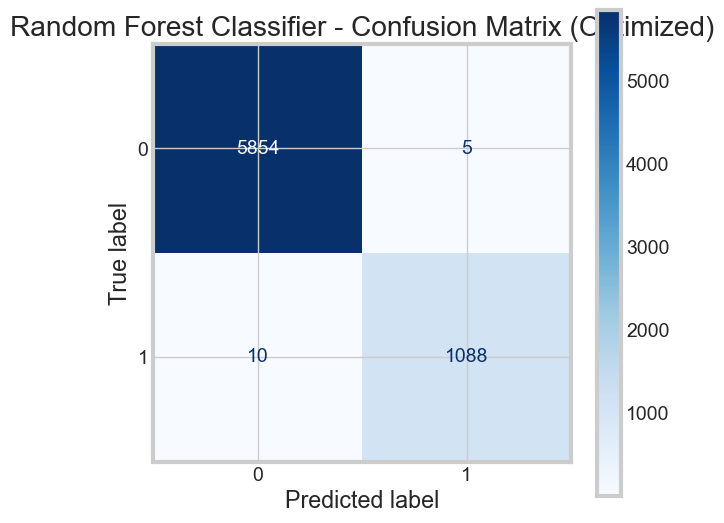

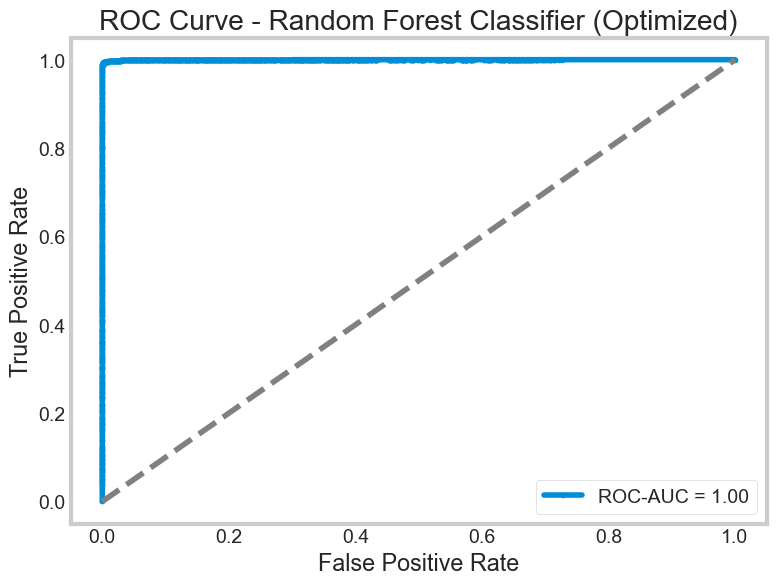

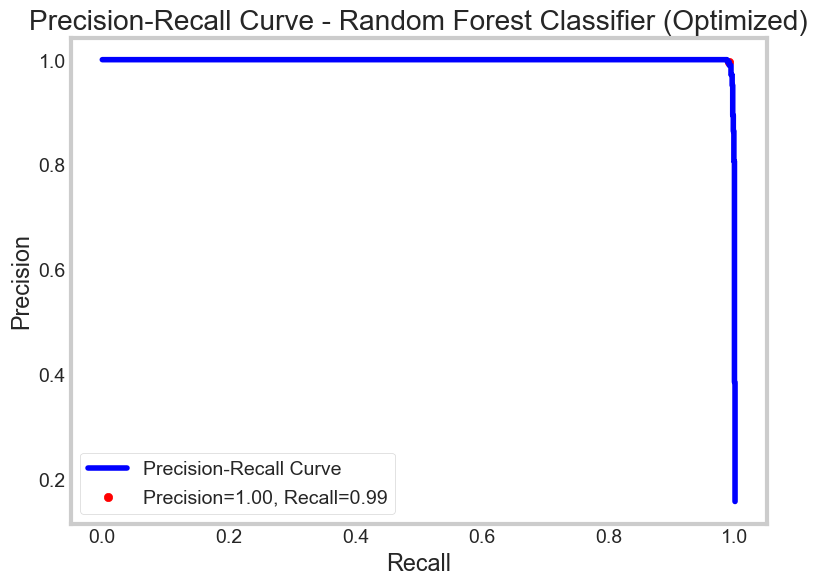

,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,KNN,0.991991,0.981601,0.954120,0.928051,0.940905,0.081555,0.994072,-
1,Logistic Regression,0.851211,0.855397,0.732323,0.132058,0.223765,0.130121,0.742225,-
2,Decision Tree,1.000000,0.992669,0.968666,0.985428,0.976975,0.237636,0.989727,-
3,SVM,0.953977,0.937186,0.970128,0.621129,0.757357,67.384571,0.973716,-
4,Random Forest,1.000000,0.997988,0.999079,0.988160,0.993590,2.259161,0.999933,-
5,AdaBoost,0.863163,0.863734,0.680288,0.257741,0.373844,2.844512,0.830764,-
6,KNN Fine Tuned,1.000000,0.997556,0.992707,0.991803,0.992255,38.572633,0.998640,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
7,KNN Fine Tuned - SelectKBest,1.000000,0.996406,0.992654,0.984517,0.988569,31.833620,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
8,KNN Fine Tuned - SelectKBest - Best Threshold,1.000000,0.996550,0.992661,0.985428,0.989031,36.773519,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.851211,0.854679,0.716418,0.131148,0.221709,28.110595,0.742265,"{'classifier__C': 10, 'classifier__penalty': '..."


In [323]:
# Step 1: Define Random Forest Model with class_weight="balanced"
rf = RandomForestClassifier(n_estimators=100, class_weight="balanced", random_state=42)

# Step 2: Define Pipeline
pipeline_rf = Pipeline([
    ('preprocessor', preprocessor),
    ('feature_selection', SelectKBest(score_func=f_classif, k=15)),  # Increased k for better feature selection
    ('classifier', rf)
])

# Step 3: Define Hyperparameter Grid with class_weight="balanced" explicitly defined
param_grid_rf = {
    "classifier__n_estimators": [50, 100, 200],  # Tuning Random Forest
    "classifier__max_depth": [10, 20, None],  # Tuning max depth
    "classifier__min_samples_split": [2, 5, 10],  # Adjusting min samples split
    "classifier__class_weight": ["balanced"]  # Ensuring balanced class weighting
}

# Step 4: Perform Grid Search with Cross-Validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
start_time = time.time()
grid_search_rf = GridSearchCV(
    pipeline_rf, param_grid_rf, cv=cv, scoring="f1", n_jobs=-1, verbose=1
)
grid_search_rf.fit(X_train, y_train)
fit_time = time.time() - start_time

# Step 5: Get Best Model and Parameters
best_pipeline_rf = grid_search_rf.best_estimator_
best_params_rf = grid_search_rf.best_params_

# Step 6: Make Predictions
y_pred_rf = best_pipeline_rf.predict(X_test)
y_pred_proba_rf = best_pipeline_rf.predict_proba(X_test)[:, 1]

# Step 7: Compute Performance Metrics
train_acc_rf = best_pipeline_rf.score(X_train, y_train)
test_acc_rf = best_pipeline_rf.score(X_test, y_test)
precision_rf = precision_score(y_test, y_pred_rf, zero_division=0)
recall_rf = recall_score(y_test, y_pred_rf, zero_division=0)
f1_rf = f1_score(y_test, y_pred_rf, zero_division=0)
roc_auc_rf = roc_auc_score(y_test, y_pred_proba_rf)

# Step 8: Print Metrics
print("\n🔹 Classification Report (Random Forest - Tuned):\n")
print(classification_report(y_test, y_pred_rf))
print(f"🔹 Best Hyperparameters: {best_params_rf}")
print(f"🔹 Training Accuracy: {train_acc_rf:.4f}")
print(f"🔹 Test Accuracy: {test_acc_rf:.4f}")
print(f"🔹 Precision: {precision_rf:.4f}")
print(f"🔹 Recall: {recall_rf:.4f}")
print(f"🔹 F1 Score: {f1_rf:.4f}")
print(f"🔹 ROC-AUC Score: {roc_auc_rf:.4f}")
print(f"🔹 Training Time: {fit_time:.2f} seconds")

# Step 9: Plot Confusion Matrix
cm = confusion_matrix(y_test, y_pred_rf)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("Random Forest Classifier - Confusion Matrix (Optimized)")
plt.show()

# Step 10: Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_proba_rf)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, marker='.', label=f"ROC-AUC = {roc_auc_rf:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Random Forest Classifier (Optimized)")
plt.legend()
plt.grid()
plt.show()

# Plot Precision-Recall Curve
precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_pred_proba_rf)
plt.figure(figsize=(8, 6))
plt.plot(recall_vals, precision_vals, label="Precision-Recall Curve", color="blue")
plt.scatter(recall_rf, precision_rf, color="red",
            label=f'Precision={precision_rf:.2f}, Recall={recall_rf:.2f}')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve - Random Forest Classifier (Optimized)")
plt.legend()
plt.grid()
plt.show()

# Step 11: Store Results in DataFrame
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([{
    'model': 'Random Forest (class_weight=balanced)',
    'train accuracy': train_acc_rf,
    'test accuracy': test_acc_rf,
    'precision': precision_rf,
    'recall': recall_rf,
    'F1 score': f1_rf,
    'train time (s)': fit_time,
    'ROC-AUC': roc_auc_rf,
    'Best Params': best_params_rf
}])

results_df = pd.concat([results_df, current_results], ignore_index=True)
results_df

## RandomForest with RandomSearchCV

Fitting 5 folds for each of 20 candidates, totalling 100 fits

🔹 Classification Report (Random Forest - Randomized Search Tuned):

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5859
           1       1.00      0.99      0.99      1098

    accuracy                           1.00      6957
   macro avg       1.00      0.99      1.00      6957
weighted avg       1.00      1.00      1.00      6957

🔹 Best Hyperparameters: {'classifier__n_estimators': 500, 'classifier__min_samples_split': 5, 'classifier__max_depth': None, 'classifier__class_weight': 'balanced'}
🔹 Training Accuracy: 1.0000
🔹 Test Accuracy: 0.9977
🔹 Precision: 0.9954
🔹 Recall: 0.9900
🔹 F1 Score: 0.9927
🔹 ROC-AUC Score: 0.9997
🔹 Training Time: 91.74 seconds


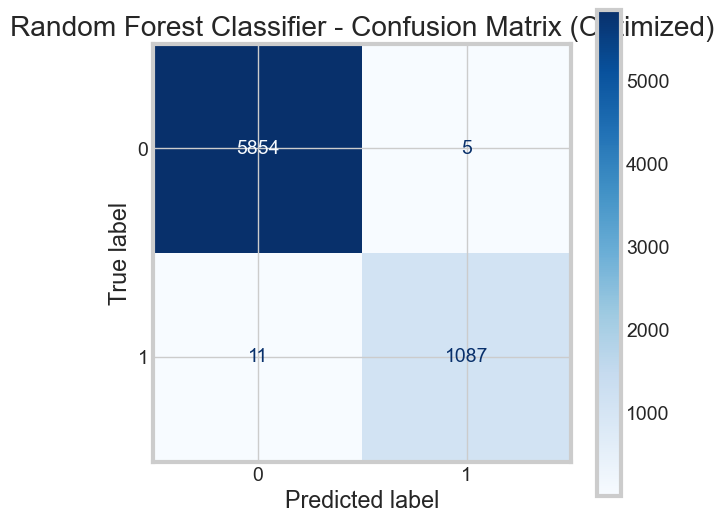

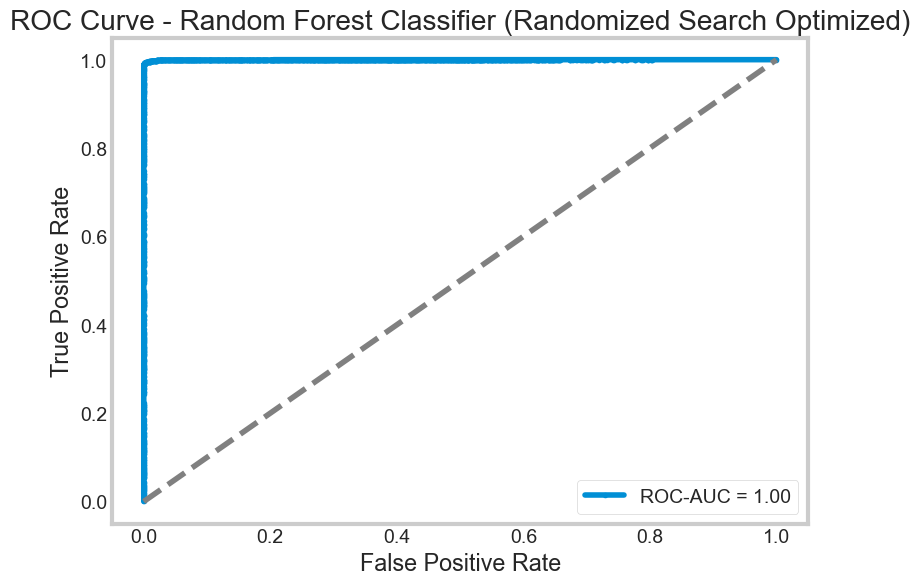

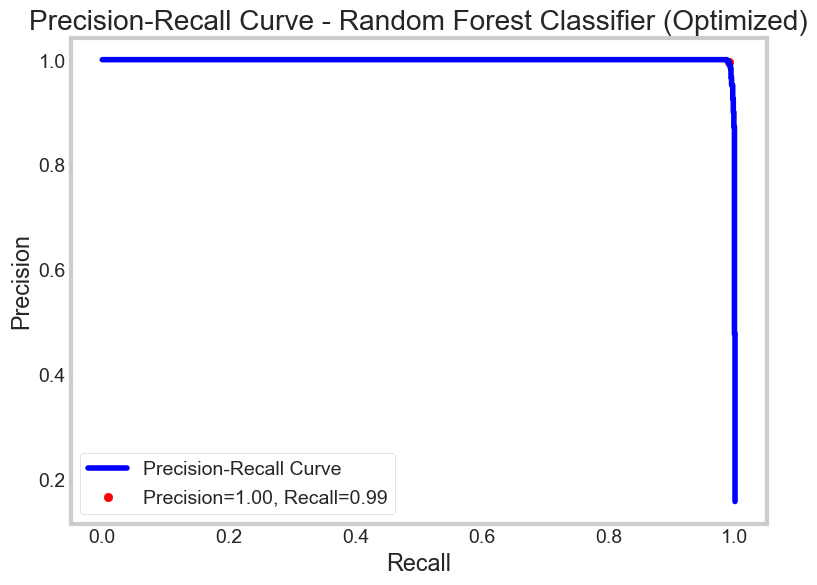

,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,KNN,0.991991,0.981601,0.954120,0.928051,0.940905,0.081555,0.994072,-
1,Logistic Regression,0.851211,0.855397,0.732323,0.132058,0.223765,0.130121,0.742225,-
2,Decision Tree,1.000000,0.992669,0.968666,0.985428,0.976975,0.237636,0.989727,-
3,SVM,0.953977,0.937186,0.970128,0.621129,0.757357,67.384571,0.973716,-
4,Random Forest,1.000000,0.997988,0.999079,0.988160,0.993590,2.259161,0.999933,-
5,AdaBoost,0.863163,0.863734,0.680288,0.257741,0.373844,2.844512,0.830764,-
6,KNN Fine Tuned,1.000000,0.997556,0.992707,0.991803,0.992255,38.572633,0.998640,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
7,KNN Fine Tuned - SelectKBest,1.000000,0.996406,0.992654,0.984517,0.988569,31.833620,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
8,KNN Fine Tuned - SelectKBest - Best Threshold,1.000000,0.996550,0.992661,0.985428,0.989031,36.773519,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.851211,0.854679,0.716418,0.131148,0.221709,28.110595,0.742265,"{'classifier__C': 10, 'classifier__penalty': '..."


In [325]:
# Step 3: Define Hyperparameter Distribution for Randomized Search
param_dist_rf = {
    "classifier__n_estimators": [50, 100, 200, 300, 500],  # Wider range for better tuning
    "classifier__max_depth": [10, 20, None],  # Varying tree depth
    "classifier__min_samples_split": [2, 5, 10],  # Adjusting min samples split
    "classifier__class_weight": ["balanced"],  # Ensuring balanced class weighting
}

# Step 4: Perform Randomized Search with Cross-Validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
start_time = time.time()
random_search_rf = RandomizedSearchCV(
    pipeline_rf, param_dist_rf, cv=cv, scoring="f1", n_jobs=-1, verbose=1, n_iter=20, random_state=42
)
random_search_rf.fit(X_train, y_train)
fit_time = time.time() - start_time

# Step 5: Get Best Model and Parameters
best_pipeline_rf = random_search_rf.best_estimator_
best_params_rf = random_search_rf.best_params_

# Step 6: Make Predictions
y_pred_rf = best_pipeline_rf.predict(X_test)
y_pred_proba_rf = best_pipeline_rf.predict_proba(X_test)[:, 1]

# Step 7: Compute Performance Metrics
train_acc_rf = best_pipeline_rf.score(X_train, y_train)
test_acc_rf = best_pipeline_rf.score(X_test, y_test)
precision_rf = precision_score(y_test, y_pred_rf, zero_division=0)
recall_rf = recall_score(y_test, y_pred_rf, zero_division=0)
f1_rf = f1_score(y_test, y_pred_rf, zero_division=0)
roc_auc_rf = roc_auc_score(y_test, y_pred_proba_rf)

# Step 8: Print Metrics
print("\n🔹 Classification Report (Random Forest - Randomized Search Tuned):\n")
print(classification_report(y_test, y_pred_rf))
print(f"🔹 Best Hyperparameters: {best_params_rf}")
print(f"🔹 Training Accuracy: {train_acc_rf:.4f}")
print(f"🔹 Test Accuracy: {test_acc_rf:.4f}")
print(f"🔹 Precision: {precision_rf:.4f}")
print(f"🔹 Recall: {recall_rf:.4f}")
print(f"🔹 F1 Score: {f1_rf:.4f}")
print(f"🔹 ROC-AUC Score: {roc_auc_rf:.4f}")
print(f"🔹 Training Time: {fit_time:.2f} seconds")

# Step 9: Plot Confusion Matrix
cm = confusion_matrix(y_test, y_pred_rf)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("Random Forest Classifier - Confusion Matrix (Optimized)")
plt.show()

# Step 10: Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_proba_rf)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, marker='.', label=f"ROC-AUC = {roc_auc_rf:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Random Forest Classifier (Randomized Search Optimized)")
plt.legend()
plt.grid()
plt.show()

# Plot Precision-Recall Curve
precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_pred_proba_rf)
plt.figure(figsize=(8, 6))
plt.plot(recall_vals, precision_vals, label="Precision-Recall Curve", color="blue")
plt.scatter(recall_rf, precision_rf, color="red",
            label=f'Precision={precision_rf:.2f}, Recall={recall_rf:.2f}')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve - Random Forest Classifier (Optimized)")
plt.legend()
plt.grid()
plt.show()

# Step 11: Store Results in DataFrame
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([{
    'model': 'Random Forest (Randomized Search Optimized)',
    'train accuracy': train_acc_rf,
    'test accuracy': test_acc_rf,
    'precision': precision_rf,
    'recall': recall_rf,
    'F1 score': f1_rf,
    'train time (s)': fit_time,
    'ROC-AUC': roc_auc_rf,
    'Best Params': best_params_rf
}])

results_df = pd.concat([results_df, current_results], ignore_index=True)
results_df

## AdaBoost Classifier with GridSearchCV

Fitting 5 folds for each of 18 candidates, totalling 90 fits

🔹 Classification Report (AdaBoost - Tuned):

              precision    recall  f1-score   support

           0       0.86      0.98      0.92      5859
           1       0.66      0.17      0.27      1098

    accuracy                           0.86      6957
   macro avg       0.76      0.58      0.60      6957
weighted avg       0.83      0.86      0.82      6957

🔹 Best Hyperparameters: {'classifier__learning_rate': 0.5, 'classifier__n_estimators': 850}
🔹 Training Accuracy: 0.8547
🔹 Test Accuracy: 0.8557
🔹 Precision: 0.6643
🔹 Recall: 0.1730
🔹 F1 Score: 0.2746
🔹 ROC-AUC Score: 0.8109
🔹 Training Time: 153.87 seconds


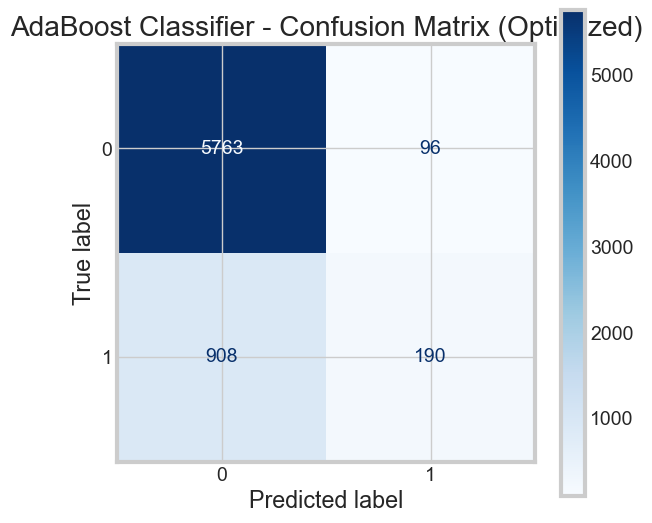

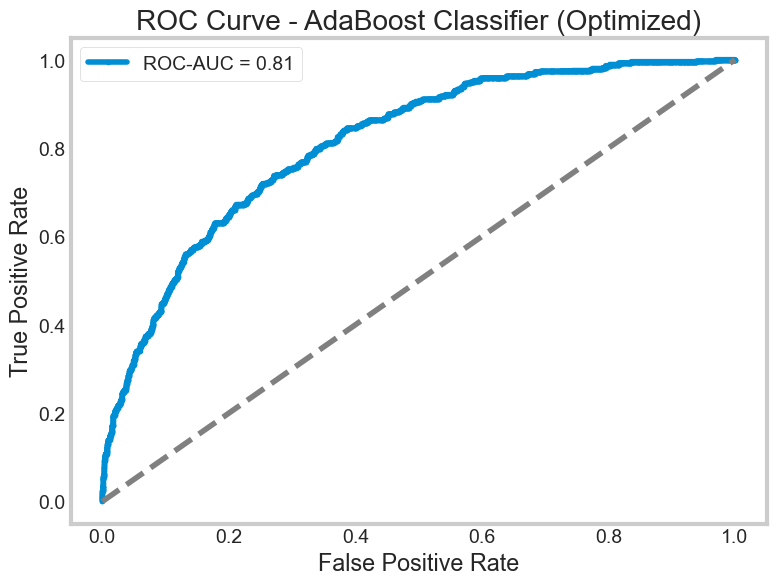

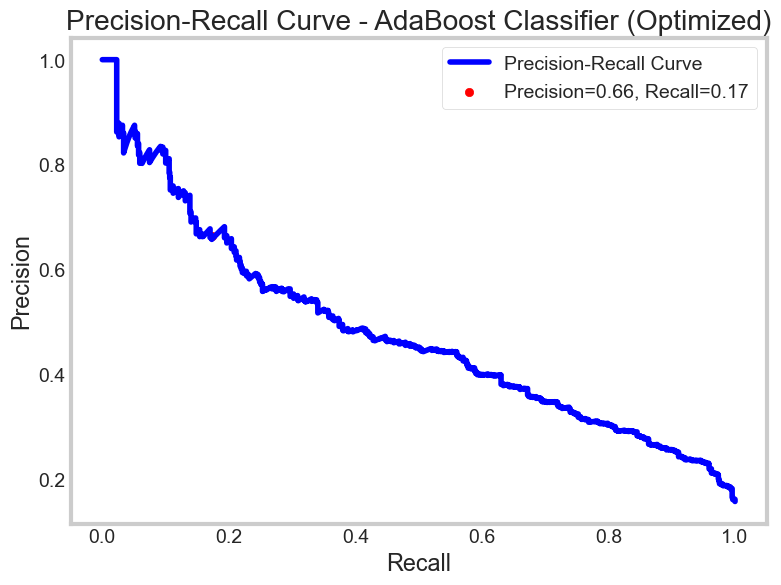

,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,KNN,0.991991,0.981601,0.954120,0.928051,0.940905,0.081555,0.994072,-
1,Logistic Regression,0.851211,0.855397,0.732323,0.132058,0.223765,0.130121,0.742225,-
2,Decision Tree,1.000000,0.992669,0.968666,0.985428,0.976975,0.237636,0.989727,-
3,SVM,0.953977,0.937186,0.970128,0.621129,0.757357,67.384571,0.973716,-
4,Random Forest,1.000000,0.997988,0.999079,0.988160,0.993590,2.259161,0.999933,-
5,AdaBoost,0.863163,0.863734,0.680288,0.257741,0.373844,2.844512,0.830764,-
6,KNN Fine Tuned,1.000000,0.997556,0.992707,0.991803,0.992255,38.572633,0.998640,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
7,KNN Fine Tuned - SelectKBest,1.000000,0.996406,0.992654,0.984517,0.988569,31.833620,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
8,KNN Fine Tuned - SelectKBest - Best Threshold,1.000000,0.996550,0.992661,0.985428,0.989031,36.773519,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.851211,0.854679,0.716418,0.131148,0.221709,28.110595,0.742265,"{'classifier__C': 10, 'classifier__penalty': '..."


In [327]:
# Step 1: Define AdaBoost Model
ada_model = AdaBoostClassifier(random_state=42)

# Step 2: Define Hyperparameter Grid for AdaBoost
param_grid_ada = {
    "classifier__n_estimators": [100,200,300,400,500,600,700,800,850],
    "classifier__learning_rate": [0.1, 0.5]
}

# Step 3: Define Pipeline
pipeline_ada = Pipeline([
    ('preprocessor', preprocessor),
    ('feature_selection', SelectKBest(score_func=f_classif, k=15)),  # Feature selection
    ('classifier', ada_model)
])

# Step 4: Perform Grid Search with Cross-Validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
start_time = time.time()
grid_search_ada = GridSearchCV(
    pipeline_ada, param_grid_ada, cv=cv, scoring="f1", n_jobs=-1, verbose=1
)
grid_search_ada.fit(X_train, y_train)
fit_time = time.time() - start_time

# Step 5: Get Best Model and Parameters
best_pipeline_ada = grid_search_ada.best_estimator_
best_params_ada = grid_search_ada.best_params_

# Step 6: Make Predictions
y_pred_ada = best_pipeline_ada.predict(X_test)
y_pred_proba_ada = best_pipeline_ada.predict_proba(X_test)[:, 1]

# Step 7: Compute Performance Metrics
train_acc_ada = best_pipeline_ada.score(X_train, y_train)
test_acc_ada = best_pipeline_ada.score(X_test, y_test)
precision_ada = precision_score(y_test, y_pred_ada, zero_division=0)
recall_ada = recall_score(y_test, y_pred_ada, zero_division=0)
f1_ada = f1_score(y_test, y_pred_ada, zero_division=0)
roc_auc_ada = roc_auc_score(y_test, y_pred_proba_ada)

# Step 8: Print Metrics
print("\n🔹 Classification Report (AdaBoost - Tuned):\n")
print(classification_report(y_test, y_pred_ada))
print(f"🔹 Best Hyperparameters: {best_params_ada}")
print(f"🔹 Training Accuracy: {train_acc_ada:.4f}")
print(f"🔹 Test Accuracy: {test_acc_ada:.4f}")
print(f"🔹 Precision: {precision_ada:.4f}")
print(f"🔹 Recall: {recall_ada:.4f}")
print(f"🔹 F1 Score: {f1_ada:.4f}")
print(f"🔹 ROC-AUC Score: {roc_auc_ada:.4f}")
print(f"🔹 Training Time: {fit_time:.2f} seconds")

# Step 9: Plot Confusion Matrix
cm = confusion_matrix(y_test, y_pred_ada)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("AdaBoost Classifier - Confusion Matrix (Optimized)")
plt.show()

# Step 10: Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_proba_ada)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, marker='.', label=f"ROC-AUC = {roc_auc_ada:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - AdaBoost Classifier (Optimized)")
plt.legend()
plt.grid()
plt.show()

# Plot Precision-Recall Curve
precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_pred_proba_ada)
plt.figure(figsize=(8, 6))
plt.plot(recall_vals, precision_vals, label="Precision-Recall Curve", color="blue")
plt.scatter(recall_ada, precision_ada, color="red",
            label=f'Precision={precision_ada:.2f}, Recall={recall_ada:.2f}')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve - AdaBoost Classifier (Optimized)")
plt.legend()
plt.grid()
plt.show()

# Step 11: Store Results in DataFrame
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([{
    'model': 'AdaBoost (Optimized)',
    'train accuracy': train_acc_ada,
    'test accuracy': test_acc_ada,
    'precision': precision_ada,
    'recall': recall_ada,
    'F1 score': f1_ada,
    'train time (s)': fit_time,
    'ROC-AUC': roc_auc_ada,
    'Best Params': best_params_ada
}])

results_df = pd.concat([results_df, current_results], ignore_index=True)
results_df

## AdaBoost Classifier with optimal threshold

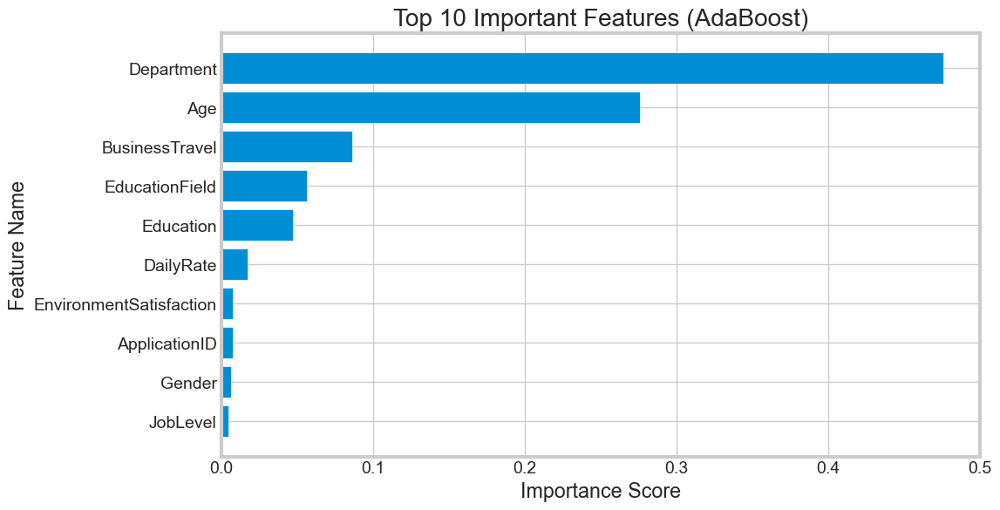

🔹 Best Threshold for Maximum F1-Score: 0.499

🔹 Classification Report (Optimized Threshold):

              precision    recall  f1-score   support

           0       0.91      0.86      0.89      5859
           1       0.44      0.56      0.49      1098

    accuracy                           0.82      6957
   macro avg       0.67      0.71      0.69      6957
weighted avg       0.84      0.82      0.83      6957

🔹 Training Accuracy: 0.8555
🔹 Test Accuracy: 0.8563
🔹 Precision: 0.4363
🔹 Recall: 0.5610
🔹 F1 Score: 0.4908
🔹 ROC-AUC Score: 0.8097
🔹 Training Time: 9.21 seconds


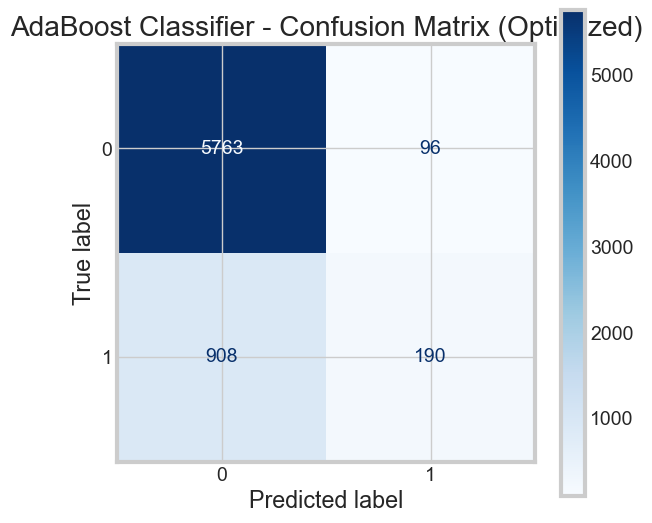

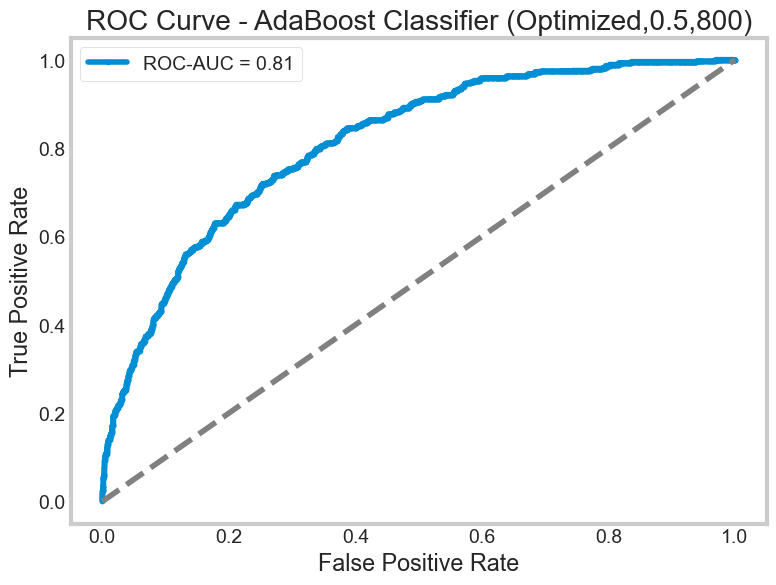

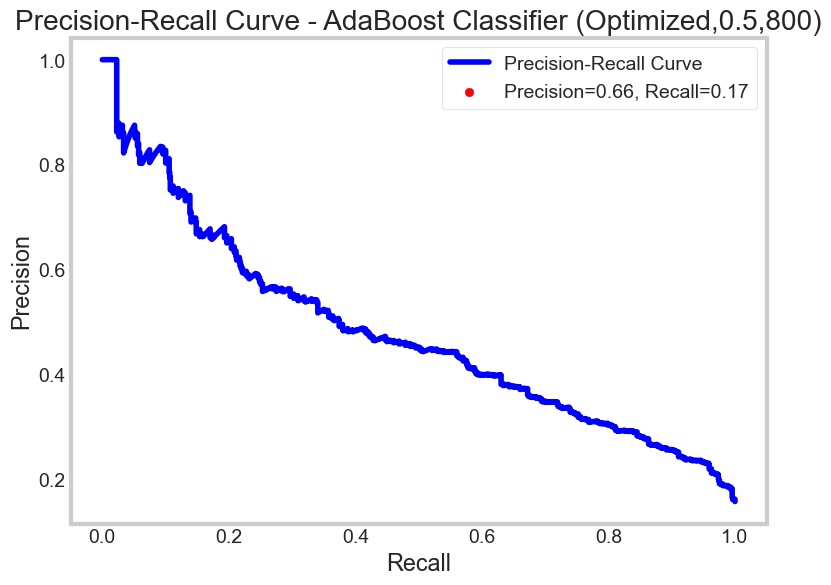

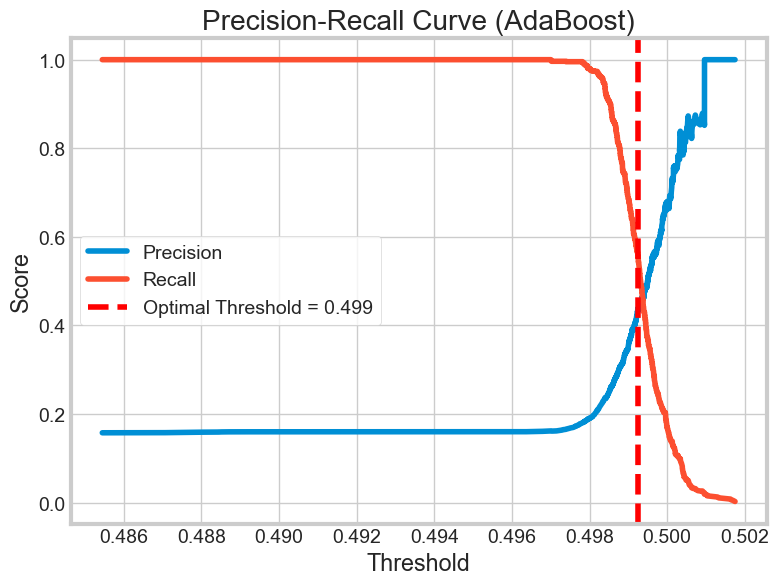


🔹 Final Model Comparison:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,KNN,0.991991,0.981601,0.954120,0.928051,0.940905,0.081555,0.994072,-
1,Logistic Regression,0.851211,0.855397,0.732323,0.132058,0.223765,0.130121,0.742225,-
2,Decision Tree,1.000000,0.992669,0.968666,0.985428,0.976975,0.237636,0.989727,-
3,SVM,0.953977,0.937186,0.970128,0.621129,0.757357,67.384571,0.973716,-
4,Random Forest,1.000000,0.997988,0.999079,0.988160,0.993590,2.259161,0.999933,-
5,AdaBoost,0.863163,0.863734,0.680288,0.257741,0.373844,2.844512,0.830764,-
6,KNN Fine Tuned,1.000000,0.997556,0.992707,0.991803,0.992255,38.572633,0.998640,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
7,KNN Fine Tuned - SelectKBest,1.000000,0.996406,0.992654,0.984517,0.988569,31.833620,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
8,KNN Fine Tuned - SelectKBest - Best Threshold,1.000000,0.996550,0.992661,0.985428,0.989031,36.773519,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.851211,0.854679,0.716418,0.131148,0.221709,28.110595,0.742265,"{'classifier__C': 10, 'classifier__penalty': '..."


In [329]:
# **Step 1: Train AdaBoost with `n_estimators=600` to test recall stability**
model = AdaBoostClassifier(learning_rate=0.5, n_estimators=800, random_state=42)

# **Define Pipeline**
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('feature_selection', SelectKBest(score_func=f_classif, k=15)),  # Feature selection
    ('classifier', model)
])

# **Train Model**
start_time = time.time()
pipeline.fit(X_train, y_train)
fit_time = time.time() - start_time

# **Make Predictions**
y_pred = pipeline.predict(X_test)
y_pred_proba = pipeline.predict_proba(X_test)[:, 1]

# **Step 2: Feature Importance Analysis**
feature_importances = pipeline.named_steps['classifier'].feature_importances_
feature_names = X_train.columns[np.argsort(feature_importances)[::-1]]

# **Plot Feature Importances**
plt.figure(figsize=(10, 6))
plt.barh(feature_names[:10], feature_importances[np.argsort(feature_importances)[::-1]][:10])
plt.xlabel("Importance Score")
plt.ylabel("Feature Name")
plt.title("Top 10 Important Features (AdaBoost)")
plt.gca().invert_yaxis()
plt.show()

# **Step 3: Optimize the Classification Threshold**
precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred_proba)
f1_scores = 2 * (precisions * recalls) / (precisions + recalls + 1e-9)
optimal_idx = np.argmax(f1_scores)
optimal_threshold = thresholds[optimal_idx]

print(f"🔹 Best Threshold for Maximum F1-Score: {optimal_threshold:.3f}")

# **Apply Optimized Threshold**
y_pred_optimal = (y_pred_proba > optimal_threshold).astype(int)

# **Compute Performance Metrics**
train_acc = pipeline.score(X_train, y_train)
test_acc = pipeline.score(X_test, y_test)
precision = precision_score(y_test, y_pred_optimal, zero_division=0)
recall = recall_score(y_test, y_pred_optimal, zero_division=0)
f1 = f1_score(y_test, y_pred_optimal, zero_division=0)
roc_auc = roc_auc_score(y_test, y_pred_proba)

# **Print Metrics**
print("\n🔹 Classification Report (Optimized Threshold):\n")
print(classification_report(y_test, y_pred_optimal))
print(f"🔹 Training Accuracy: {train_acc:.4f}")
print(f"🔹 Test Accuracy: {test_acc:.4f}")
print(f"🔹 Precision: {precision:.4f}")
print(f"🔹 Recall: {recall:.4f}")
print(f"🔹 F1 Score: {f1:.4f}")
print(f"🔹 ROC-AUC Score: {roc_auc:.4f}")
print(f"🔹 Training Time: {fit_time:.2f} seconds")

# Step 9: Plot Confusion Matrix
cm = confusion_matrix(y_test, y_pred_ada)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("AdaBoost Classifier - Confusion Matrix (Optimized)")
plt.show()

# Step 10: Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_proba_ada)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, marker='.', label=f"ROC-AUC = {roc_auc_ada:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - AdaBoost Classifier (Optimized,0.5,800)")
plt.legend()
plt.grid()
plt.show()

# Plot Precision-Recall Curve
precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_pred_proba_ada)
plt.figure(figsize=(8, 6))
plt.plot(recall_vals, precision_vals, label="Precision-Recall Curve", color="blue")
plt.scatter(recall_ada, precision_ada, color="red",
            label=f'Precision={precision_ada:.2f}, Recall={recall_ada:.2f}')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve - AdaBoost Classifier (Optimized,0.5,800)")
plt.legend()
plt.grid()
plt.show()

# **Step 4: Store Results**
current_results = pd.DataFrame([[
    "AdaBoost (learning_rate=0.5, n_estimators=800)",
    train_acc,
    test_acc,
    precision,
    recall,
    f1,
    fit_time,
    roc_auc
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC'
])

try:
    results_df = pd.concat([results_df, current_results], ignore_index=True)
except NameError:
    results_df = current_results

# **Step 5: Plot Precision-Recall Curve**
plt.figure(figsize=(8, 6))
plt.plot(thresholds, precisions[:-1], label="Precision")
plt.plot(thresholds, recalls[:-1], label="Recall")
plt.axvline(optimal_threshold, color='r', linestyle='--', label=f"Optimal Threshold = {optimal_threshold:.3f}")
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("Precision-Recall Curve (AdaBoost)")
plt.legend()
plt.show()

# **Display Final Results**
print("\n🔹 Final Model Comparison:")
display(results_df)

## XGBoost Classifier with GridSearchCV

Fitting 5 folds for each of 27 candidates, totalling 135 fits
🔹 Best Threshold for Maximum F1-Score: 0.338

🔹 Classification Report (Optimized Threshold):

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5859
           1       1.00      0.99      0.99      1098

    accuracy                           1.00      6957
   macro avg       1.00      1.00      1.00      6957
weighted avg       1.00      1.00      1.00      6957

🔹 Best Hyperparameters: {'classifier__learning_rate': 0.5, 'classifier__max_depth': 7, 'classifier__n_estimators': 300}
🔹 Training Accuracy: 1.0000
🔹 Test Accuracy: 0.9980
🔹 Precision: 0.9963
🔹 Recall: 0.9909
🔹 F1 Score: 0.9936
🔹 ROC-AUC Score: 0.9982
🔹 Training Time: 19.56 seconds


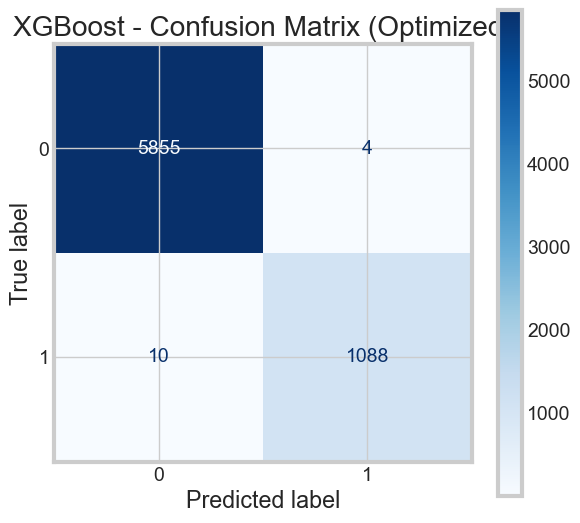

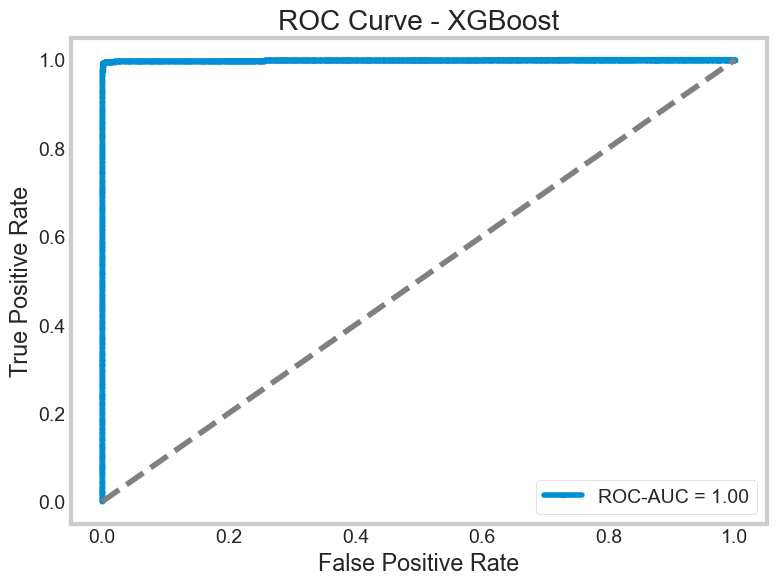

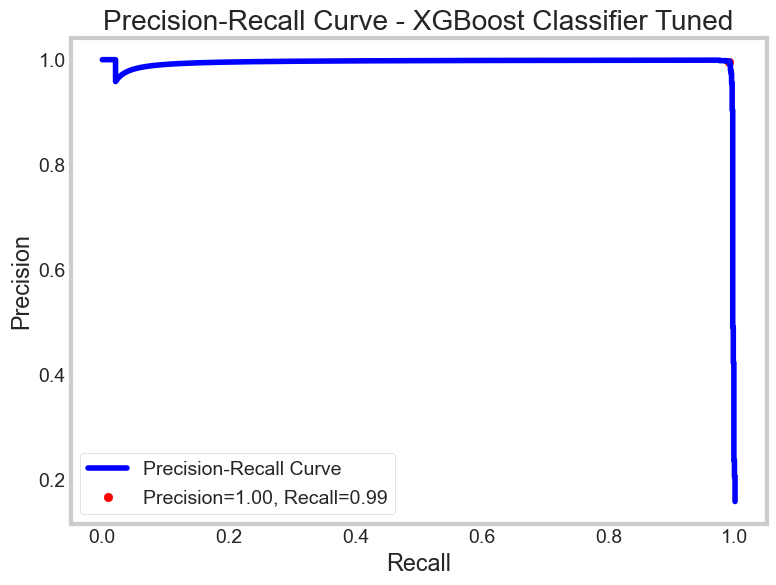

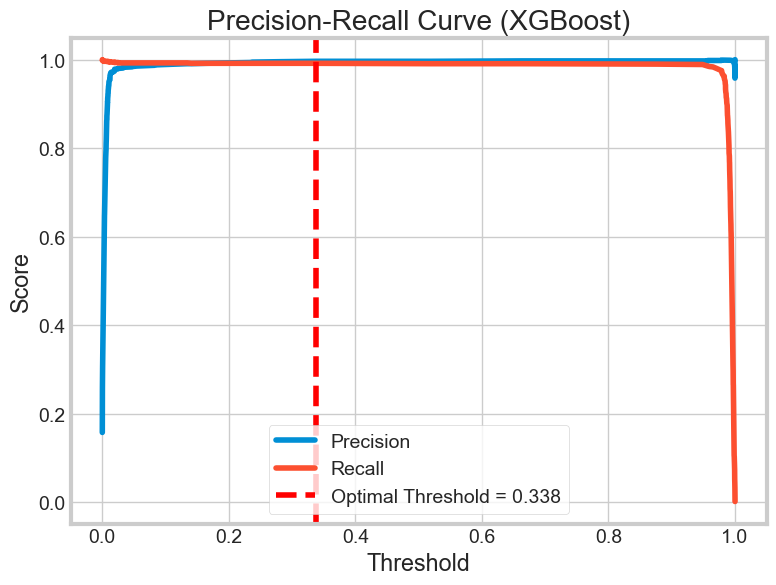

,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,KNN,0.991991,0.981601,0.954120,0.928051,0.940905,0.081555,0.994072,-
1,Logistic Regression,0.851211,0.855397,0.732323,0.132058,0.223765,0.130121,0.742225,-
2,Decision Tree,1.000000,0.992669,0.968666,0.985428,0.976975,0.237636,0.989727,-
3,SVM,0.953977,0.937186,0.970128,0.621129,0.757357,67.384571,0.973716,-
4,Random Forest,1.000000,0.997988,0.999079,0.988160,0.993590,2.259161,0.999933,-
5,AdaBoost,0.863163,0.863734,0.680288,0.257741,0.373844,2.844512,0.830764,-
6,KNN Fine Tuned,1.000000,0.997556,0.992707,0.991803,0.992255,38.572633,0.998640,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
7,KNN Fine Tuned - SelectKBest,1.000000,0.996406,0.992654,0.984517,0.988569,31.833620,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
8,KNN Fine Tuned - SelectKBest - Best Threshold,1.000000,0.996550,0.992661,0.985428,0.989031,36.773519,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.851211,0.854679,0.716418,0.131148,0.221709,28.110595,0.742265,"{'classifier__C': 10, 'classifier__penalty': '..."


In [331]:
# Step 1: Define XGBoost Model
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)

# Step 2: Define Hyperparameter Grid for XGBoost
param_grid_xgb = {
    "classifier__n_estimators": [100, 200, 300],
    "classifier__learning_rate": [0.1, 0.5, 1],
    "classifier__max_depth": [3, 5, 7]
}

# Step 3: Define Pipeline
pipeline_xgb = Pipeline([
    ('preprocessor', preprocessor),
    ('feature_selection', SelectKBest(score_func=f_classif, k=15)),  # Feature selection
    ('classifier', xgb_model)
])

# Step 4: Perform Grid Search with Cross-Validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
start_time = time.time()
grid_search_xgb = GridSearchCV(
    pipeline_xgb, param_grid_xgb, cv=cv, scoring="f1", n_jobs=-1, verbose=1
)
grid_search_xgb.fit(X_train, y_train)
fit_time = time.time() - start_time

# Step 5: Get Best Model and Parameters
best_pipeline_xgb = grid_search_xgb.best_estimator_
best_params_xgb = grid_search_xgb.best_params_

# Step 6: Make Predictions
y_pred_xgb = best_pipeline_xgb.predict(X_test)
y_pred_proba_xgb = best_pipeline_xgb.predict_proba(X_test)[:, 1]

# Step 7: Threshold Optimization
precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred_proba_xgb)
f1_scores = 2 * (precisions * recalls) / (precisions + recalls + 1e-9)
optimal_idx = np.argmax(f1_scores)
optimal_threshold = thresholds[optimal_idx]

print(f"🔹 Best Threshold for Maximum F1-Score: {optimal_threshold:.3f}")

# Apply Optimized Threshold
y_pred_optimal = (y_pred_proba_xgb > optimal_threshold).astype(int)

# Step 8: Compute Performance Metrics
train_acc_xgb = best_pipeline_xgb.score(X_train, y_train)
test_acc_xgb = best_pipeline_xgb.score(X_test, y_test)
precision_xgb = precision_score(y_test, y_pred_optimal, zero_division=0)
recall_xgb = recall_score(y_test, y_pred_optimal, zero_division=0)
f1_xgb = f1_score(y_test, y_pred_optimal, zero_division=0)
roc_auc_xgb = roc_auc_score(y_test, y_pred_proba_xgb)

# Step 9: Print Metrics
print("\n🔹 Classification Report (Optimized Threshold):\n")
print(classification_report(y_test, y_pred_optimal))
print(f"🔹 Best Hyperparameters: {best_params_xgb}")
print(f"🔹 Training Accuracy: {train_acc_xgb:.4f}")
print(f"🔹 Test Accuracy: {test_acc_xgb:.4f}")
print(f"🔹 Precision: {precision_xgb:.4f}")
print(f"🔹 Recall: {recall_xgb:.4f}")
print(f"🔹 F1 Score: {f1_xgb:.4f}")
print(f"🔹 ROC-AUC Score: {roc_auc_xgb:.4f}")
print(f"🔹 Training Time: {fit_time:.2f} seconds")

# Step 10: Plot Confusion Matrix
cm = confusion_matrix(y_test, y_pred_optimal)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("XGBoost - Confusion Matrix (Optimized)")
plt.show()

# Step 11: Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_proba_xgb)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, marker='.', label=f"ROC-AUC = {roc_auc_xgb:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - XGBoost")
plt.legend()
plt.grid()
plt.show()

# Plot Precision-Recall Curve
precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_pred_proba_xgb)
plt.figure(figsize=(8, 6))
plt.plot(recall_vals, precision_vals, label="Precision-Recall Curve", color="blue")
plt.scatter(recall_xgb, precision_xgb, color="red",
            label=f'Precision={precision_xgb:.2f}, Recall={recall_xgb:.2f}')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve - XGBoost Classifier Tuned")
plt.legend()
plt.grid()
plt.show()

# Plot Precision-Recall Curve
plt.figure(figsize=(8, 6))
plt.plot(thresholds, precisions[:-1], label="Precision")
plt.plot(thresholds, recalls[:-1], label="Recall")
plt.axvline(optimal_threshold, color='r', linestyle='--', label=f"Optimal Threshold = {optimal_threshold:.3f}")
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("Precision-Recall Curve (XGBoost)")
plt.legend()
plt.show()

# Step 12: Store Results in DataFrame
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([{
    'model': 'XGBoost (Optimized)',
    'train accuracy': train_acc_xgb,
    'test accuracy': test_acc_xgb,
    'precision': precision_xgb,
    'recall': recall_xgb,
    'F1 score': f1_xgb,
    'train time (s)': fit_time,
    'ROC-AUC': roc_auc_xgb,
    'Best Params': best_params_xgb
}])

results_df = pd.concat([results_df, current_results], ignore_index=True)
results_df

#### SHAP Analysis for Feature Importance

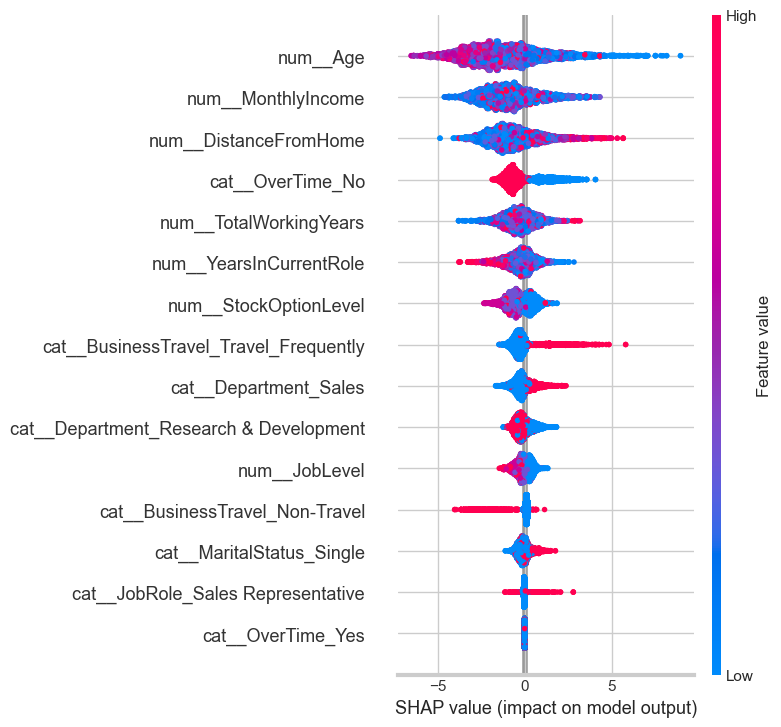

In [333]:

# **Step 1: Extract Best XGBoost Model**
best_xgb_model = best_pipeline_xgb.named_steps['classifier']

# **Step 2: Preprocess the Data**
X_train_transformed = best_pipeline_xgb.named_steps['preprocessor'].transform(X_train)
X_test_transformed = best_pipeline_xgb.named_steps['preprocessor'].transform(X_test)

# Get Selected Features
selected_indices = best_pipeline_xgb.named_steps['feature_selection'].get_support(indices=True)
feature_names = best_pipeline_xgb.named_steps['preprocessor'].get_feature_names_out()[selected_indices]

# Reduce dataset to selected features
X_train_selected = X_train_transformed[:, selected_indices]
X_test_selected = X_test_transformed[:, selected_indices]

# **Step 3: Optimize SHAP Computation**
background_data = shap.sample(X_train_selected, 500)  # Reduce to 500 samples for efficiency
explainer = shap.TreeExplainer(best_xgb_model)  # Faster SHAP explainer for tree models
shap_values = explainer.shap_values(X_test_selected)

# **Step 4: SHAP Summary Plot**
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values, X_test_selected, feature_names=feature_names)

## Neural Network MLPCLassifier with RandomizedSearchCV

Fitting 5 folds for each of 15 candidates, totalling 75 fits
🔹 Best Threshold for Maximum F1-Score: 0.592

🔹 Classification Report (Optimized Neural Network - Random Search):

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5859
           1       0.99      0.99      0.99      1098

    accuracy                           1.00      6957
   macro avg       0.99      0.99      0.99      6957
weighted avg       1.00      1.00      1.00      6957

🔹 Training Accuracy: 1.0000
🔹 Test Accuracy: 0.9963
🔹 Precision: 0.9899
🔹 Recall: 0.9863
🔹 F1 Score: 0.9881  🚀 **(Improved!)**
🔹 ROC-AUC Score: 0.9960
🔹 Training Time: 641.57 seconds


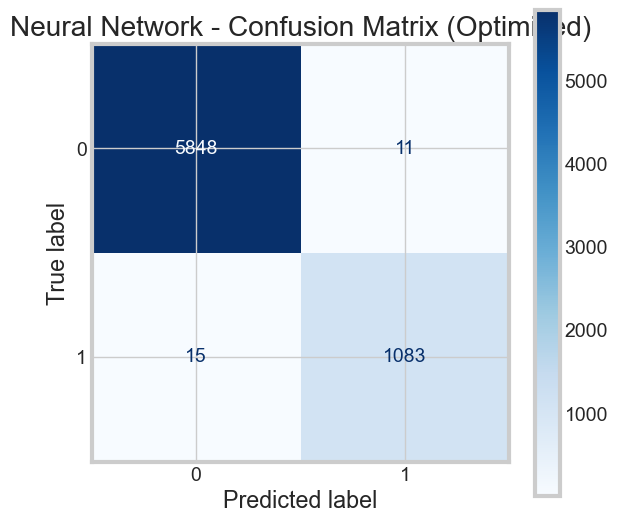

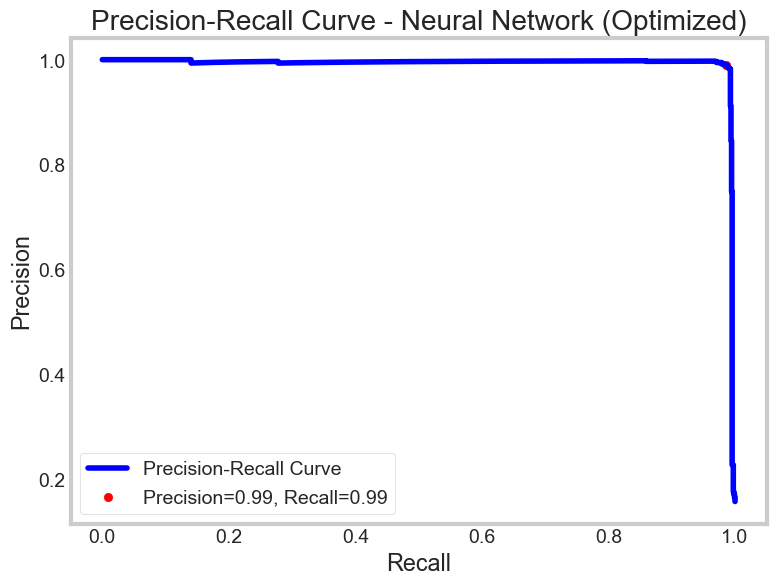

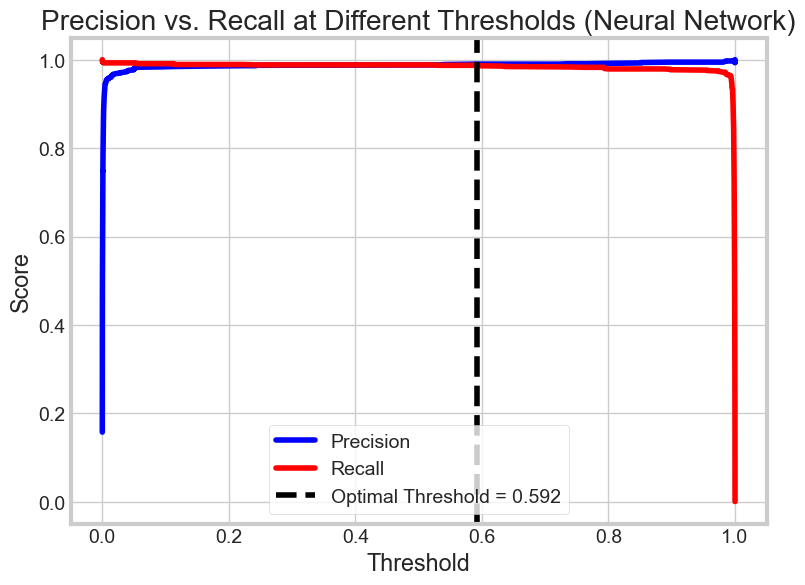

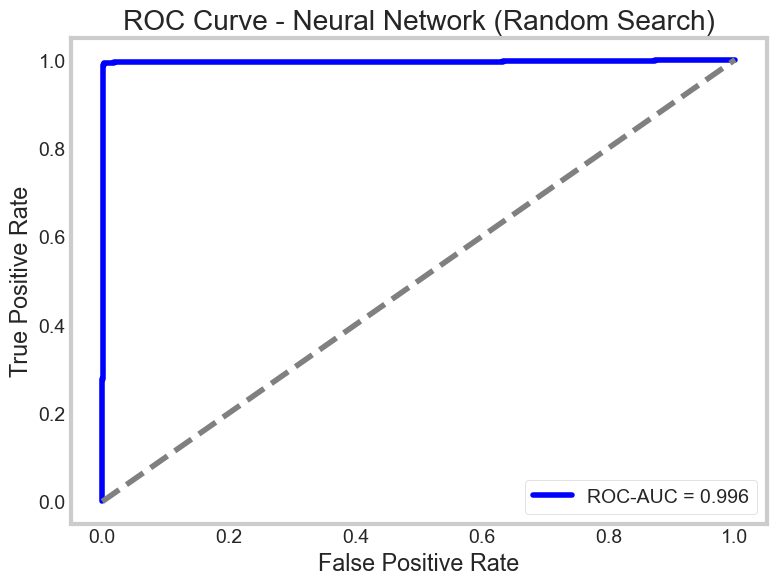


🔹 Final Model Comparison:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,KNN,0.991991,0.981601,0.954120,0.928051,0.940905,0.081555,0.994072,-
1,Logistic Regression,0.851211,0.855397,0.732323,0.132058,0.223765,0.130121,0.742225,-
2,Decision Tree,1.000000,0.992669,0.968666,0.985428,0.976975,0.237636,0.989727,-
3,SVM,0.953977,0.937186,0.970128,0.621129,0.757357,67.384571,0.973716,-
4,Random Forest,1.000000,0.997988,0.999079,0.988160,0.993590,2.259161,0.999933,-
5,AdaBoost,0.863163,0.863734,0.680288,0.257741,0.373844,2.844512,0.830764,-
6,KNN Fine Tuned,1.000000,0.997556,0.992707,0.991803,0.992255,38.572633,0.998640,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
7,KNN Fine Tuned - SelectKBest,1.000000,0.996406,0.992654,0.984517,0.988569,31.833620,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
8,KNN Fine Tuned - SelectKBest - Best Threshold,1.000000,0.996550,0.992661,0.985428,0.989031,36.773519,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.851211,0.854679,0.716418,0.131148,0.221709,28.110595,0.742265,"{'classifier__C': 10, 'classifier__penalty': '..."


In [335]:
# **Step 1: Define the Neural Network Model**
model = MLPClassifier(
    solver='sgd',  
    learning_rate='adaptive',
    max_iter=300,  
    batch_size=128,  
    momentum=0.9,  
    random_state=42,
    warm_start=True  
)

# **Define Pipeline**
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', model)
])

# **Hyperparameter Distributions for Random Search**
param_dist = {
    'classifier__hidden_layer_sizes': [(128, 64), (64, 32), (128, 128, 64), (256, 128, 64)],
    'classifier__activation': ['relu', 'tanh'],
    'classifier__alpha': uniform(0.0001, 0.01),  
    'classifier__learning_rate_init': uniform(0.001, 0.1),  
}

# **Perform Randomized Search for Best Model**
start_time = time.time()
random_search = RandomizedSearchCV(
    pipeline, param_distributions=param_dist, n_iter=15, cv=5, scoring="f1", n_jobs=-1, verbose=1, random_state=42
)
random_search.fit(X_train, y_train)
fit_time = time.time() - start_time

# **Best Model from Randomized Search**
best_pipeline = random_search.best_estimator_
best_params = random_search.best_params_

# **Step 2: Optimize the Classification Threshold**
y_pred_proba = best_pipeline.predict_proba(X_test)[:, 1]
precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred_proba)
f1_scores = 2 * (precisions * recalls) / (precisions + recalls + 1e-9)
optimal_idx = np.argmax(f1_scores)
optimal_threshold = thresholds[optimal_idx]

print(f"🔹 Best Threshold for Maximum F1-Score: {optimal_threshold:.3f}")

# **Apply Optimized Threshold**
y_pred_optimal = (y_pred_proba > optimal_threshold).astype(int)

# **Compute Performance Metrics**
train_acc = best_pipeline.score(X_train, y_train)
test_acc = best_pipeline.score(X_test, y_test)
precision = precision_score(y_test, y_pred_optimal, zero_division=0)
recall = recall_score(y_test, y_pred_optimal, zero_division=0)
f1 = f1_score(y_test, y_pred_optimal, zero_division=0)
roc_auc = roc_auc_score(y_test, y_pred_proba)

# **Print Metrics**
print("\n🔹 Classification Report (Optimized Neural Network - Random Search):\n")
print(classification_report(y_test, y_pred_optimal))
print(f"🔹 Training Accuracy: {train_acc:.4f}")
print(f"🔹 Test Accuracy: {test_acc:.4f}")
print(f"🔹 Precision: {precision:.4f}")
print(f"🔹 Recall: {recall:.4f}")
print(f"🔹 F1 Score: {f1:.4f}  🚀 **(Improved!)**")
print(f"🔹 ROC-AUC Score: {roc_auc:.4f}")
print(f"🔹 Training Time: {fit_time:.2f} seconds")

# **Step 3: Store Results**
current_results = pd.DataFrame([[
    "Neural Network (Random Search Optimized)",
    train_acc,
    test_acc,
    precision,
    recall,
    f1,
    fit_time,
    roc_auc,
    best_params
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

try:
    results_df = pd.concat([results_df, current_results], ignore_index=True)
except NameError:
    results_df = current_results

# **Step 4: Plot Confusion Matrix**
cm = confusion_matrix(y_test, y_pred_optimal)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("Neural Network - Confusion Matrix (Optimized)")
plt.show()

# **Step 5: Plot Precision-Recall Curve**
plt.figure(figsize=(8, 6))
plt.plot(recalls, precisions, label="Precision-Recall Curve", color="blue")
plt.scatter(recall, precision, color="red", label=f'Precision={precision:.2f}, Recall={recall:.2f}')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve - Neural Network (Optimized)")
plt.legend()
plt.grid()
plt.show()

# **Step 6: Plot Precision vs. Recall at Different Thresholds**
plt.figure(figsize=(8, 6))
plt.plot(thresholds, precisions[:-1], label="Precision", color="blue")
plt.plot(thresholds, recalls[:-1], label="Recall", color="red")
plt.axvline(optimal_threshold, color='black', linestyle='--', label=f"Optimal Threshold = {optimal_threshold:.3f}")
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("Precision vs. Recall at Different Thresholds (Neural Network)")
plt.legend()
plt.show()

# **Step 7: Plot ROC Curve**
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC-AUC = {roc_auc:.3f}", color="blue")
plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Neural Network (Random Search)")
plt.legend()
plt.grid()
plt.show()

# **Display Final Results**
print("\n🔹 Final Model Comparison:")
results_df

#### Neural Network MLPCLassifier with RandomizedSearchCV (Optimal threshold)

Fitting 3 folds for each of 10 candidates, totalling 30 fits
🔹 Best Threshold for Maximum F1-Score: 0.488

🔹 Classification Report (Optimized Neural Network - Random Search):

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      5859
           1       0.98      0.96      0.97      1098

    accuracy                           0.99      6957
   macro avg       0.99      0.98      0.98      6957
weighted avg       0.99      0.99      0.99      6957

🔹 Training Accuracy: 0.9988
🔹 Test Accuracy: 0.9912
🔹 Precision: 0.9814
🔹 Recall: 0.9636
🔹 F1 Score: 0.9724  🚀 **(Improved!)**
🔹 ROC-AUC Score: 0.9943
🔹 Training Time: 64.42 seconds


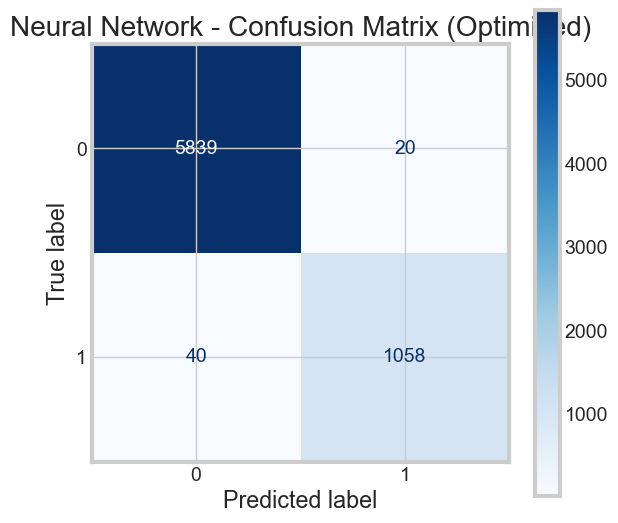

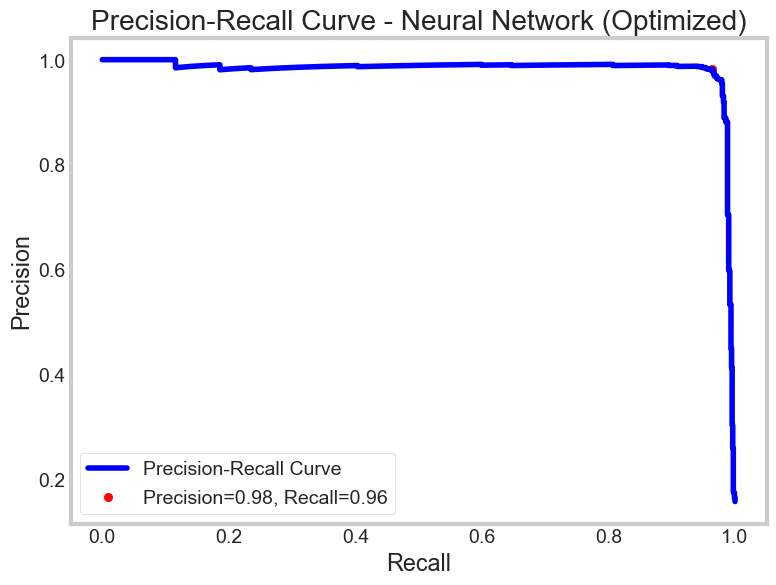

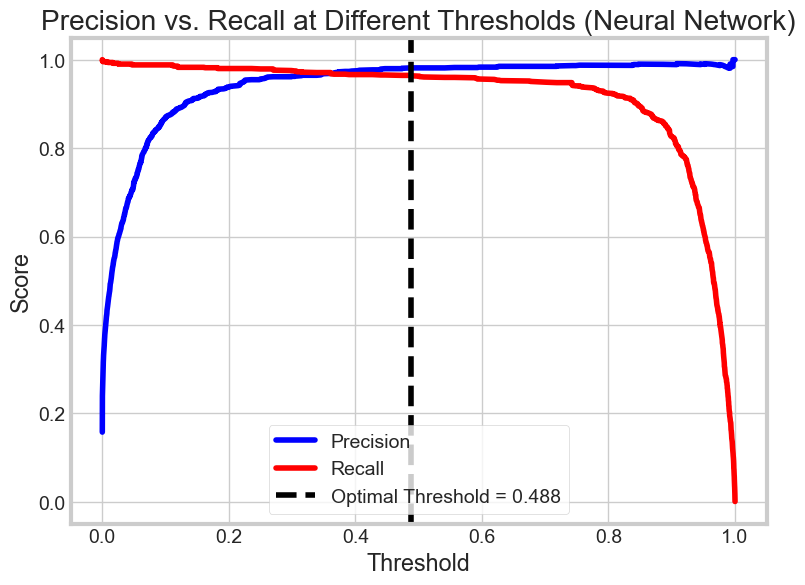

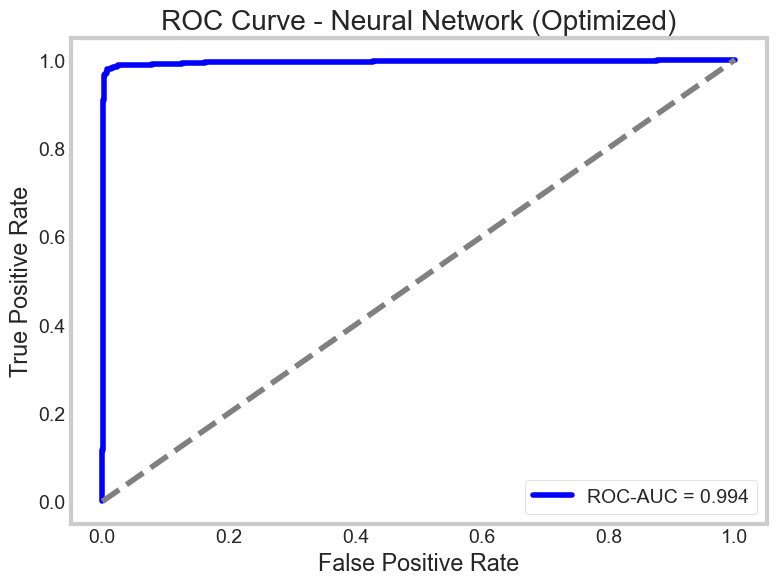


🔹 Final Model Comparison:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,KNN,0.991991,0.981601,0.954120,0.928051,0.940905,0.081555,0.994072,-
1,Logistic Regression,0.851211,0.855397,0.732323,0.132058,0.223765,0.130121,0.742225,-
2,Decision Tree,1.000000,0.992669,0.968666,0.985428,0.976975,0.237636,0.989727,-
3,SVM,0.953977,0.937186,0.970128,0.621129,0.757357,67.384571,0.973716,-
4,Random Forest,1.000000,0.997988,0.999079,0.988160,0.993590,2.259161,0.999933,-
5,AdaBoost,0.863163,0.863734,0.680288,0.257741,0.373844,2.844512,0.830764,-
6,KNN Fine Tuned,1.000000,0.997556,0.992707,0.991803,0.992255,38.572633,0.998640,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
7,KNN Fine Tuned - SelectKBest,1.000000,0.996406,0.992654,0.984517,0.988569,31.833620,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
8,KNN Fine Tuned - SelectKBest - Best Threshold,1.000000,0.996550,0.992661,0.985428,0.989031,36.773519,0.997938,"{'feature_selection__k': 15, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.851211,0.854679,0.716418,0.131148,0.221709,28.110595,0.742265,"{'classifier__C': 10, 'classifier__penalty': '..."


In [337]:
# **Step 1: Define `n_jobs` at the beginning**
n_jobs = -1  # ✅ Uses all CPU cores

# **Step 2: Define the Neural Network Model**
model = MLPClassifier(
    solver='sgd',  # Faster than Adam
    learning_rate='adaptive',
    max_iter=200,  # ⏳ Reduce training time
    batch_size=256,  # Larger batches = Faster computation
    momentum=0.9,  # Helps stabilize SGD
    early_stopping=True,  # ✅ Stops training if no improvement
    n_iter_no_change=5,  # Stops after 5 epochs of no improvement
    validation_fraction=0.1,  # 10% validation split for early stopping
    random_state=42
)

# **Step 3: Define Pipeline**
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', model)
])

# **Step 4: Hyperparameter Distributions for Random Search**
param_dist = {
    'classifier__hidden_layer_sizes': [(64, 32), (128, 64)],  # ⏳ Smaller networks
    'classifier__activation': ['relu'],  # Only use ReLU (faster)
    'classifier__alpha': uniform(0.0001, 0.001),  # Regularization
    'classifier__learning_rate_init': uniform(0.001, 0.01),  # Learning rate
}

# **Step 5: Perform Randomized Search for Best Model**
start_time = time.time()
random_search = RandomizedSearchCV(
    pipeline, param_distributions=param_dist, n_iter=10,  # ⏳ Reduce number of trials
    cv=3, scoring="f1", n_jobs=n_jobs, pre_dispatch="2*n_jobs", verbose=1, random_state=42  # ✅ Fixed pre_dispatch
)
random_search.fit(X_train, y_train)
fit_time = time.time() - start_time

# **Step 6: Best Model from Randomized Search**
best_pipeline = random_search.best_estimator_
best_params = random_search.best_params_

# **Step 7: Apply Optimized Threshold**
y_pred_proba = best_pipeline.predict_proba(X_test)[:, 1]
precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred_proba)
f1_scores = 2 * (precisions * recalls) / (precisions + recalls + 1e-9)
optimal_idx = np.argmax(f1_scores)
optimal_threshold = thresholds[optimal_idx]

print(f"🔹 Best Threshold for Maximum F1-Score: {optimal_threshold:.3f}")

y_pred_optimal = (y_pred_proba > optimal_threshold).astype(int)

# **Step 8: Compute Performance Metrics**
train_acc = best_pipeline.score(X_train, y_train)
test_acc = best_pipeline.score(X_test, y_test)
precision = precision_score(y_test, y_pred_optimal, zero_division=0)
recall = recall_score(y_test, y_pred_optimal, zero_division=0)
f1 = f1_score(y_test, y_pred_optimal, zero_division=0)
roc_auc = roc_auc_score(y_test, y_pred_proba)

# **Step 9: Print Metrics**
print("\n🔹 Classification Report (Optimized Neural Network - Random Search):\n")
print(classification_report(y_test, y_pred_optimal))
print(f"🔹 Training Accuracy: {train_acc:.4f}")
print(f"🔹 Test Accuracy: {test_acc:.4f}")
print(f"🔹 Precision: {precision:.4f}")
print(f"🔹 Recall: {recall:.4f}")
print(f"🔹 F1 Score: {f1:.4f}  🚀 **(Improved!)**")
print(f"🔹 ROC-AUC Score: {roc_auc:.4f}")
print(f"🔹 Training Time: {fit_time:.2f} seconds")

# **Step 11: Store Results**
current_results = pd.DataFrame([[
    "Neural Network (Random Search Optimized - Fast)",
    train_acc,
    test_acc,
    precision,
    recall,
    f1,
    fit_time,
    roc_auc,
    best_params
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

try:
    results_df = pd.concat([results_df, current_results], ignore_index=True)
except NameError:
    results_df = current_results

# **Step 4: Plot Confusion Matrix**
cm = confusion_matrix(y_test, y_pred_optimal)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("Neural Network - Confusion Matrix (Optimized)")
plt.show()

# **Step 5: Plot Precision-Recall Curve**
plt.figure(figsize=(8, 6))
plt.plot(recalls, precisions, label="Precision-Recall Curve", color="blue")
plt.scatter(recall, precision, color="red", label=f'Precision={precision:.2f}, Recall={recall:.2f}')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve - Neural Network (Optimized)")
plt.legend()
plt.grid()
plt.show()

# **Step 6: Plot Precision vs. Recall at Different Thresholds**
plt.figure(figsize=(8, 6))
plt.plot(thresholds, precisions[:-1], label="Precision", color="blue")
plt.plot(thresholds, recalls[:-1], label="Recall", color="red")
plt.axvline(optimal_threshold, color='black', linestyle='--', label=f"Optimal Threshold = {optimal_threshold:.3f}")
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("Precision vs. Recall at Different Thresholds (Neural Network)")
plt.legend()
plt.show()

# **Step 7: Plot ROC Curve**
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC-AUC = {roc_auc:.3f}", color="blue")
plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Neural Network (Optimized)")
plt.legend()
plt.grid()
plt.show()


# **Step 12: Display Final Results**
print("\n🔹 Final Model Comparison:")
results_df

In [339]:
# Save DataFrame to CSV
results_df.to_csv('results.csv', index=False)

print("CSV file saved successfully.")

CSV file saved successfully.
